# Result

## Library, Import Data

In [4]:
import pandas as pd
import numpy as np

from hmmlearn import hmm

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score

from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt

import seaborn as sns

from scipy.stats import ttest_ind

In [5]:
np.set_printoptions(suppress = True, precision = 10)

In [6]:
# Capture Production and SST Summary 2003-2022
df_marine = pd.read_csv("Final CSV for Model.csv", delimiter = ",")
df_marine.head()

,PERIOD,Species,Country,VALUE,Mean SST,Min SST,Max SST
0,2003,Marine fishes nei,Cambodia,33228.693,29.600625,28.44,31.80
1,2003,Stolephorus anchovies nei,Indonesia,60188.000,29.164124,22.18,33.98
2,2003,Stolephorus anchovies nei,Indonesia,100953.000,29.164124,22.18,33.98
3,2003,Kawakawa,Indonesia,20705.000,29.164124,22.18,33.98
4,2003,Kawakawa,Indonesia,163159.000,29.164124,22.18,33.98


In [7]:
def hmmlib(x, y, n_states):
    # Train-test split
    x_train = x[0:15]
    y_train = y[0:15]
    x_test = x[15:20]
    y_test = y[15:20]

    # Train model
    model = hmm.GaussianHMM(n_components = n_states, covariance_type = "diag", n_iter = 100, init_params = "")
    startprob = calculate_startprob_lib(n_states)
    transmat = calculate_transmat_lib(y, n_states)
    means, covars = calculate_means_covars_lib(x, y, n_states)

    init_means = means
    init_covars = covars
    init_startprob = startprob
    init_transmat = transmat
        
    model.startprob_ = startprob
    model.transmat_ = transmat
    model.means_ = means
    model.covars_ = covars
        
    model.fit(x_train)
    
    # Predict train data
    predhs_train = model.predict(x_train)
    # acc_train = accuracy_score(y_train, predhs_train)
    # prec_train = precision_score(y_train, predhs_train, average = "binary")
    # recall_train = recall_score(y_train, predhs_train, average = "binary")
    # f1_train = f1_score(y_train, predhs_train, average = "binary")

    # Predict test data
    predhs_test = model.predict(x_test)
    # acc_test = accuracy_score(y_test, predhs_test)
    # prec_test = precision_score(y_test, predhs_test, average = "binary")
    # recall_test = recall_score(y_test, predhs_test, average = "binary")
    # f1_test = f1_score(y_test, predhs_test, average = "binary")

    # Updating trained parameters
    trained_startprob = model.startprob_
    trained_transmat = model.transmat_
    trained_means = model.means_
    trained_covars = model.covars_
    
    # print("Accuracy Train:", acc_train)
    # print("Accuracy Test: ", acc_test)
        
    # print("Precision Train:", prec_train)
    # print("Precision Test: ", prec_test)
        
    # print("Recall Train:", recall_train)
    # print("Recall Test: ", recall_test)
        
    # print("F1-score Train:", f1_train)
    # print("F1-score Test: ", f1_test)

    print("Predicted HS (train):", predhs_train)
    print("Actual HS (train):   ", y_train)

    print("Predicted HS (test):", predhs_test)
    print("Actual HS (test):   ", y_test)

    return trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x_train, y_train, predhs_train, x_test, y_test, predhs_test

In [8]:
def calculate_transmat_lib(hidden_states, n_states):
    transmat = np.full((n_states, n_states), 1e-10)

    for i in range(len(hidden_states) - 1):
        transmat[hidden_states[i], hidden_states[i + 1]] += 1

    row_sums = transmat.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1
    transmat = transmat / row_sums

    return transmat

def calculate_means_covars_lib(observations, hidden_states, n_states):
    n_features = observations.shape[1]
    
    means = np.zeros((n_states, n_features))
    covars = np.zeros((n_states, n_features))
    
    for state in range(n_states):
        state_obs = observations[hidden_states == state]
        
        if state_obs.shape[0] > 0:
            means[state] = state_obs.mean(axis=0)
            covars[state] = state_obs.var(axis=0)
    
    return means, covars

def calculate_startprob_lib(n_states):
    startprob = np.full(n_states, 1.0 / n_states)
    startprob = startprob / np.sum(startprob)
    
    return startprob

## GHMM Manual Code

In [9]:
def manualhmm(x, y, n_states, n_iter):    
    # Train-test split
    x_train = x[0:15]
    y_train = y[0:15]
    x_test = x[15:20]
    y_test = y[15:20]

    # Train model
    startprob, transmat, means, covars, init_startprob, init_transmat, init_means, init_covars = baum_welch(x, y, n_states, n_iter)

    # Predict train and test (last 5 data)
    predhs_x = viterbi(x, startprob, transmat, means, covars)

    # Update trained parameters
    trained_means = means
    trained_covars = covars
    trained_startprob = startprob
    trained_transmat = transmat

    print("Predicted HS (last 5 test) :", predhs_x[0])
    print("Actual HS (last 5 test)    :", y)
 
    return trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x[0]

In [10]:
def manualhmm_retrain(x, y, n_states, n_iter):    
    # Train model
    startprob, transmat, means, covars, init_startprob, init_transmat, init_means, init_covars = baum_welch(x, y, n_states, n_iter)

    # Predict hidden state for train data
    predhs_x = viterbi(x, startprob, transmat, means, covars)

    # Update trained parameters
    trained_means = means
    trained_covars = covars
    trained_startprob = startprob
    trained_transmat = transmat

    print("Predicted HS:", predhs_x[0])
    print("Actual HS:   ", y)

    return trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x[0]

In [11]:
def calculate_transmat(hidden_states, n_states):
    transmat = np.zeros((n_states, n_states))
    
    # Count transition from state i to j
    for i in range(len(hidden_states) - 1):
        transmat[hidden_states[i], hidden_states[i + 1]] += 1
    
    row_sums = transmat.sum(axis = 1, keepdims = True)
    row_sums[row_sums == 0] = 1
    transmat = transmat / row_sums
    
    return transmat

def calculate_means_covars(observations, hidden_states, n_states):
    n_features = observations.shape[1]
    
    means = np.zeros((n_states, n_features))
    covars = np.zeros((n_states, n_features))
    
    for state in range(n_states):
        state_obs = observations[hidden_states == state]
        
        if state_obs.shape[0] > 0:
            means[state] = state_obs.mean(axis = 0)
            covars[state] = np.var(state_obs, axis = 0)
    
    covars = np.array([np.diag(covars[state]) if np.all(covars[state] != 0) else np.eye(n_features) * 1e-6 for state in range(n_states)])
    
    return means, covars

def calculate_startprob(n_states):
    # Initialize the start probability to be the same in every state
    startprob = np.ones(n_states) / n_states
    startprob = startprob / np.sum(startprob)
    
    return startprob

def gaussian_pdf(x, mean, cov):
    dim = mean.shape[0]
    a = x - mean
    b = np.sqrt(np.linalg.det(cov) * (2 * np.pi) ** dim)
    
    if b == 0:
        return 1e-10
        
    pdf = (1 / b) * np.exp(-0.5 * np.dot(a.T, np.dot(np.linalg.inv(cov), a)))  # Multivariate Gaussian PDF
    
    return max(pdf, 1e-10)

def forward_log(observations, startprob, transmat, means, covars):
    n_samples = observations.shape[0]
    n_states = transmat.shape[0]
    
    log_alpha = np.zeros((n_samples, n_states))
    
    # Init
    for i in range(n_states):
        pdf_val = gaussian_pdf(observations[0], means[i], covars[i])
        log_alpha[0, i] = np.log(startprob[i] + 1e-10) + np.log(pdf_val + 1e-10)
    
    # Recursion
    for t in range(1, n_samples):
        for j in range(n_states):
            log_alpha[t, j] = np.logaddexp.reduce(log_alpha[t - 1] + np.log(transmat[:, j] + 1e-10)) + \
                               np.log(gaussian_pdf(observations[t], means[j], covars[j]) + 1e-10)
    
    # Score (log-likelihood)
    score = np.logaddexp.reduce(log_alpha[-1])
    
    return log_alpha, score

def backward_log(observations, startprob, transmat, means, covars):
    n_samples = observations.shape[0]
    n_states = transmat.shape[0]
    
    log_beta = np.zeros((n_samples, n_states))
    
    # Init
    log_beta[-1, :] = 0  # log(1) = 0
    
    # Recursion
    for t in range(n_samples - 2, -1, -1):
        for i in range(n_states):
            log_beta[t, i] = np.logaddexp.reduce(np.log(transmat[i, :] + 1e-10) +
                                                 np.log([gaussian_pdf(observations[t + 1], means[j], covars[j]) + 1e-10 for j in range(n_states)]) +
                                                 log_beta[t + 1])
    
    return log_beta

def viterbi(observations, startprob, transmat, means, covars):
    n_samples = observations.shape[0]
    n_states = transmat.shape[0]
    
    log_prob = np.zeros((n_samples, n_states))
    backpointer = np.zeros((n_samples, n_states), dtype=int)
    
    log_startprob = np.log(startprob + 1e-10)
    log_transmat = np.log(transmat + 1e-10)
    
    # Init
    for i in range(n_states):
        log_prob[0, i] = log_startprob[i] + np.log(gaussian_pdf(observations[0], means[i], covars[i]) + 1e-10)
    
    # Recursion
    for t in range(1, n_samples):
        for j in range(n_states):
            max_val = log_prob[t - 1] + log_transmat[:, j]
            backpointer[t, j] = np.argmax(max_val)
            log_prob[t, j] = np.max(max_val) + np.log(gaussian_pdf(observations[t], means[j], covars[j]) + 1e-10)
    
    # Termination
    hidden_states = np.zeros(n_samples, dtype=int)
    hidden_states[-1] = np.argmax(log_prob[-1])
    
    # Backtrace hidden state
    for t in range(n_samples - 2, -1, -1):
        hidden_states[t] = backpointer[t + 1, hidden_states[t + 1]]
    
    # Score
    score = np.logaddexp.reduce(log_prob[-1])
    
    return hidden_states, score

def baum_welch(observations, hidden_states, n_states, n_iter):
    n_samples = observations.shape[0]
    n_features = observations.shape[1]
    
    # Init
    means, covars = calculate_means_covars(observations, hidden_states, n_states)
    startprob = calculate_startprob(n_states)
    transmat = calculate_transmat(hidden_states, n_states)

    # Save initial parameters to return
    initial_means = means.copy()
    initial_covars = covars.copy()
    initial_startprob = startprob.copy()
    initial_transmat = transmat.copy()

    # EM
    for i in range(n_iter):
        # EM-step
        log_alpha, score = forward_log(observations, startprob, transmat, means, covars)
        log_beta = backward_log(observations, startprob, transmat, means, covars)
        
        log_PO = np.logaddexp.reduce(log_alpha[-1])  # Find P(O)
        PO = np.exp(log_PO)
        
        # Calculate gamma: probability of being in state i at time t
        gamma = log_alpha + log_beta
        gamma = np.exp(gamma - log_PO)

        # Update initial state probability
        startprob = gamma[0]
        startprob = startprob / np.sum(startprob)

        # Find xi for transition matrix update
        xi = np.zeros((n_states, n_states))
        for t in range(n_samples - 1):
            for i in range(n_states):
                for j in range(n_states):
                    joint_prob = (np.exp(log_alpha[t, i]) * transmat[i, j] * 
                                  gaussian_pdf(observations[t + 1], means[j], covars[j]) * 
                                  np.exp(log_beta[t + 1, j]))
                    xi[i, j] += joint_prob / PO

        transmat = xi / xi.sum(axis=1, keepdims=True)
        
        # Update means for each state
        for state in range(n_states):
            weighted_sum = np.dot(gamma[:, state], observations)
            means[state] = weighted_sum / gamma[:, state].sum()

        # Update covariances for each state
        for state in range(n_states):
            weighted_cov = np.zeros((n_features, n_features))
            for t in range(n_samples):
                diff = observations[t] - means[state]
                weighted_cov += gamma[t, state] * np.outer(diff, diff)
            covars[state] = weighted_cov / gamma[:, state].sum()

    return startprob, transmat, means, covars, initial_startprob, initial_transmat, initial_means, initial_covars

## Function to Assign HS

In [12]:
# Function to assign hidden state based on SST level (0: low SST, 1: high SST)
def hs_interval(df):
    min_sst = df["Mean SST"].min()
    max_sst = df["Mean SST"].max()

    midpoint = (max_sst + min_sst) / 2

    sst = df["Mean SST"].values
    hs = np.where(sst < midpoint, 0, 1)

    df["Hidden State (Interval)"] = hs

    print("Min SST:", min_sst)
    print("Max SST:", max_sst)
    print("Midpoint:", midpoint)

    return df, midpoint

## Marine fishes nei (model + forecast done)

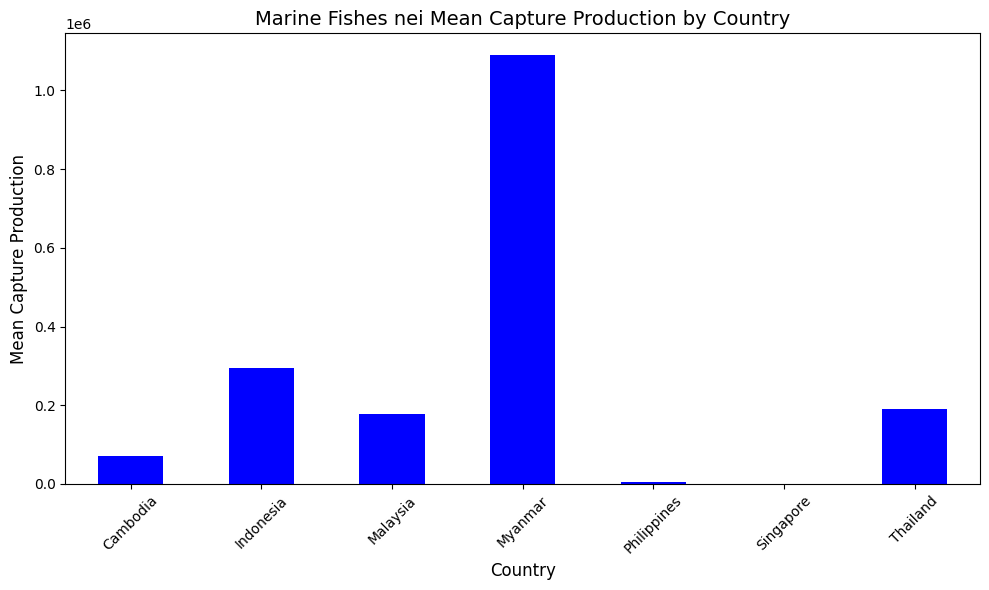

In [13]:
# Plot Marine Fishes nei bar chart for every country.
marinef_df = df_marine[df_marine["Species"] == "Marine fishes nei"]

mean_by_country = marinef_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Country", fontsize = 12)
plt.ylabel("Mean Capture Production", fontsize = 12)
plt.title("Marine Fishes nei Mean Capture Production by Country", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Myanmar

#### Extract Data

Min SST: 28.40160282953761
Max SST: 29.26533564814815
Midpoint: 28.83346923884288


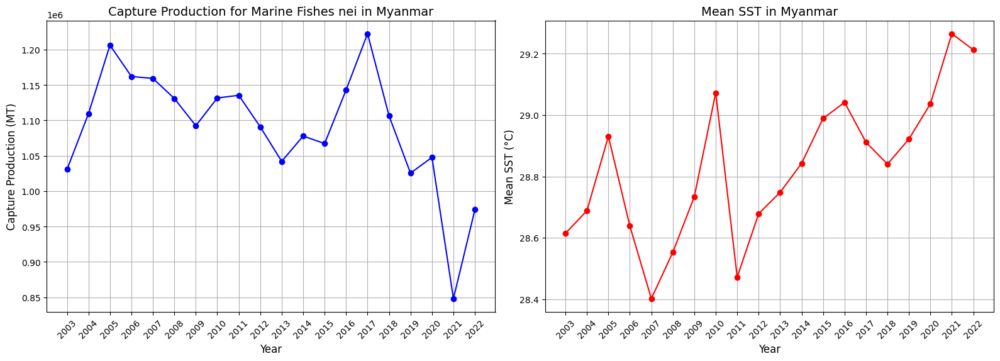

In [14]:
# Extract Marine fishes nei
marinef_mn = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Myanmar")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_mn = marinef_mn[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_mn = marinef_mn.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
marinef_mn = marinef_mn.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
marinef_mn["PERIOD"] = marinef_mn["PERIOD"].astype(int)

# Assign hidden states by equal intervals
marinef_mn, midpoint = hs_interval(marinef_mn)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_mn["PERIOD"], marinef_mn["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Marine Fishes nei in Myanmar", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(marinef_mn["PERIOD"], marinef_mn["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Myanmar", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = marinef_mn["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

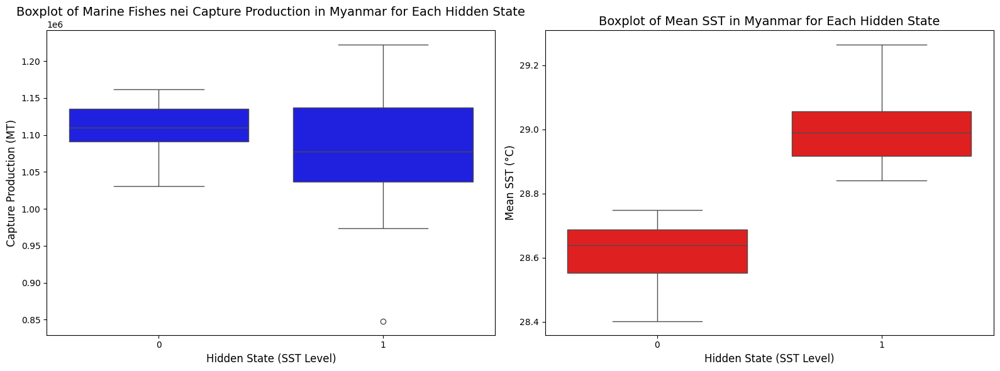

T-statistic: 0.7490502992679556, P-value: 0.4635039907528653
Observation Data: 
 [[1030720.]
 [1109640.]
 [1206330.]
 [1162100.]
 [1159400.]
 [1131000.]
 [1092500.]
 [1131700.]
 [1135531.]
 [1090902.]
 [1042127.]
 [1077905.]
 [1067300.]
 [1143070.]
 [1222620.]
 [1106578.]
 [1025505.]
 [1047728.]
 [ 848069.]
 [ 973765.]]
Hidden State - Interval: 
 [0 0 1 0 0 0 0 1 0 0 0 1 1 1 1 1 1 1 1 1]


In [15]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_mn, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Myanmar for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_mn, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Myanmar for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
marinef_mn_0 = marinef_mn[marinef_mn["Hidden State (Interval)"] == 0]["VALUE"]
marinef_mn_1 = marinef_mn[marinef_mn["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_mn_0, marinef_mn_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_mn_hs_int = marinef_mn.pop("Hidden State (Interval)").values

marinef_mn_x = marinef_mn.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_mn_x = marinef_mn_x.values

print("Observation Data: \n", marinef_mn_x)
print("Hidden State - Interval: \n", marinef_mn_hs_int)

### Cambodia

#### Extract Data

Min SST: 29.182857142857145
Max SST: 29.88958333333333
Midpoint: 29.53622023809524


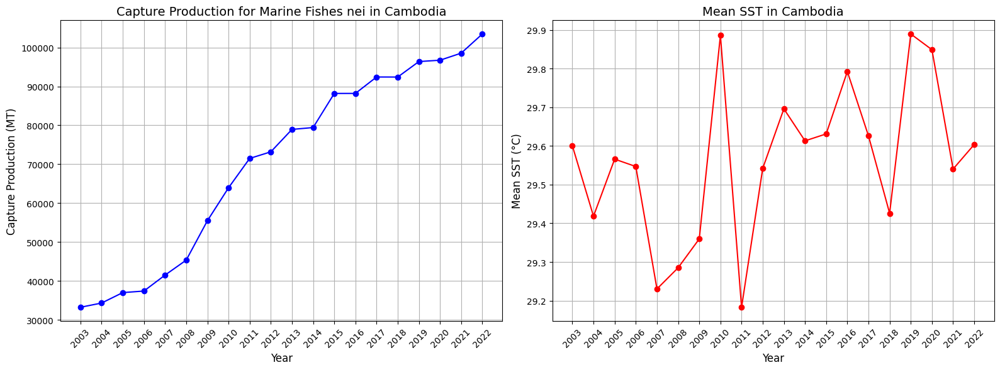

In [16]:
# Extract Marine fishes nei
marinef_ca = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Cambodia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_ca = marinef_ca[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_ca = marinef_ca.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
marinef_ca = marinef_ca.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
marinef_ca["PERIOD"] = marinef_ca["PERIOD"].astype(int)

# Assign hidden states by equal intervals
marinef_ca, midpoint = hs_interval(marinef_ca)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_ca["PERIOD"], marinef_ca["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Marine Fishes nei in Cambodia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(marinef_ca["PERIOD"], marinef_ca["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Cambodia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = marinef_ca["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

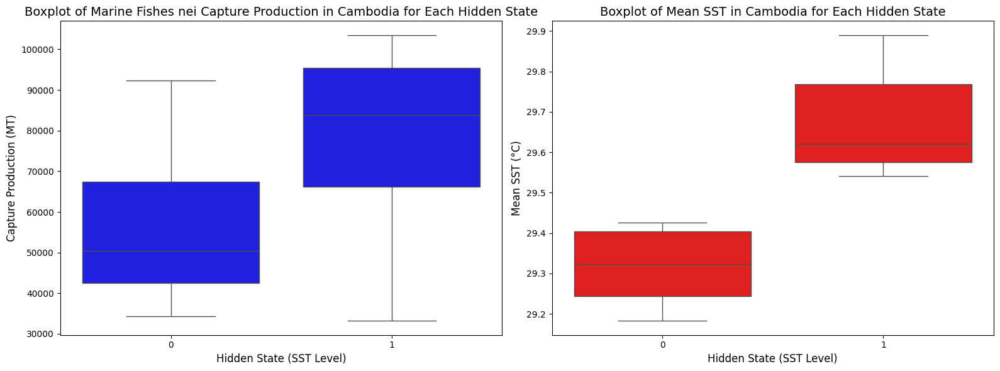

T-statistic: -1.688719776818656, P-value: 0.10852119526265282
Observation Data: 
 [[ 33228.693]
 [ 34319.544]
 [ 37000.   ]
 [ 37400.   ]
 [ 41500.   ]
 [ 45345.   ]
 [ 55460.   ]
 [ 63938.292]
 [ 71487.15 ]
 [ 73180.679]
 [ 78946.424]
 [ 79426.   ]
 [ 88189.154]
 [ 88200.   ]
 [ 92419.091]
 [ 92407.478]
 [ 96382.992]
 [ 96735.   ]
 [ 98548.289]
 [103475.   ]]
Hidden State - Interval: 
 [1 0 1 1 0 0 0 1 0 1 1 1 1 1 1 0 1 1 1 1]


In [17]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_ca, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Cambodia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_ca, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Cambodia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
marinef_ca_0 = marinef_ca[marinef_ca["Hidden State (Interval)"] == 0]["VALUE"]
marinef_ca_1 = marinef_ca[marinef_ca["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_ca_0, marinef_ca_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_ca_hs_int = marinef_ca.pop("Hidden State (Interval)").values

marinef_ca_x = marinef_ca.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_ca_x = marinef_ca_x.values

print("Observation Data: \n", marinef_ca_x)
print("Hidden State - Interval: \n", marinef_ca_hs_int)

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


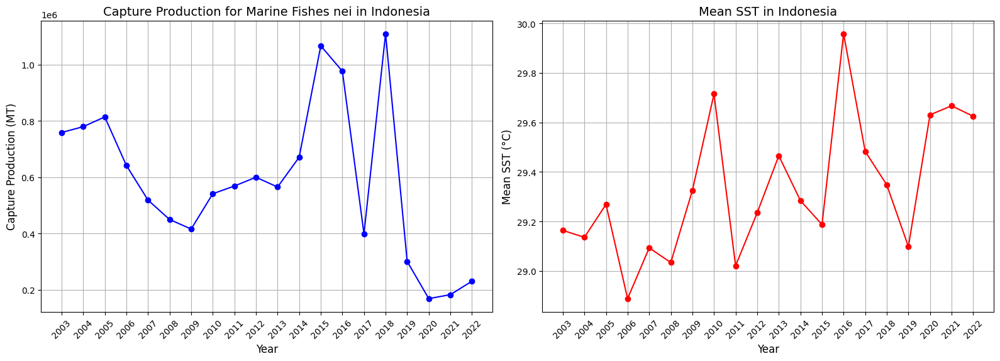

In [79]:
# Extract Marine fishes nei
marinef_id = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_id = marinef_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_id = marinef_id.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
marinef_id = marinef_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
marinef_id["PERIOD"] = marinef_id["PERIOD"].astype(int)

# Assign hidden states by equal intervals
marinef_id, midpoint = hs_interval(marinef_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_id["PERIOD"], marinef_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Marine Fishes nei in Indonesia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(marinef_id["PERIOD"], marinef_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Indonesia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = marinef_id["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

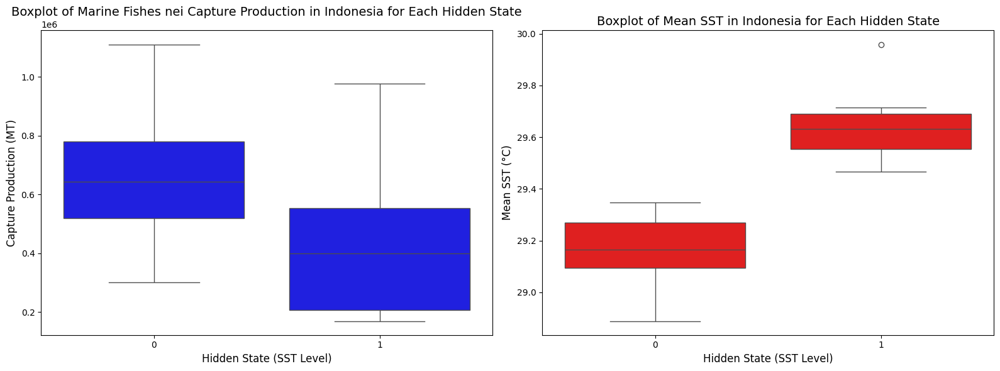

T-statistic: 1.8144608754788765, P-value: 0.09824159540621762
Observation Data: 
 [[ 759116.   ]
 [ 779690.   ]
 [ 814489.   ]
 [ 641894.   ]
 [ 519110.   ]
 [ 449959.   ]
 [ 416119.   ]
 [ 541498.   ]
 [ 568851.   ]
 [ 600160.025]
 [ 565301.431]
 [ 671473.4  ]
 [1067199.694]
 [ 976873.529]
 [ 399107.324]
 [1110233.188]
 [ 300986.805]
 [ 168759.688]
 [ 182906.588]
 [ 230761.895]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [80]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Indonesia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
marinef_id_0 = marinef_id[marinef_id["Hidden State (Interval)"] == 0]["VALUE"]
marinef_id_1 = marinef_id[marinef_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_id_0, marinef_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_id_hs_int = marinef_id.pop("Hidden State (Interval)").values

marinef_id_x = marinef_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_id_x = marinef_id_x.values

print("Observation Data: \n", marinef_id_x)
print("Hidden State - Interval: \n", marinef_id_hs_int)

#### Model

In [81]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(marinef_id_x, marinef_id_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

marinef_id = pd.concat([marinef_id.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


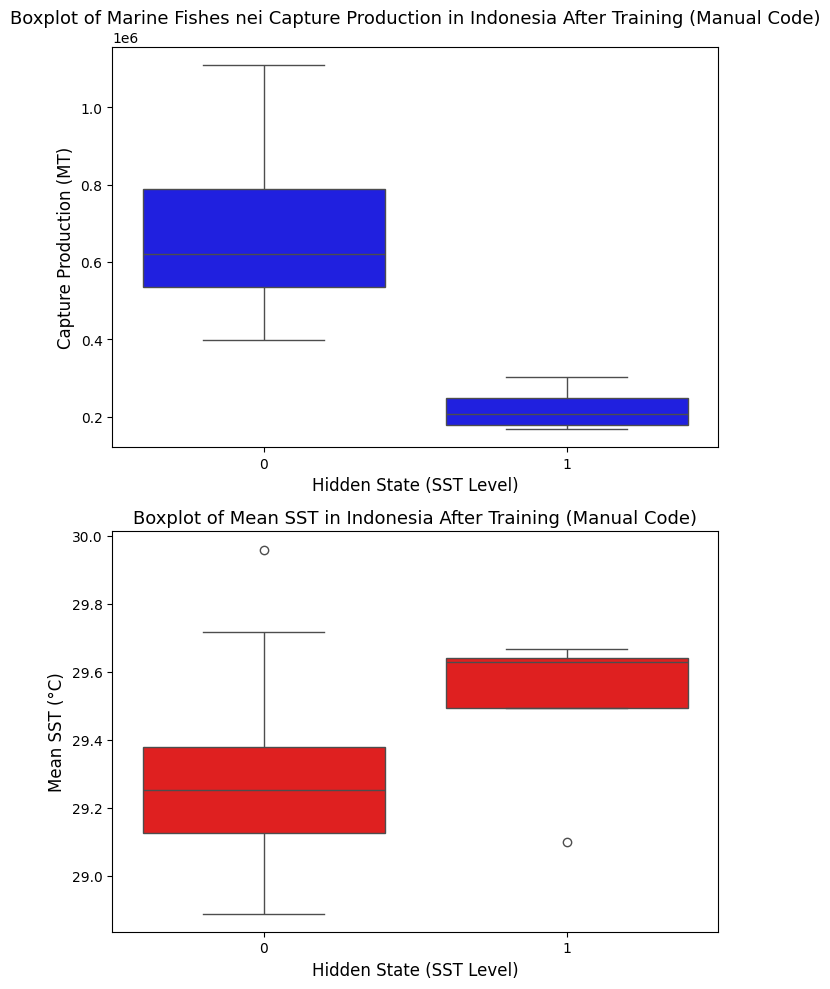

In [82]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (7, 10), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = marinef_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Indonesia After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x="Predicted HS (Manual Code)", y = "Mean SST", data = marinef_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [83]:
# Mean of every state (trained)
mean_sst_state = marinef_id.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

mean_sst_state = marinef_id.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
marinef_id_0 = marinef_id[marinef_id["Predicted HS (Manual Code)"] == 0]["Mean SST"]
marinef_id_1 = marinef_id[marinef_id["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_id_0, marinef_id_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (Manual Code)
0    29.288144
1    29.505625
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.160440
1    29.649582
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -1.4323161313037613, p-value: 0.21631341557434777


Note: p-val > 0.10, no need for re-training, HS doesn't represent SST level anymore.

### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


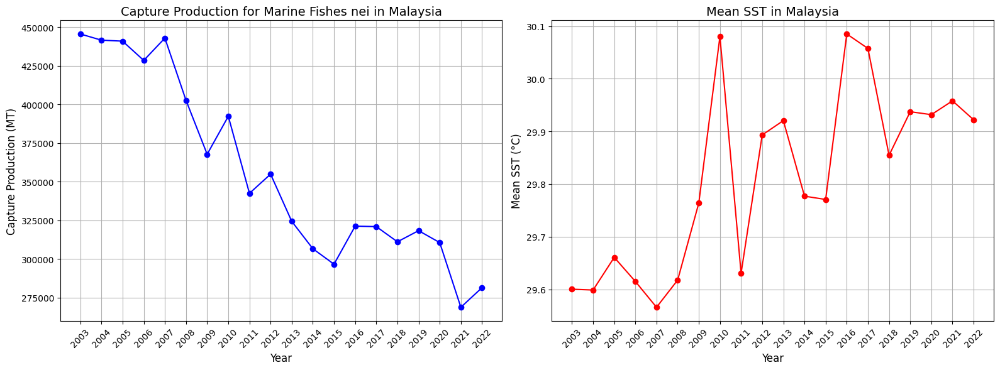

In [21]:
# Extract Marine fishes nei
marinef_my = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_my = marinef_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_my = marinef_my.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
marinef_my = marinef_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
marinef_my["PERIOD"] = marinef_my["PERIOD"].astype(int)

# Assign hidden states by equal intervals
marinef_my, midpoint = hs_interval(marinef_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_my["PERIOD"], marinef_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Marine Fishes nei in Malaysia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(marinef_my["PERIOD"], marinef_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Malaysia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = marinef_my["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

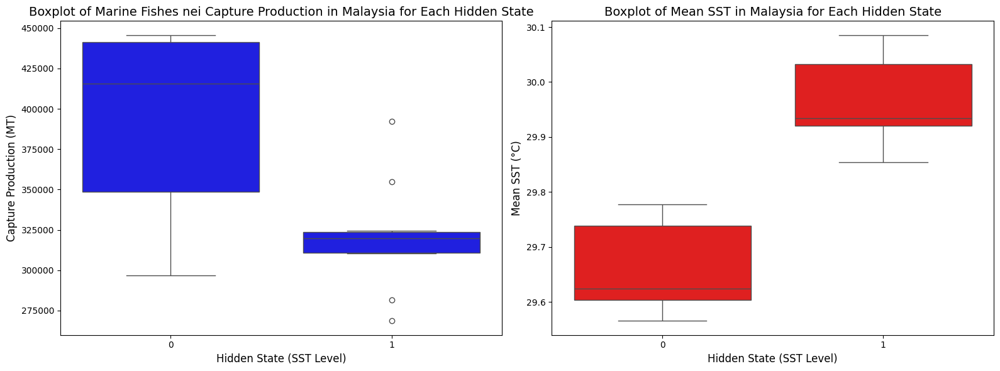

T-statistic: 3.296381161153465, P-value: 0.004013235153310379
Observation Data: 
 [[445610.   ]
 [441599.   ]
 [440961.   ]
 [428482.   ]
 [442938.   ]
 [402631.   ]
 [367750.   ]
 [392320.   ]
 [342442.   ]
 [354875.   ]
 [324318.237]
 [306566.141]
 [296561.409]
 [321202.378]
 [320904.712]
 [311071.651]
 [318279.835]
 [310562.466]
 [268680.   ]
 [281365.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [22]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Malaysia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
marinef_my_0 = marinef_my[marinef_my["Hidden State (Interval)"] == 0]["VALUE"]
marinef_my_1 = marinef_my[marinef_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_my_0, marinef_my_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_my_hs_int = marinef_my.pop("Hidden State (Interval)").values

marinef_my_x = marinef_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_my_x = marinef_my_x.values

print("Observation Data: \n", marinef_my_x)
print("Hidden State - Interval: \n", marinef_my_hs_int)

#### Model

In [23]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(marinef_my_x, marinef_my_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

marinef_my = pd.concat([marinef_my.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


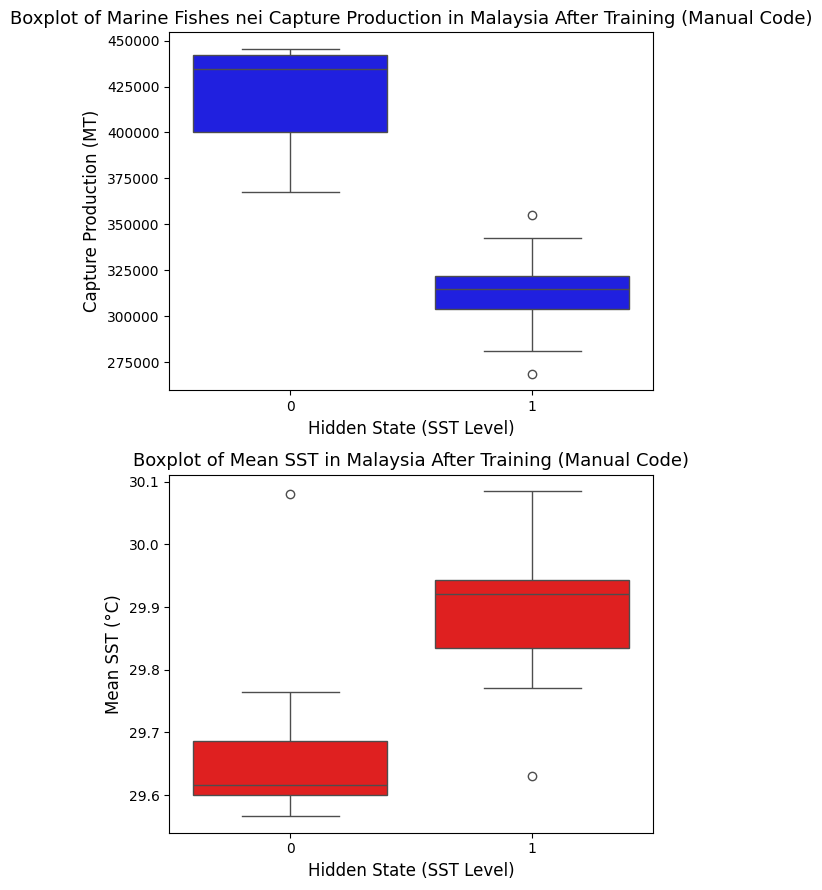

In [24]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = marinef_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Malaysia After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x="Predicted HS (Manual Code)", y = "Mean SST", data = marinef_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [25]:
# Mean of every state (trained)
mean_sst_state = marinef_my.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = marinef_my.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
marinef_my_0 = marinef_my[marinef_my["Predicted HS (Manual Code)"] == 0]["Mean SST"]
marinef_my_1 = marinef_my[marinef_my["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_my_0, marinef_my_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.687736
1    29.894882
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.659935
1    29.964113
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -2.9583522269773366, p-value: 0.011964219007510695


#### Re-train

In [26]:
# Manual Code (retrain and forecast)
marinef_my_x_retrain = marinef_my_x[:-1]
marinef_my_hs_int_retrain = marinef_my_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(marinef_my_x_retrain, marinef_my_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1]


In [27]:
# Forecast 2022
sst2022_my = marinef_my[marinef_my["PERIOD"] == 2022]["Mean SST"].values

if sst2022_my < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([273612.9580210266]), array([358189.1076608681]))


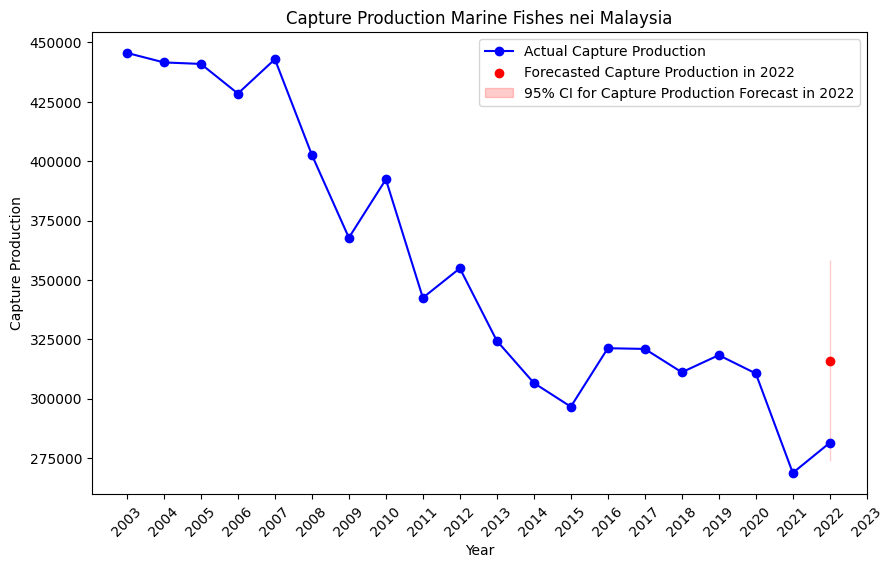

In [28]:
# Plot for CP
years = marinef_my["PERIOD"].values
values = marinef_my["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Marine Fishes nei Malaysia")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


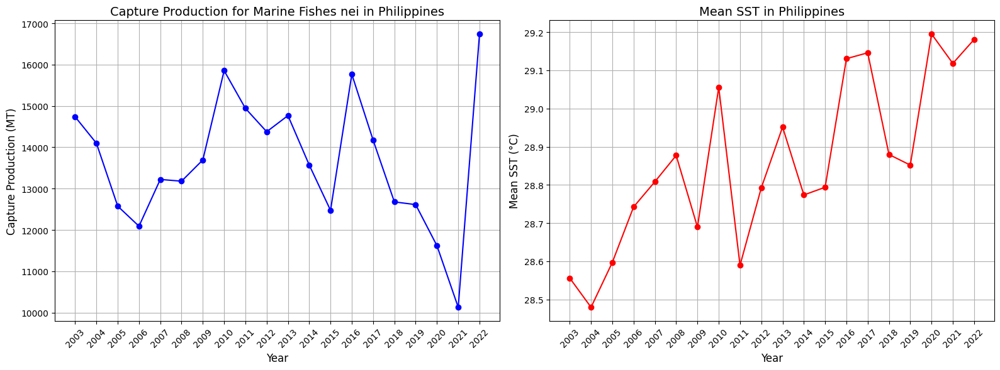

In [29]:
# Extract Marine fishes nei
marinef_ph = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_ph = marinef_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_ph = marinef_ph.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
marinef_ph = marinef_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
marinef_ph["PERIOD"] = marinef_ph["PERIOD"].astype(int)

# Assign hidden states by equal intervals
marinef_ph, midpoint = hs_interval(marinef_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_ph["PERIOD"], marinef_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Marine Fishes nei in Philippines", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(marinef_ph["PERIOD"], marinef_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Philippines", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = marinef_ph["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

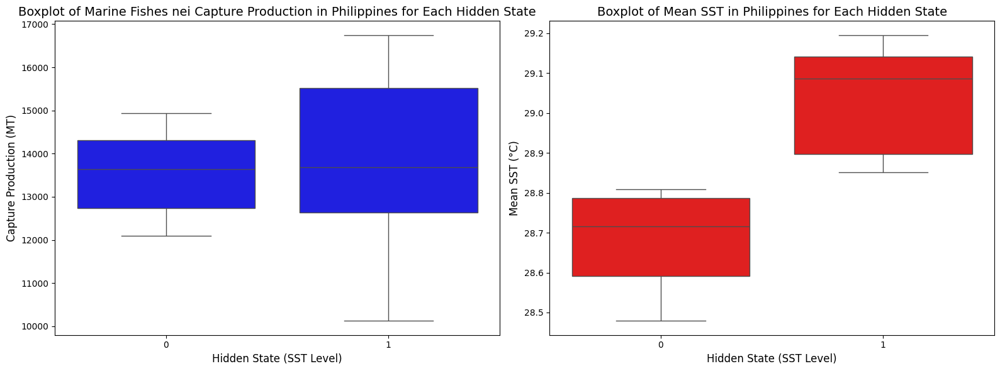

T-statistic: -0.2392972241685151, P-value: 0.8135786929755657
Observation Data: 
 [[14738.   ]
 [14098.   ]
 [12576.   ]
 [12090.   ]
 [13222.   ]
 [13180.   ]
 [13695.   ]
 [15856.   ]
 [14943.   ]
 [14377.   ]
 [14768.   ]
 [13571.   ]
 [12474.   ]
 [15769.   ]
 [14175.   ]
 [12678.   ]
 [12613.   ]
 [11618.42 ]
 [10127.45 ]
 [16743.379]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [30]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Philippines for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
marinef_ph_0 = marinef_ph[marinef_ph["Hidden State (Interval)"] == 0]["VALUE"]
marinef_ph_1 = marinef_ph[marinef_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_ph_0, marinef_ph_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_ph_hs_int = marinef_ph.pop("Hidden State (Interval)").values

marinef_ph_x = marinef_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_ph_x = marinef_ph_x.values

print("Observation Data: \n", marinef_ph_x)
print("Hidden State - Interval: \n", marinef_ph_hs_int)

### Singapore

#### Extract Data

Min SST: 29.746875
Max SST: 30.52909722222222
Midpoint: 30.13798611111111


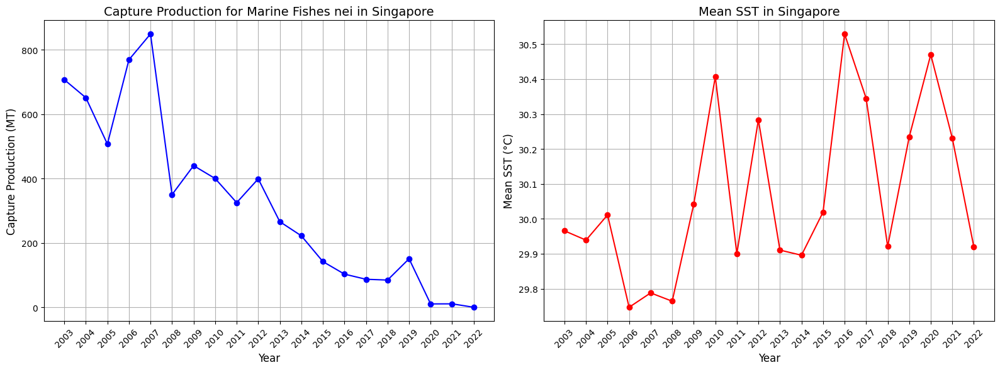

In [31]:
# Extract Marine fishes nei
marinef_sg = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Singapore")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_sg = marinef_sg[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_sg = marinef_sg.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
marinef_sg = marinef_sg.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
marinef_sg["PERIOD"] = marinef_sg["PERIOD"].astype(int)

# Assign hidden states by equal intervals
marinef_sg, midpoint = hs_interval(marinef_sg)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_sg["PERIOD"], marinef_sg["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Marine Fishes nei in Singapore", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(marinef_sg["PERIOD"], marinef_sg["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Singapore", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = marinef_sg["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

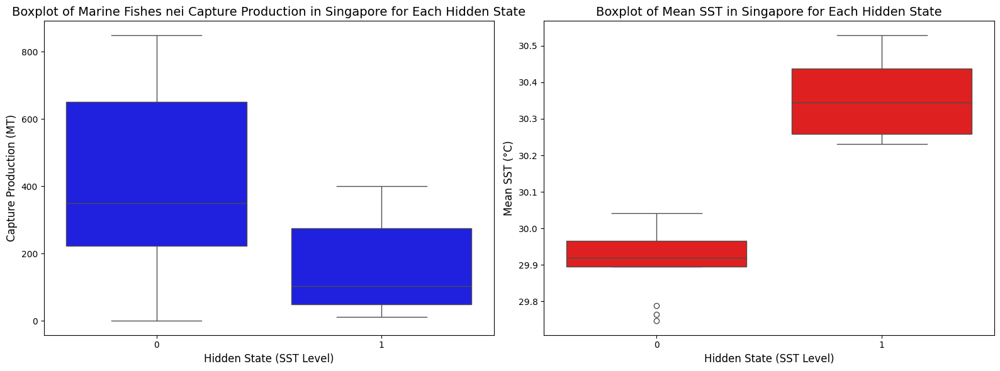

T-statistic: 2.1356324105286277, P-value: 0.04670275968079484
Observation Data: 
 [[707.   ]
 [651.   ]
 [507.   ]
 [769.   ]
 [849.   ]
 [350.   ]
 [440.   ]
 [400.   ]
 [325.   ]
 [399.   ]
 [266.   ]
 [222.   ]
 [142.   ]
 [103.   ]
 [ 87.   ]
 [ 84.54 ]
 [150.735]
 [ 10.45 ]
 [ 10.7  ]
 [  0.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


In [32]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Singapore for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Singapore for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
marinef_sg_0 = marinef_sg[marinef_sg["Hidden State (Interval)"] == 0]["VALUE"]
marinef_sg_1 = marinef_sg[marinef_sg["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_sg_0, marinef_sg_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_sg_hs_int = marinef_sg.pop("Hidden State (Interval)").values

marinef_sg_x = marinef_sg.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_sg_x = marinef_sg_x.values

print("Observation Data: \n", marinef_sg_x)
print("Hidden State - Interval: \n", marinef_sg_hs_int)

#### Model

In [33]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(marinef_sg_x, marinef_sg_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

marinef_sg = pd.concat([marinef_sg.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


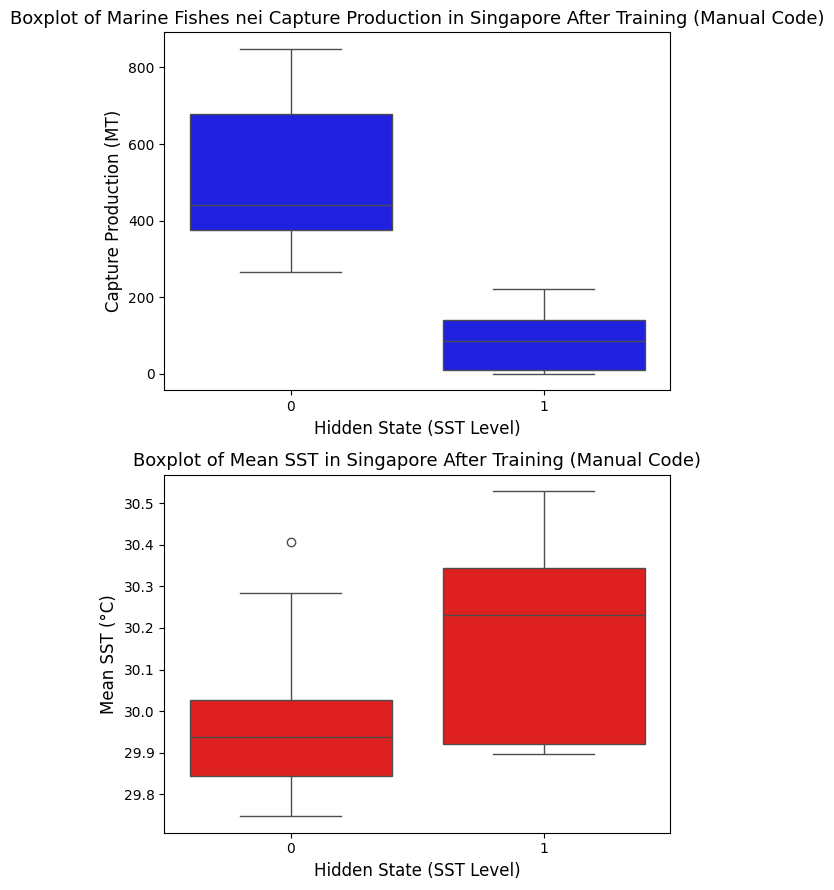

In [34]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = marinef_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Singapore After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x="Predicted HS (Manual Code)", y = "Mean SST", data = marinef_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Singapore After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [35]:
# Mean of every state (trained)
mean_sst_state = marinef_sg.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = marinef_sg.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
marinef_sg_0 = marinef_sg[marinef_sg["Predicted HS (Manual Code)"] == 0]["Mean SST"]
marinef_sg_1 = marinef_sg[marinef_sg["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_sg_0, marinef_sg_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.978005
1    30.173843
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.909475
1    30.357067
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -1.9043600762351316, p-value: 0.0752513828678782


#### Re-train

In [36]:
# Manual Code (retrain and forecast)
marinef_sg_x_retrain = marinef_sg_x[:-1]
marinef_sg_hs_int_retrain = marinef_sg_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(marinef_sg_x_retrain, marinef_sg_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1]


In [37]:
# Forecast 2022
sst2022_sg = marinef_sg[marinef_sg["PERIOD"] == 2022]["Mean SST"].values

if sst2022_sg < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 0
Estimated CP for 2022: 
(array([138.8616475407]), array([884.9925680318]))


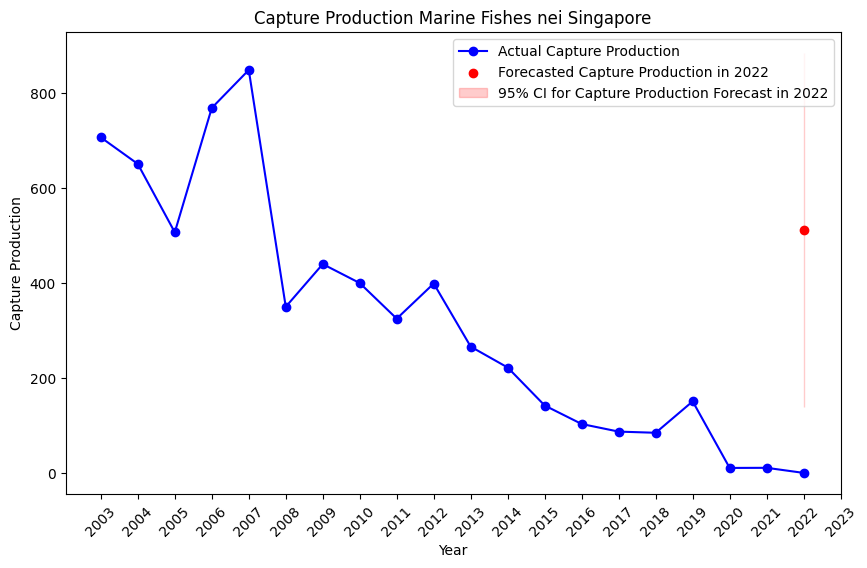

In [38]:
# Plot for CP
years = marinef_sg["PERIOD"].values
values = marinef_sg["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Marine Fishes nei Singapore")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


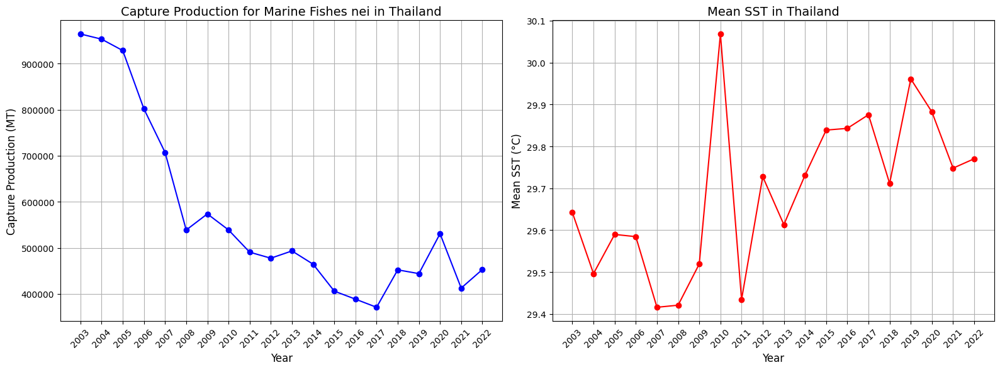

In [39]:
# Extract Marine fishes nei
marinef_th = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_th = marinef_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_th = marinef_th.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
marinef_th = marinef_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
marinef_th["PERIOD"] = marinef_th["PERIOD"].astype(int)

# Assign hidden states by equal intervals
marinef_th, midpoint = hs_interval(marinef_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_th["PERIOD"], marinef_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Marine Fishes nei in Thailand", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(marinef_th["PERIOD"], marinef_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Thailand", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = marinef_th["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

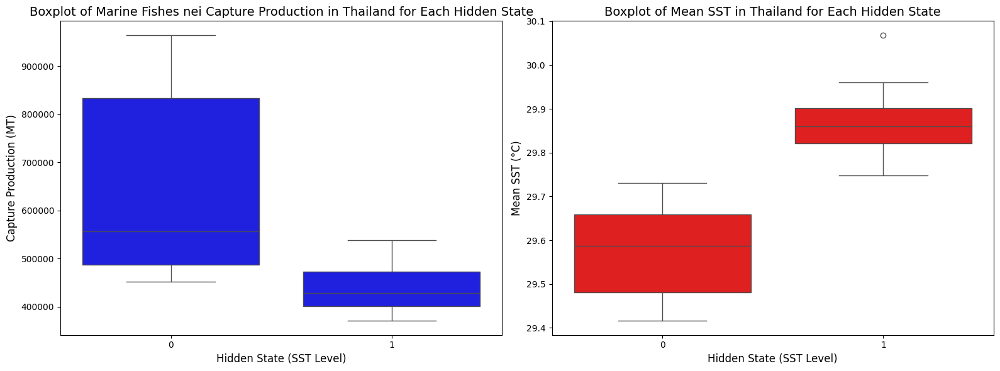

T-statistic: 2.7885371138034, P-value: 0.012130926876953444
Observation Data: 
 [[964149.   ]
 [952897.   ]
 [928177.   ]
 [801681.   ]
 [707224.   ]
 [538784.   ]
 [573740.   ]
 [538968.   ]
 [490674.   ]
 [477640.   ]
 [493382.   ]
 [464599.   ]
 [406174.   ]
 [388777.816]
 [371140.03 ]
 [452353.28 ]
 [444168.23 ]
 [530795.45 ]
 [412798.86 ]
 [452993.82 ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [40]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Thailand for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Thailand for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
marinef_th_0 = marinef_th[marinef_th["Hidden State (Interval)"] == 0]["VALUE"]
marinef_th_1 = marinef_th[marinef_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_th_0, marinef_th_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_th_hs_int = marinef_th.pop("Hidden State (Interval)").values

marinef_th_x = marinef_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_th_x = marinef_th_x.values

print("Observation Data: \n", marinef_th_x)
print("Hidden State - Interval: \n", marinef_th_hs_int)

#### Model

In [41]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(marinef_th_x, marinef_th_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

marinef_th = pd.concat([marinef_th.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


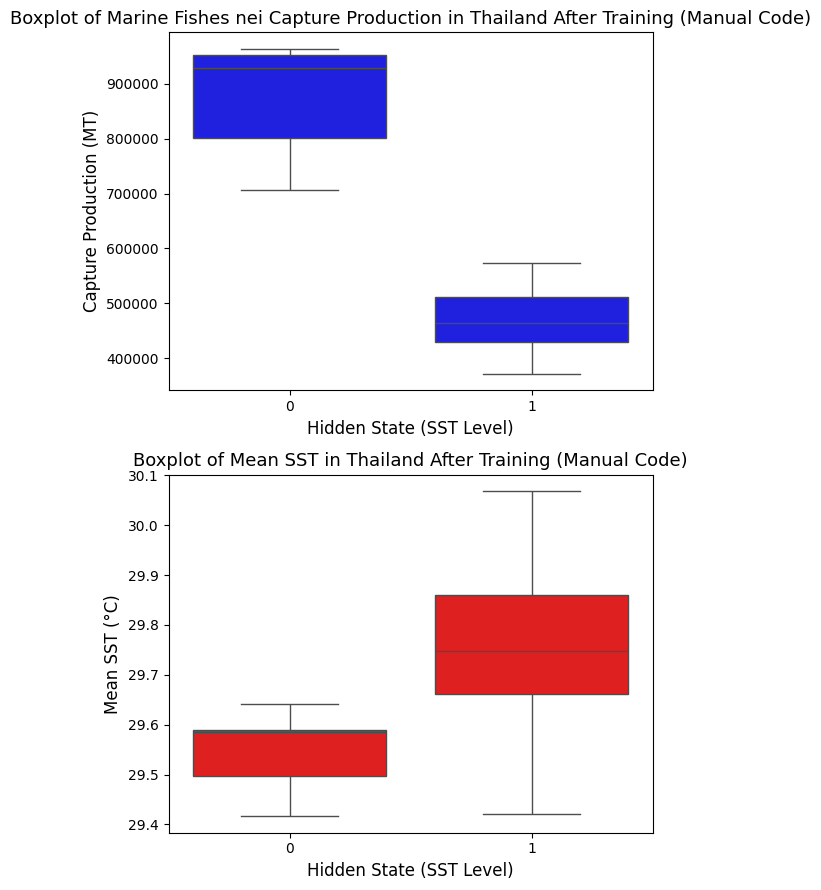

In [42]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = marinef_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Marine Fishes nei Capture Production in Thailand After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x="Predicted HS (Manual Code)", y = "Mean SST", data = marinef_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Thailand After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [43]:
# Mean of every state (trained)
mean_sst_state = marinef_th.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = marinef_th.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
marinef_th_0 = marinef_th[marinef_th["Predicted HS (Manual Code)"] == 0]["Mean SST"]
marinef_th_1 = marinef_th[marinef_th["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_th_0, marinef_th_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.545883
1    29.743132
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.574047
1    29.873479
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -3.169102327003633, p-value: 0.006414548289347363


#### Re-train

In [44]:
# Manual Code (retrain and forecast)
marinef_th_x_retrain = marinef_th_x[:-1]
marinef_th_hs_int_retrain = marinef_th_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(marinef_th_x_retrain, marinef_th_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1]


In [45]:
# Forecast 2022
sst2022_th = marinef_th[marinef_th["PERIOD"] == 2022]["Mean SST"].values

if sst2022_th < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([353351.2012509299]), array([587281.8715722406]))


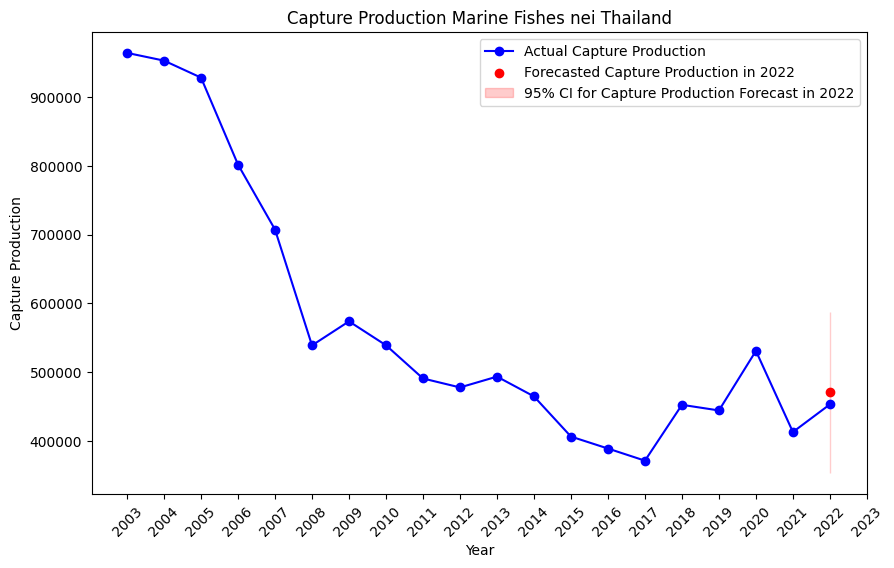

In [46]:
# Plot for CP
years = marinef_th["PERIOD"].values
values = marinef_th["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Marine Fishes nei Thailand")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

## Sardinellas nei (model + forecast done)

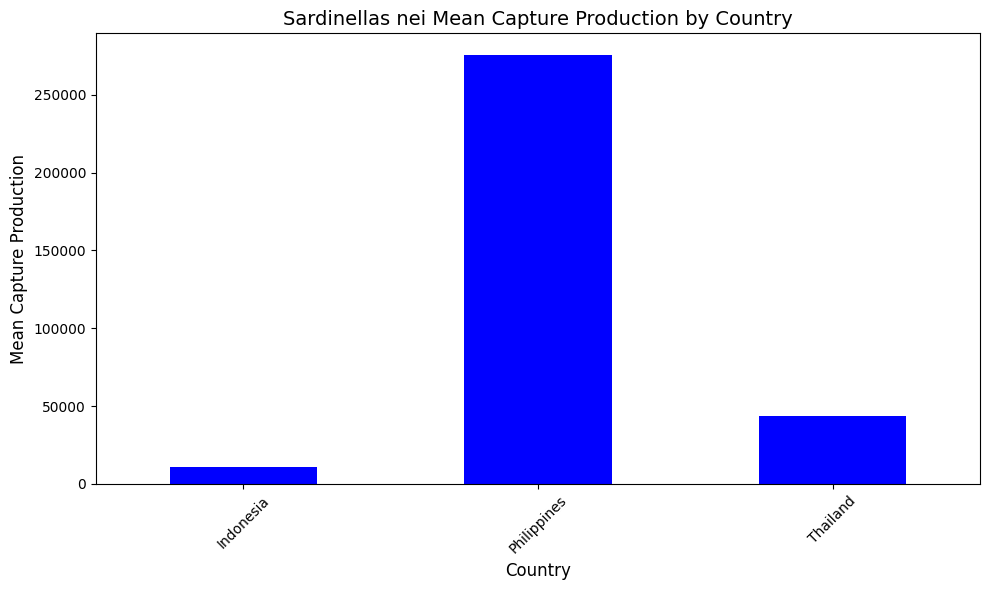

In [47]:
# Plot Sardinellas nei bar chart for every country.
sardinellas_df = df_marine[df_marine["Species"] == "Sardinellas nei"]

mean_by_country = sardinellas_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Country", fontsize = 12)
plt.ylabel("Mean Capture Production", fontsize = 12)
plt.title("Sardinellas nei Mean Capture Production by Country", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


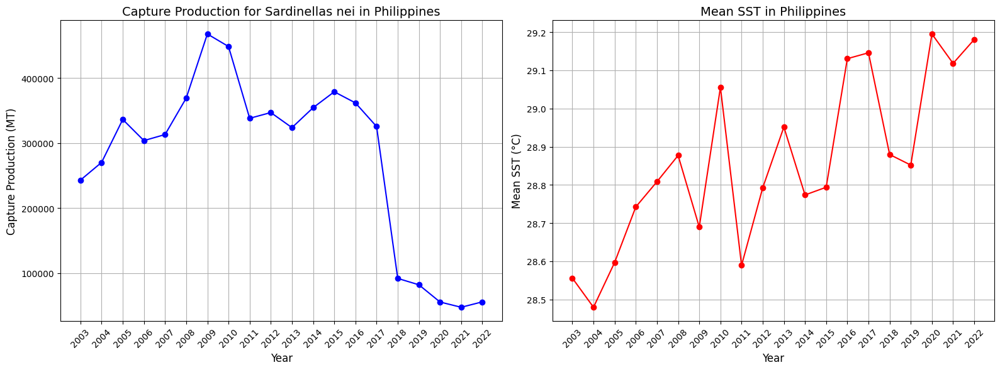

In [48]:
# Extract Sardinellas nei
sardinellas_ph = df_marine[(df_marine["Species"] == "Sardinellas nei") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
sardinellas_ph = sardinellas_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
sardinellas_ph = sardinellas_ph.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
sardinellas_ph = sardinellas_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
sardinellas_ph["PERIOD"] = sardinellas_ph["PERIOD"].astype(int)

# Assign hidden states by equal intervals
sardinellas_ph, midpoint = hs_interval(sardinellas_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(sardinellas_ph["PERIOD"], sardinellas_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Sardinellas nei in Philippines", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(sardinellas_ph["PERIOD"], sardinellas_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Philippines", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = sardinellas_ph["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

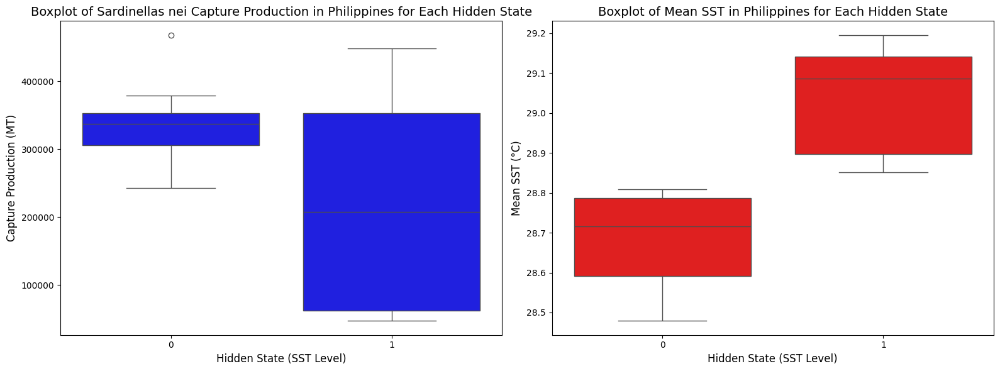

T-statistic: 2.1760595239381613, P-value: 0.043113283555020164
Observation Data: 
 [[242968.   ]
 [270227.   ]
 [336304.   ]
 [303766.   ]
 [313082.   ]
 [369199.   ]
 [467853.   ]
 [448556.   ]
 [338076.   ]
 [346938.   ]
 [323744.   ]
 [354423.   ]
 [378897.   ]
 [361794.   ]
 [325419.   ]
 [ 91696.   ]
 [ 81878.   ]
 [ 55361.31 ]
 [ 47279.15 ]
 [ 55610.623]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [49]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = sardinellas_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Sardinellas nei Capture Production in Philippines for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = sardinellas_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
sardinellas_ph_0 = sardinellas_ph[sardinellas_ph["Hidden State (Interval)"] == 0]["VALUE"]
sardinellas_ph_1 = sardinellas_ph[sardinellas_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(sardinellas_ph_0, sardinellas_ph_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
sardinellas_ph_hs_int = sardinellas_ph.pop("Hidden State (Interval)").values

sardinellas_ph_x = sardinellas_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
sardinellas_ph_x = sardinellas_ph_x.values

print("Observation Data: \n", sardinellas_ph_x)
print("Hidden State - Interval: \n", sardinellas_ph_hs_int)

#### Model

In [50]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(sardinellas_ph_x, sardinellas_ph_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

sardinellas_ph = pd.concat([sardinellas_ph.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


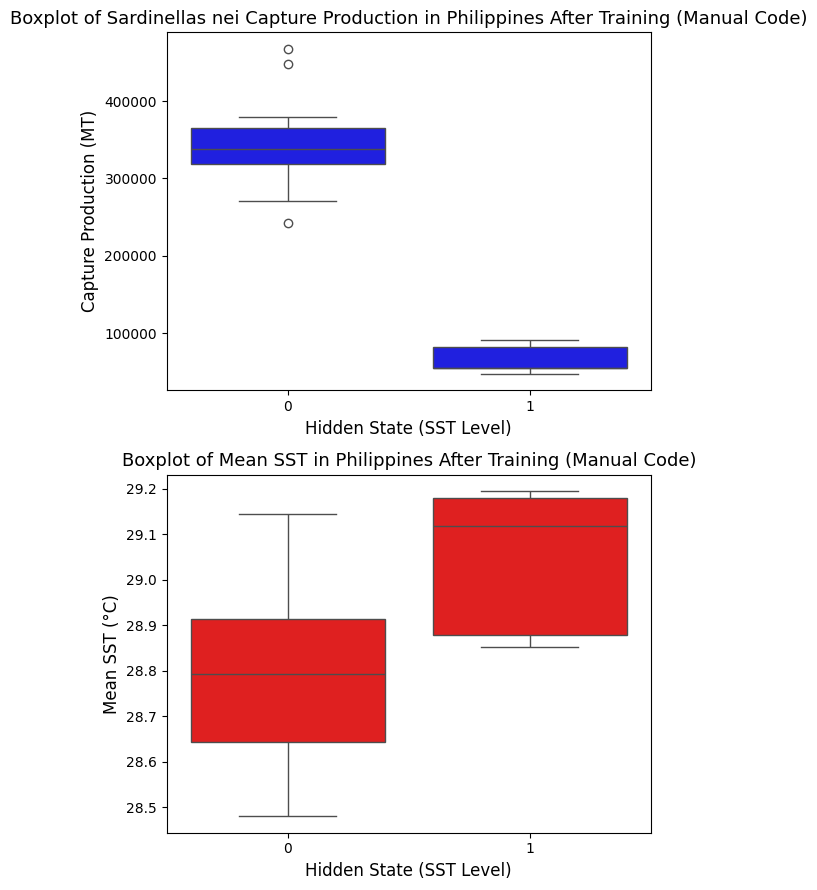

In [51]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = sardinellas_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Sardinellas nei Capture Production in Philippines After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = sardinellas_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [52]:
# Mean of every state (trained)
mean_sst_state = sardinellas_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = sardinellas_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
sardinellas_ph_0 = sardinellas_ph[sardinellas_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
sardinellas_ph_1 = sardinellas_ph[sardinellas_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(sardinellas_ph_0, sardinellas_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    28.798791
1    29.045101
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -2.6956354055724967, p-value: 0.026005903445167178


#### Re-train

In [53]:
# Manual Code (retrain and forecast)
sardinellas_ph_x_retrain = sardinellas_ph_x[:-1]
sardinellas_ph_hs_int_retrain = sardinellas_ph_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(sardinellas_ph_x_retrain, sardinellas_ph_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
Actual HS:    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1]


In [54]:
# Forecast 2022
sst2022_th = sardinellas_ph[sardinellas_ph["PERIOD"] == 2022]["Mean SST"].values

if sst2022_th < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([33170.2161393331]), array([104940.7500368364]))


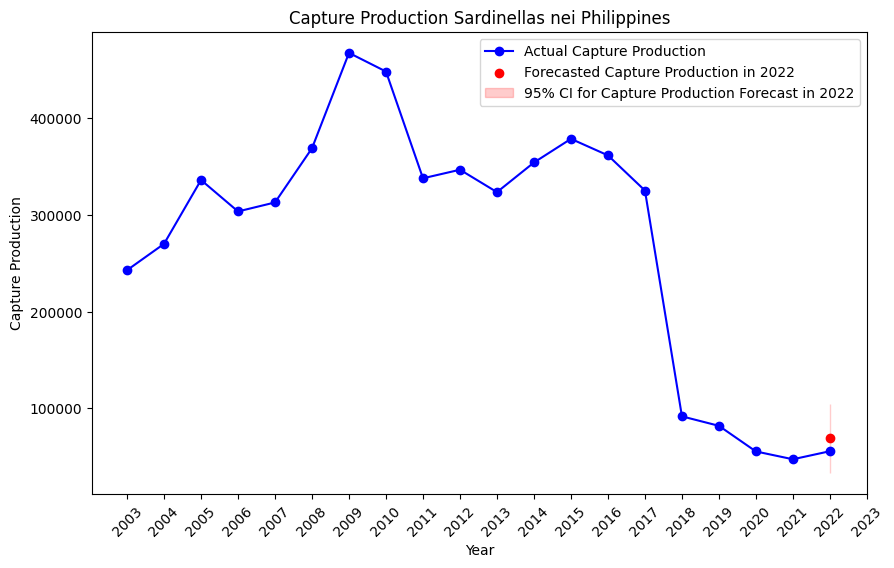

In [55]:
# Plot for CP
years = sardinellas_ph["PERIOD"].values
values = sardinellas_ph["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Sardinellas nei Philippines")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


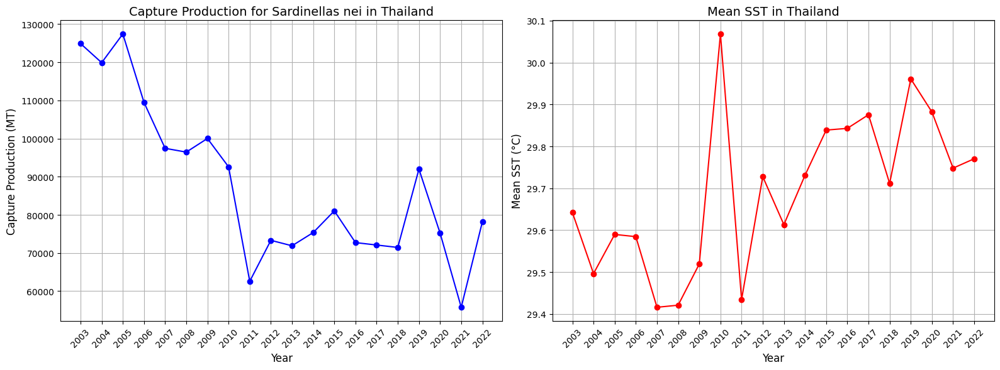

In [56]:
# Extract Sardinellas nei
sardinellas_th = df_marine[(df_marine["Species"] == "Sardinellas nei") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
sardinellas_th = sardinellas_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
sardinellas_th = sardinellas_th.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
sardinellas_th = sardinellas_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
sardinellas_th["PERIOD"] = sardinellas_th["PERIOD"].astype(int)

# Assign hidden states by equal intervals
sardinellas_th, midpoint = hs_interval(sardinellas_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(sardinellas_th["PERIOD"], sardinellas_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Sardinellas nei in Thailand", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(sardinellas_th["PERIOD"], sardinellas_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Thailand", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = sardinellas_th["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

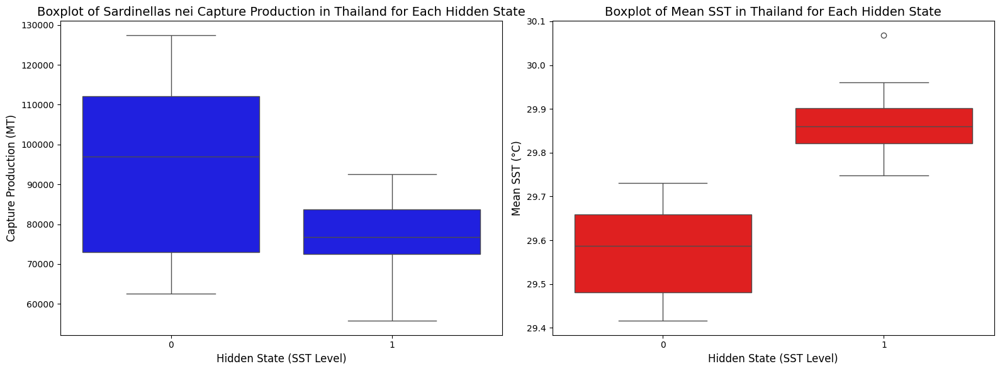

T-statistic: 1.8898213065973501, P-value: 0.07499726200728199
Observation Data: 
 [[124919.  ]
 [119901.  ]
 [127427.  ]
 [109508.  ]
 [ 97448.  ]
 [ 96455.  ]
 [100027.  ]
 [ 92588.  ]
 [ 62580.  ]
 [ 73325.  ]
 [ 71897.  ]
 [ 75359.  ]
 [ 81051.  ]
 [ 72729.44]
 [ 72095.77]
 [ 71463.07]
 [ 91988.65]
 [ 75213.23]
 [ 55775.01]
 [ 78201.31]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [57]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = sardinellas_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Sardinellas nei Capture Production in Thailand for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = sardinellas_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Thailand for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
sardinellas_th_0 = sardinellas_th[sardinellas_th["Hidden State (Interval)"] == 0]["VALUE"]
sardinellas_th_1 = sardinellas_th[sardinellas_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(sardinellas_th_0, sardinellas_th_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
sardinellas_th_hs_int = sardinellas_th.pop("Hidden State (Interval)").values

sardinellas_th_x = sardinellas_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
sardinellas_th_x = sardinellas_th_x.values

print("Observation Data: \n", sardinellas_th_x)
print("Hidden State - Interval: \n", sardinellas_th_hs_int)

#### Model

In [58]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(sardinellas_th_x, sardinellas_th_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

sardinellas_th = pd.concat([sardinellas_th.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


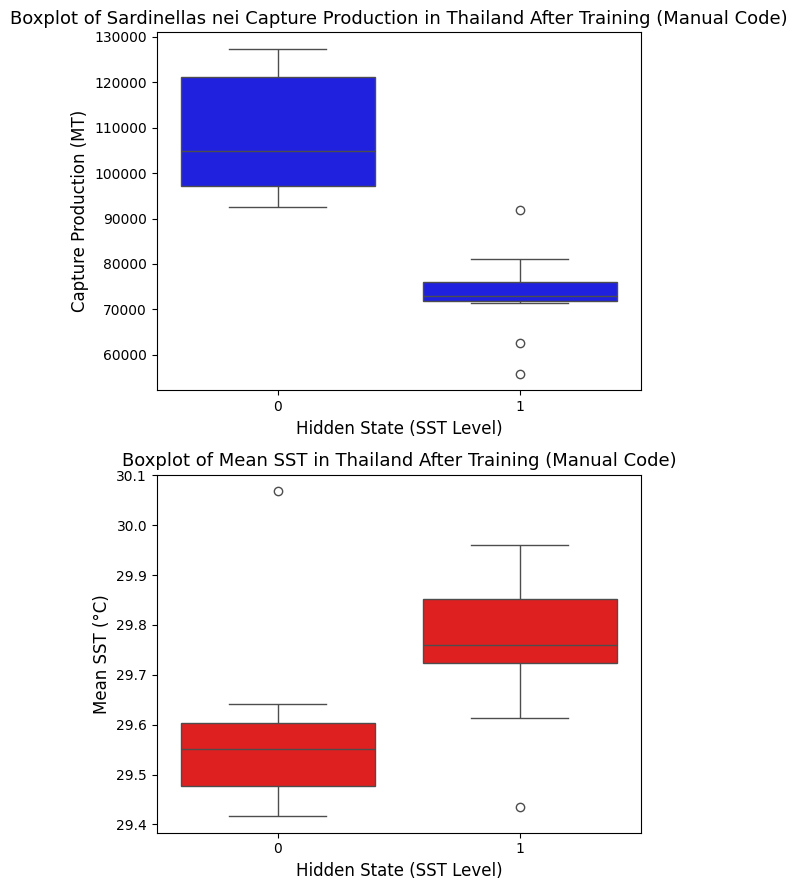

In [59]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = sardinellas_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Sardinellas nei Capture Production in Thailand After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = sardinellas_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Thailand After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [60]:
# Mean of every state (trained)
mean_sst_state = sardinellas_th.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = sardinellas_th.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
sardinellas_th_0 = sardinellas_th[sardinellas_th["Predicted HS (Manual Code)"] == 0]["Mean SST"]
sardinellas_th_1 = sardinellas_th[sardinellas_th["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(sardinellas_th_0, sardinellas_th_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.592276
1    29.761516
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.574047
1    29.873479
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -2.01590132258568, p-value: 0.06851908628576518


#### Re-train

In [61]:
# Manual Code (retrain and forecast)
sardinellas_th_x_retrain = sardinellas_th_x[:-1]
sardinellas_th_hs_int_retrain = sardinellas_th_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(sardinellas_th_x_retrain, sardinellas_th_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1]


In [62]:
# Forecast 2022
sst2022_th = sardinellas_th[sardinellas_th["PERIOD"] == 2022]["Mean SST"].values

if sst2022_th < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([55459.1717720336]), array([91802.9901737298]))


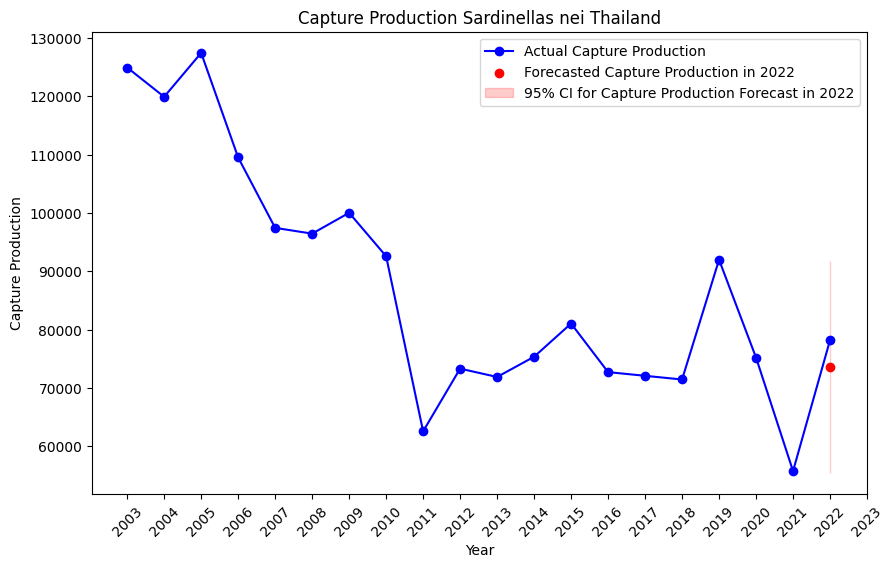

In [63]:
# Plot for CP
years = sardinellas_th["PERIOD"].values
values = sardinellas_th["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Sardinellas nei Thailand")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

## Scads nei (model + forecast done)

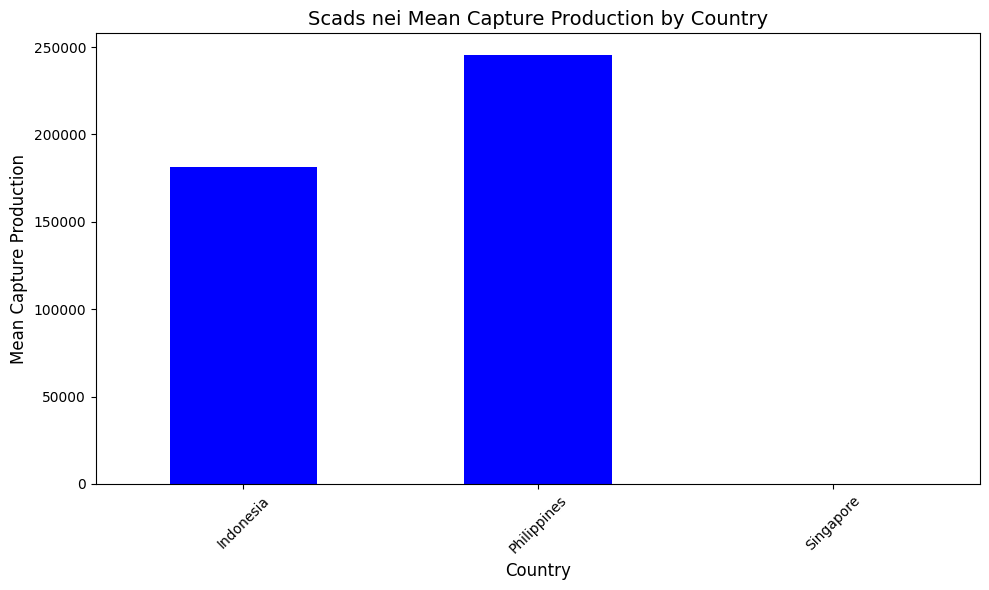

In [64]:
# Plot Scads nei bar chart for every country.
scads_df = df_marine[df_marine["Species"] == "Scads nei"]

mean_by_country = scads_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Country", fontsize = 12)
plt.ylabel("Mean Capture Production", fontsize = 12)
plt.title("Scads nei Mean Capture Production by Country", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


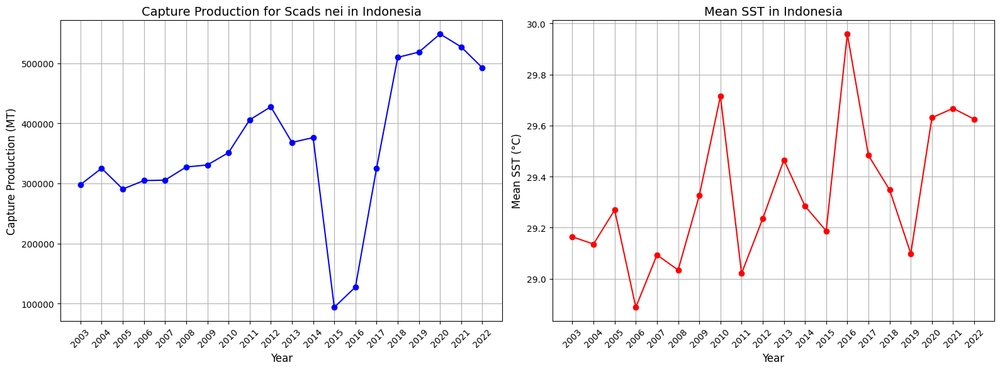

In [65]:
# Extract Scads nei
scads_id = df_marine[(df_marine["Species"] == "Scads nei") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
scads_id = scads_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
scads_id = scads_id.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
scads_id = scads_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
scads_id["PERIOD"] = scads_id["PERIOD"].astype(int)

# Assign hidden states by equal intervals
scads_id, midpoint = hs_interval(scads_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(scads_id["PERIOD"], scads_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Scads nei in Indonesia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(scads_id["PERIOD"], scads_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Indonesia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = scads_id["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

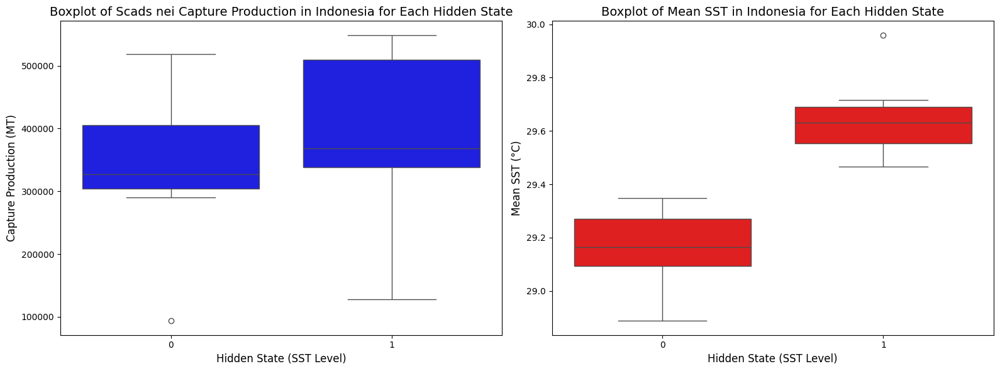

T-statistic: -0.7714250680752762, P-value: 0.45046410133606973
Observation Data: 
 [[297937.   ]
 [325187.   ]
 [290609.   ]
 [304739.   ]
 [305485.   ]
 [327367.   ]
 [330687.   ]
 [351216.   ]
 [405808.   ]
 [427510.   ]
 [368221.   ]
 [376276.   ]
 [ 93914.   ]
 [127563.   ]
 [325561.711]
 [509734.73 ]
 [518516.14 ]
 [548659.909]
 [527173.162]
 [492396.619]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [66]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = scads_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Scads nei Capture Production in Indonesia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = scads_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
scads_id_0 = scads_id[scads_id["Hidden State (Interval)"] == 0]["VALUE"]
scads_id_1 = scads_id[scads_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(scads_id_0, scads_id_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
scads_id_hs_int = scads_id.pop("Hidden State (Interval)").values

scads_id_x = scads_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
scads_id_x = scads_id_x.values

print("Observation Data: \n", scads_id_x)
print("Hidden State - Interval: \n", scads_id_hs_int)

### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


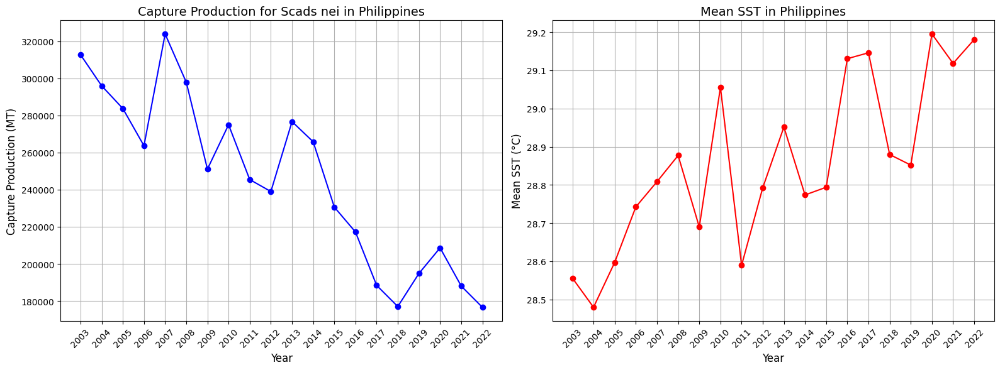

In [67]:
# Extract Scads nei
scads_ph = df_marine[(df_marine["Species"] == "Scads nei") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
scads_ph = scads_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
scads_ph = scads_ph.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
scads_ph = scads_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
scads_ph["PERIOD"] = scads_ph["PERIOD"].astype(int)

# Assign hidden states by equal intervals
scads_ph, midpoint = hs_interval(scads_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(scads_ph["PERIOD"], scads_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Scads nei in Philippines", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(scads_ph["PERIOD"], scads_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Philippines", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = scads_ph["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

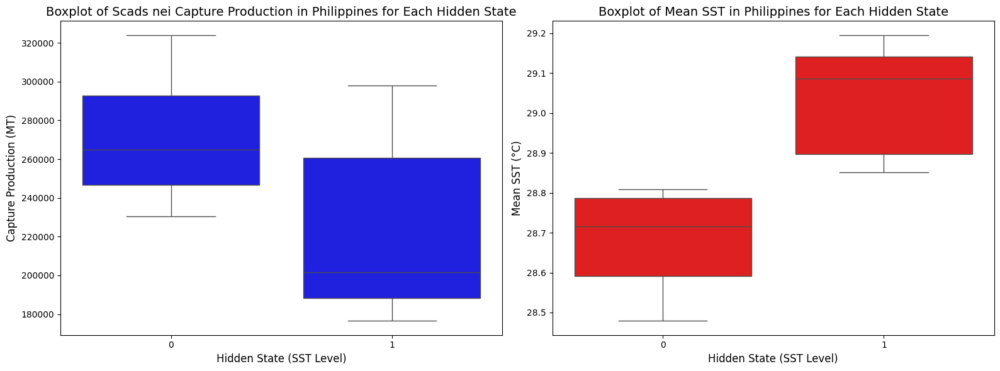

T-statistic: 2.9036966123054664, P-value: 0.00946947919568878
Observation Data: 
 [[312738.   ]
 [295952.   ]
 [283756.   ]
 [263651.   ]
 [323922.   ]
 [297892.   ]
 [251072.   ]
 [274994.   ]
 [245431.   ]
 [239003.   ]
 [276697.   ]
 [265806.   ]
 [230586.   ]
 [217172.   ]
 [188408.   ]
 [176988.   ]
 [194826.   ]
 [208622.62 ]
 [188036.33 ]
 [176597.736]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [68]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = scads_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Scads nei Capture Production in Philippines for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = scads_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
scads_ph_0 = scads_ph[scads_ph["Hidden State (Interval)"] == 0]["VALUE"]
scads_ph_1 = scads_ph[scads_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(scads_ph_0, scads_ph_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
scads_ph_hs_int = scads_ph.pop("Hidden State (Interval)").values

scads_ph_x = scads_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
scads_ph_x = scads_ph_x.values

print("Observation Data: \n", scads_ph_x)
print("Hidden State - Interval: \n", scads_ph_hs_int)

#### Model

In [69]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(scads_ph_x, scads_ph_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

scads_ph = pd.concat([scads_ph.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


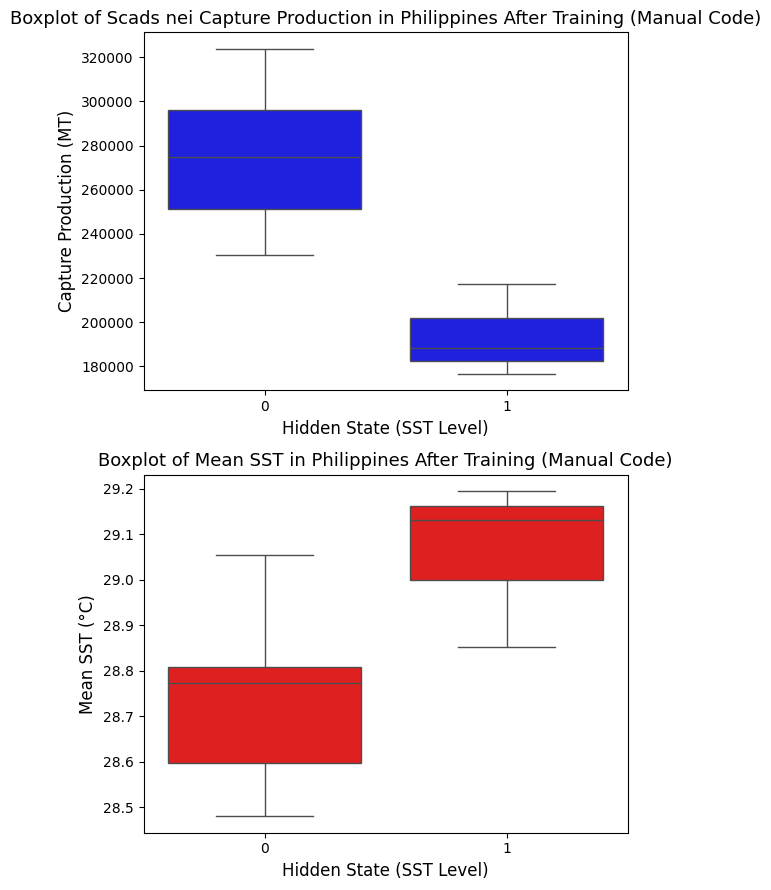

In [70]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = scads_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Scads nei Capture Production in Philippines After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = scads_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [71]:
# Mean of every state (trained)
mean_sst_state = scads_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = scads_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
scads_ph_0 = scads_ph[scads_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
scads_ph_1 = scads_ph[scads_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(scads_ph_0, scads_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    28.746571
1    29.071705
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -4.597483676139721, p-value: 0.00041984856438432477


#### Re-train

In [72]:
# Manual Code (retrain and forecast)
scads_ph_x_retrain = scads_ph_x[:-1]
scads_ph_hs_int_retrain = scads_ph_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(scads_ph_x_retrain, scads_ph_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1]


In [73]:
# Forecast 2022
sst2022_th = scads_ph[scads_ph["PERIOD"] == 2022]["Mean SST"].values

if sst2022_th < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([167209.2378696717]), array([228354.4174842316]))


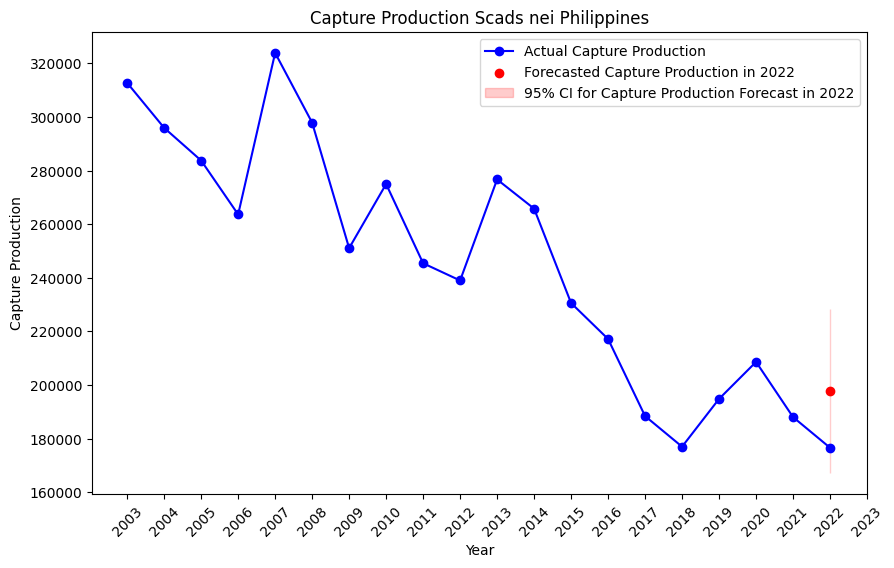

In [75]:
# Plot for CP
years = scads_ph["PERIOD"].values
values = scads_ph["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Scads nei Philippines")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Singapore

#### Extract Data

Min SST: 29.746875
Max SST: 30.52909722222222
Midpoint: 30.13798611111111


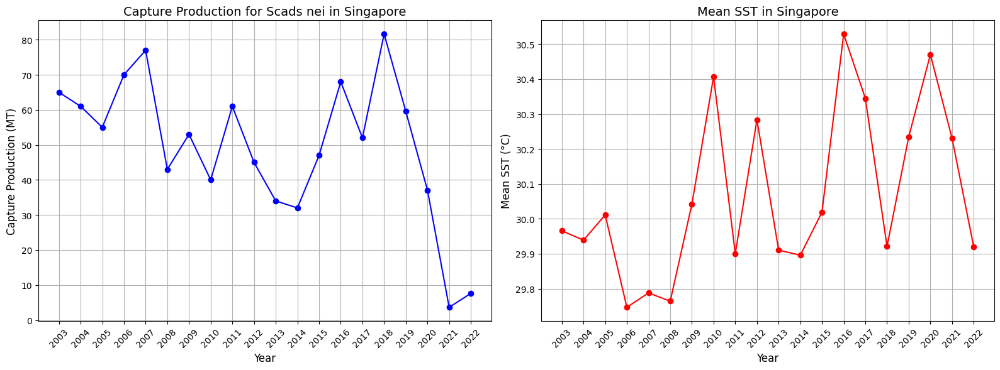

In [76]:
# Extract Scads nei
scads_sg = df_marine[(df_marine["Species"] == "Scads nei") & (df_marine["Country"] == "Singapore")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
scads_sg = scads_sg[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
scads_sg = scads_sg.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
scads_sg = scads_sg.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
scads_sg["PERIOD"] = scads_sg["PERIOD"].astype(int)

# Assign hidden states by equal intervals
scads_sg, midpoint = hs_interval(scads_sg)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(scads_sg["PERIOD"], scads_sg["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Scads nei in Singapore", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(scads_sg["PERIOD"], scads_sg["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Singapore", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = scads_sg["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

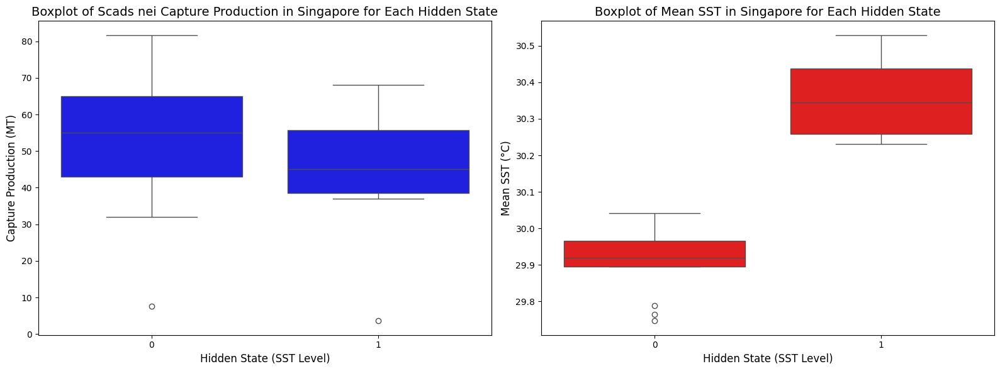

T-statistic: 0.9649638392641391, P-value: 0.347349383915721
Observation Data: 
 [[65.   ]
 [61.   ]
 [55.   ]
 [70.   ]
 [77.   ]
 [43.   ]
 [53.   ]
 [40.   ]
 [61.   ]
 [45.   ]
 [34.   ]
 [32.   ]
 [47.   ]
 [68.   ]
 [52.   ]
 [81.64 ]
 [59.555]
 [37.06 ]
 [ 3.65 ]
 [ 7.6  ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


In [77]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = scads_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Scads nei Capture Production in Singapore for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = scads_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Singapore for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
scads_sg_0 = scads_sg[scads_sg["Hidden State (Interval)"] == 0]["VALUE"]
scads_sg_1 = scads_sg[scads_sg["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(scads_sg_0, scads_sg_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
scads_sg_hs_int = scads_sg.pop("Hidden State (Interval)").values

scads_sg_x = scads_sg.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
scads_sg_x = scads_sg_x.values

print("Observation Data: \n", scads_sg_x)
print("Hidden State - Interval: \n", scads_sg_hs_int)

## Yellowfin tuna (model + forecast done)

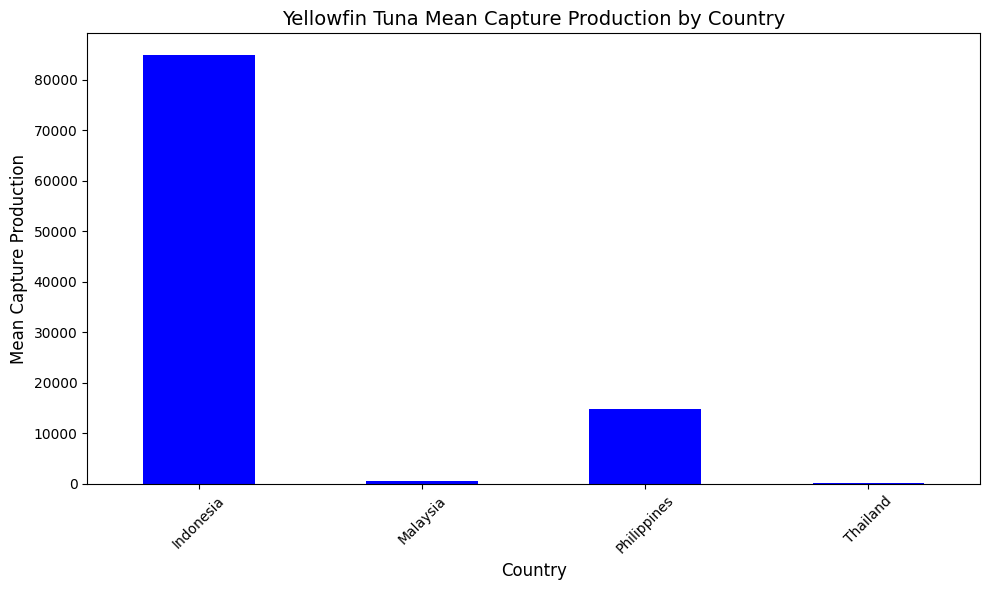

In [78]:
# Plot Yellowfin Tuna bar chart for every country.
yellowfin_df = df_marine[df_marine["Species"] == "Yellowfin tuna"]

mean_by_country = yellowfin_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Country", fontsize = 12)
plt.ylabel("Mean Capture Production", fontsize = 12)
plt.title("Yellowfin Tuna Mean Capture Production by Country", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


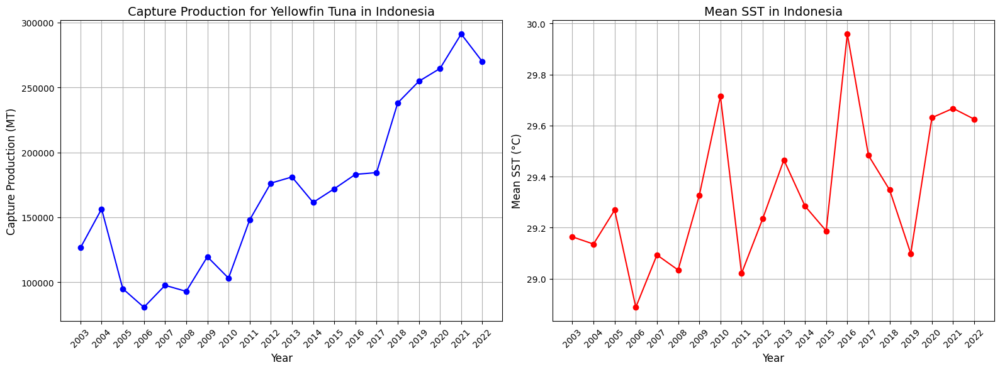

In [88]:
# Extract Yellowfin Tuna
yellowfin_id = df_marine[(df_marine["Species"] == "Yellowfin tuna") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
yellowfin_id = yellowfin_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
yellowfin_id = yellowfin_id.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
yellowfin_id = yellowfin_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
yellowfin_id["PERIOD"] = yellowfin_id["PERIOD"].astype(int)

# Assign hidden states by equal intervals
yellowfin_id, midpoint = hs_interval(yellowfin_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(yellowfin_id["PERIOD"], yellowfin_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Yellowfin Tuna in Indonesia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(yellowfin_id["PERIOD"], yellowfin_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Indonesia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = yellowfin_id["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

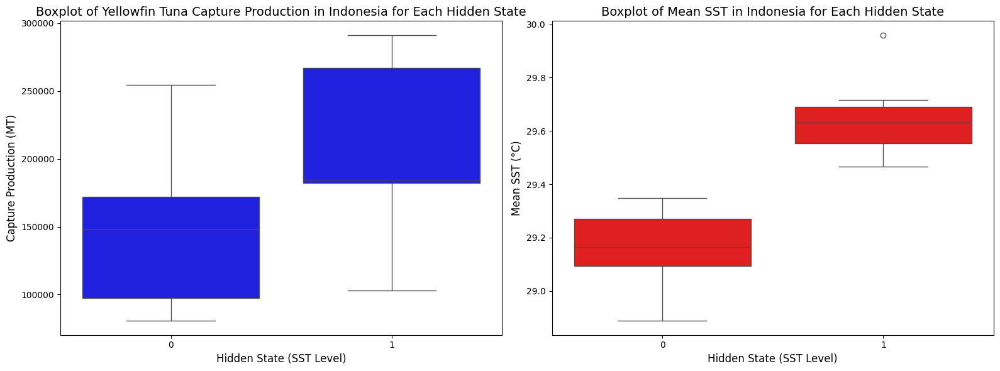

T-statistic: -2.302561742957223, P-value: 0.033454212455461964
Observation Data: 
 [[126511.   ]
 [156429.   ]
 [ 95029.   ]
 [ 80708.   ]
 [ 97608.   ]
 [ 92964.   ]
 [119623.   ]
 [103135.   ]
 [147992.   ]
 [176293.927]
 [181041.865]
 [161447.895]
 [171961.577]
 [183071.791]
 [184427.393]
 [238096.461]
 [254731.22 ]
 [264606.66 ]
 [291165.771]
 [269843.157]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [89]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = yellowfin_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Yellowfin Tuna Capture Production in Indonesia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = yellowfin_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
yellowfin_id_0 = yellowfin_id[yellowfin_id["Hidden State (Interval)"] == 0]["VALUE"]
yellowfin_id_1 = yellowfin_id[yellowfin_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(yellowfin_id_0, yellowfin_id_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
yellowfin_id_hs_int = yellowfin_id.pop("Hidden State (Interval)").values

yellowfin_id_x = yellowfin_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
yellowfin_id_x = yellowfin_id_x.values

print("Observation Data: \n", yellowfin_id_x)
print("Hidden State - Interval: \n", yellowfin_id_hs_int)

#### Model

In [90]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(yellowfin_id_x, yellowfin_id_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

yellowfin_id = pd.concat([yellowfin_id.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


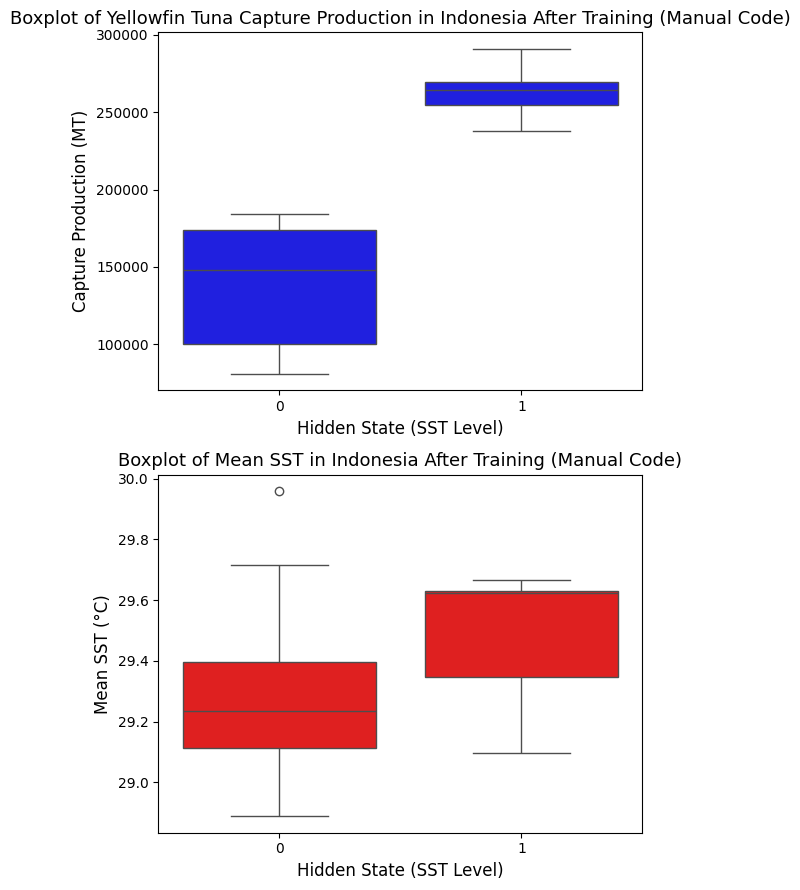

In [91]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = yellowfin_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Yellowfin Tuna Capture Production in Indonesia After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = yellowfin_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [92]:
# Mean of every state (trained)
mean_sst_state = yellowfin_id.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = yellowfin_id.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
yellowfin_id_0 = yellowfin_id[yellowfin_id["Predicted HS (Manual Code)"] == 0]["Mean SST"]
yellowfin_id_1 = yellowfin_id[yellowfin_id["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(yellowfin_id_0, yellowfin_id_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.284157
1    29.474089
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.160440
1    29.649582
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -1.4448235132592158, p-value: 0.1876600261659254


In [95]:
print(init_means)

[[147645.7753846154]
 [211041.6624285714]]


Note: p-val > 0.10, no need for re-training, HS doesn't represent SST level anymore.

### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


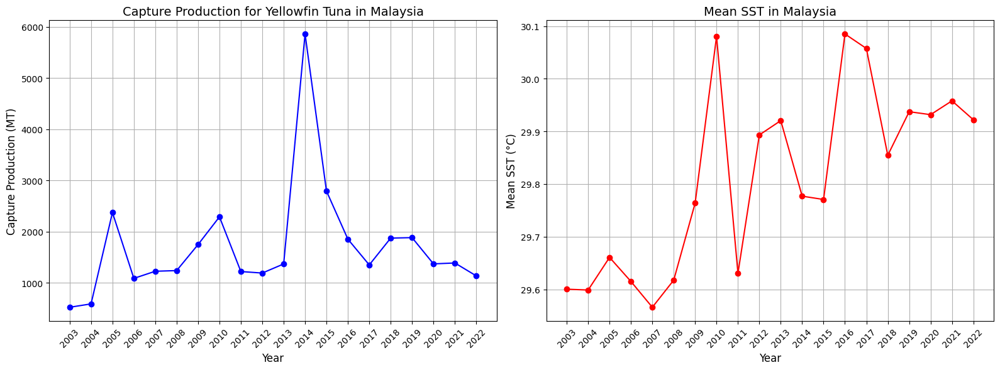

In [84]:
# Extract Yellowfin Tuna
yellowfin_my = df_marine[(df_marine["Species"] == "Yellowfin tuna") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
yellowfin_my = yellowfin_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
yellowfin_my = yellowfin_my.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
yellowfin_my = yellowfin_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
yellowfin_my["PERIOD"] = yellowfin_my["PERIOD"].astype(int)

# Assign hidden states by equal intervals
yellowfin_my, midpoint = hs_interval(yellowfin_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(yellowfin_my["PERIOD"], yellowfin_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Yellowfin Tuna in Malaysia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(yellowfin_my["PERIOD"], yellowfin_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Malaysia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = yellowfin_my["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

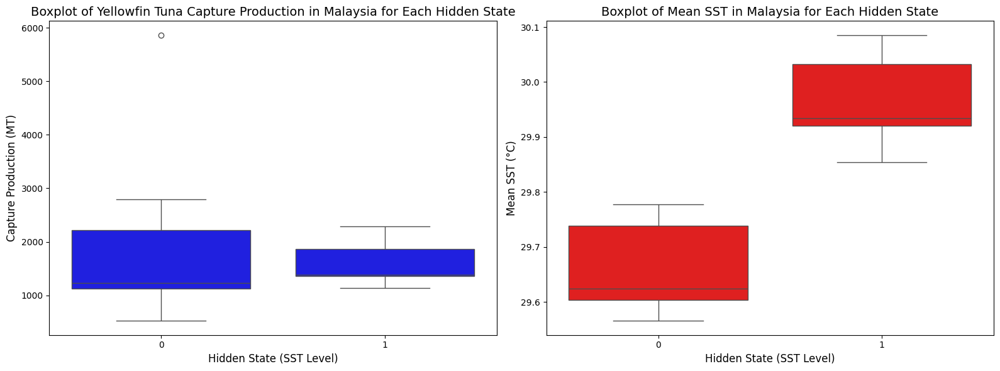

T-statistic: 0.5768350711615997, P-value: 0.5711951559177857
Observation Data: 
 [[ 526.   ]
 [ 592.   ]
 [2375.   ]
 [1090.   ]
 [1229.   ]
 [1242.   ]
 [1750.   ]
 [2291.   ]
 [1223.72 ]
 [1193.87 ]
 [1371.493]
 [5860.32 ]
 [2794.493]
 [1855.805]
 [1352.647]
 [1876.286]
 [1885.287]
 [1373.001]
 [1390.787]
 [1138.681]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [85]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = yellowfin_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Yellowfin Tuna Capture Production in Malaysia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = yellowfin_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
yellowfin_my_0 = yellowfin_my[yellowfin_my["Hidden State (Interval)"] == 0]["VALUE"]
yellowfin_my_1 = yellowfin_my[yellowfin_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(yellowfin_my_0, yellowfin_my_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
yellowfin_my_hs_int = yellowfin_my.pop("Hidden State (Interval)").values

yellowfin_my_x = yellowfin_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
yellowfin_my_x = yellowfin_my_x.values

print("Observation Data: \n", yellowfin_my_x)
print("Hidden State - Interval: \n", yellowfin_my_hs_int)

### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


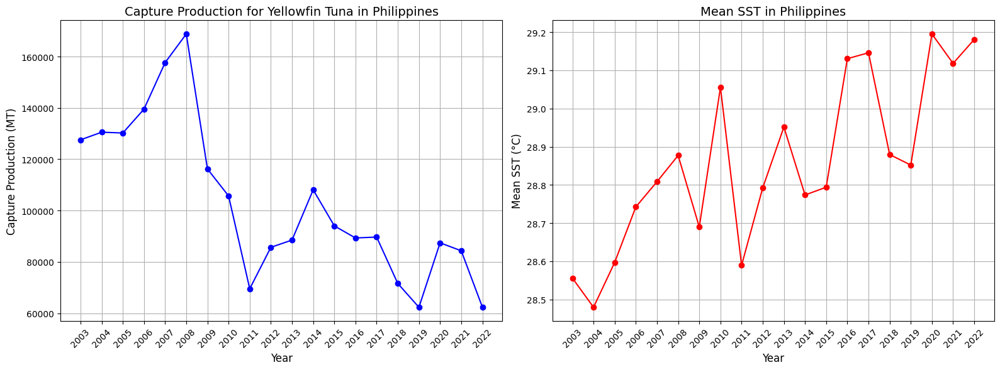

In [86]:
# Extract Yellowfin Tuna
yellowfin_ph = df_marine[(df_marine["Species"] == "Yellowfin tuna") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
yellowfin_ph = yellowfin_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
yellowfin_ph = yellowfin_ph.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
yellowfin_ph = yellowfin_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
yellowfin_ph["PERIOD"] = yellowfin_ph["PERIOD"].astype(int)

# Assign hidden states by equal intervals
yellowfin_ph, midpoint = hs_interval(yellowfin_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(yellowfin_ph["PERIOD"], yellowfin_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Yellowfin Tuna in Philippines", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(yellowfin_ph["PERIOD"], yellowfin_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Philippines", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = yellowfin_ph["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

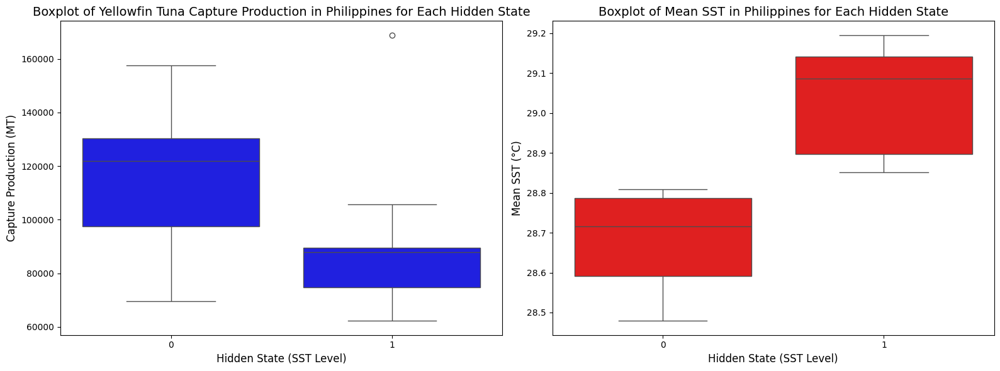

T-statistic: 1.9406422728959045, P-value: 0.0681289920317034
Observation Data: 
 [[127559.   ]
 [130533.   ]
 [130221.   ]
 [139508.   ]
 [157646.   ]
 [168790.   ]
 [116225.   ]
 [105702.   ]
 [ 69544.   ]
 [ 85693.25 ]
 [ 88518.154]
 [108097.004]
 [ 94034.   ]
 [ 89330.   ]
 [ 89683.27 ]
 [ 71606.   ]
 [ 62335.   ]
 [ 87438.   ]
 [ 84344.   ]
 [ 62398.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [87]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = yellowfin_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Yellowfin Tuna Capture Production in Philippines for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = yellowfin_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
yellowfin_ph_0 = yellowfin_ph[yellowfin_ph["Hidden State (Interval)"] == 0]["VALUE"]
yellowfin_ph_1 = yellowfin_ph[yellowfin_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(yellowfin_ph_0, yellowfin_ph_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
yellowfin_ph_hs_int = yellowfin_ph.pop("Hidden State (Interval)").values

yellowfin_ph_x = yellowfin_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
yellowfin_ph_x = yellowfin_ph_x.values

print("Observation Data: \n", yellowfin_ph_x)
print("Hidden State - Interval: \n", yellowfin_ph_hs_int)

#### Model

In [88]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(yellowfin_ph_x, yellowfin_ph_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

yellowfin_ph = pd.concat([yellowfin_ph.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


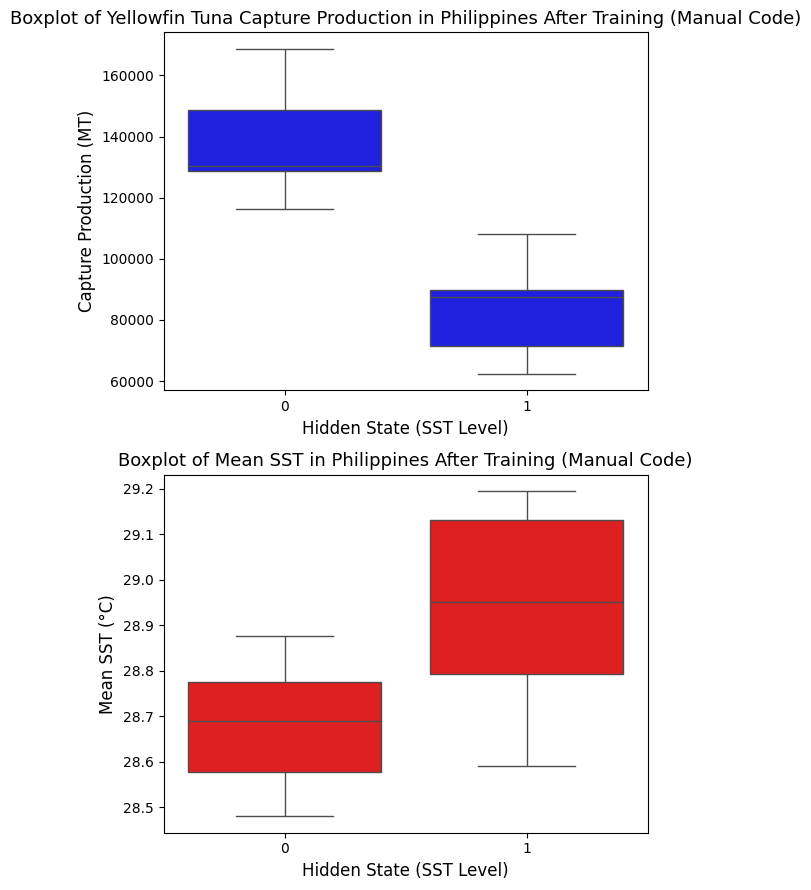

In [89]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = yellowfin_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Yellowfin Tuna Capture Production in Philippines After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = yellowfin_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [90]:
# Mean of every state (trained)
mean_sst_state = yellowfin_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = yellowfin_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
yellowfin_ph_0 = yellowfin_ph[yellowfin_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
yellowfin_ph_1 = yellowfin_ph[yellowfin_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(yellowfin_ph_0, yellowfin_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    28.678503
1    28.958295
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -3.683474974973162, p-value: 0.002020800388515331


#### Re-train

In [91]:
# Manual Code (retrain and forecast)
yellowfin_ph_x_retrain = yellowfin_ph_x[:-1]
yellowfin_ph_hs_int_retrain = yellowfin_ph_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(yellowfin_ph_x_retrain, yellowfin_ph_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1]


In [92]:
# Forecast 2022
sst2022_ph = yellowfin_ph[yellowfin_ph["PERIOD"] == 2022]["Mean SST"].values

if sst2022_ph < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([60567.795871315]), array([112289.6137280595]))


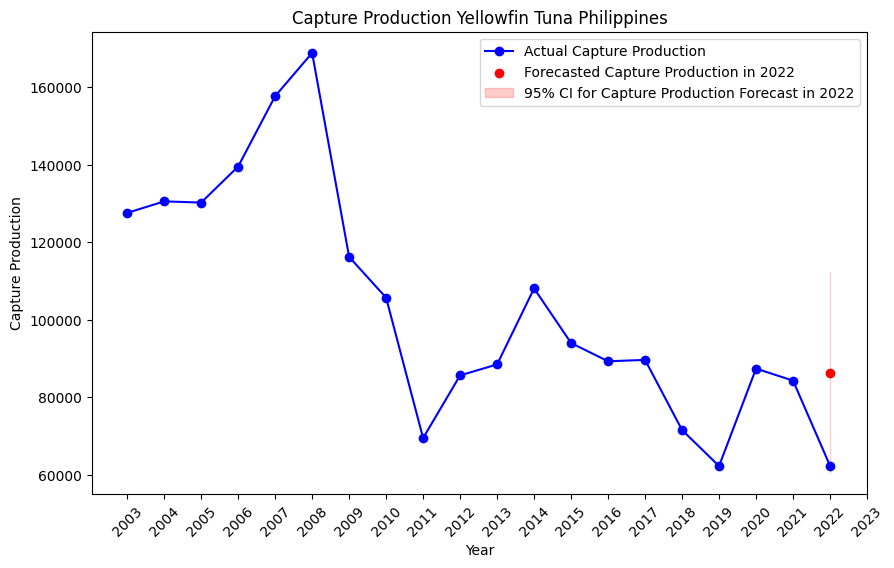

In [93]:
# Plot for CP
years = yellowfin_ph["PERIOD"].values
values = yellowfin_ph["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Yellowfin Tuna Philippines")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


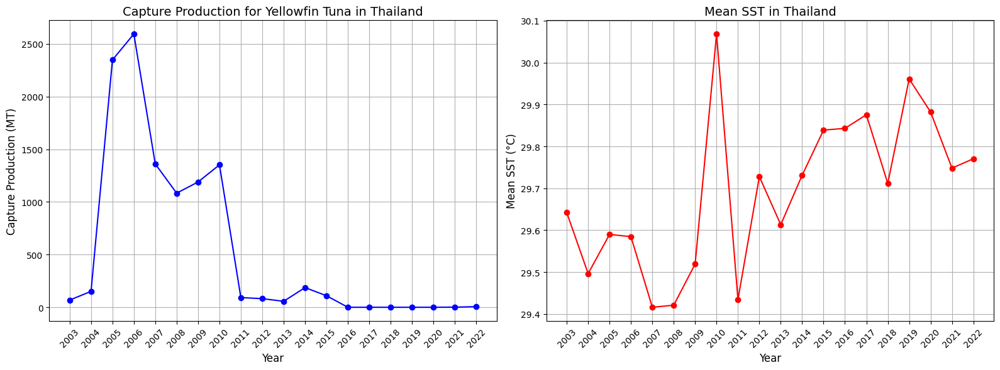

In [94]:
# Extract Yellowfin Tuna
yellowfin_th = df_marine[(df_marine["Species"] == "Yellowfin tuna") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
yellowfin_th = yellowfin_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
yellowfin_th = yellowfin_th.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
yellowfin_th = yellowfin_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
yellowfin_th["PERIOD"] = yellowfin_th["PERIOD"].astype(int)

# Assign hidden states by equal intervals
yellowfin_th, midpoint = hs_interval(yellowfin_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(yellowfin_th["PERIOD"], yellowfin_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Yellowfin Tuna in Thailand", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(yellowfin_th["PERIOD"], yellowfin_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Thailand", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = yellowfin_th["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

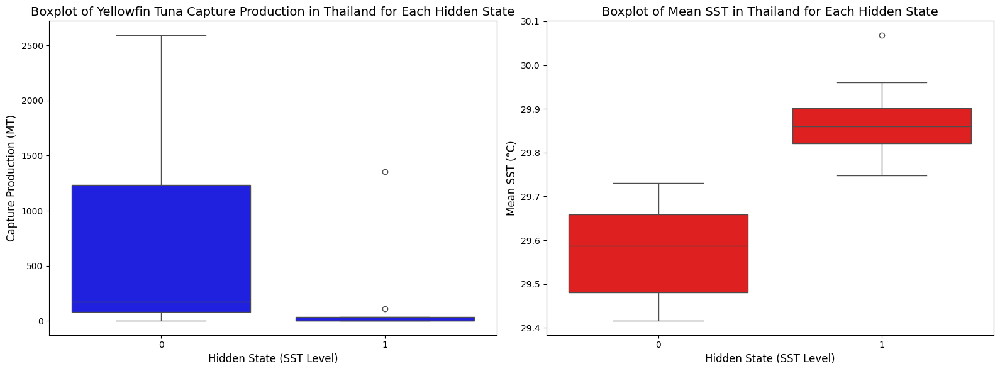

T-statistic: 1.6178485653191992, P-value: 0.12308441575801236
Observation Data: 
 [[  68.   ]
 [ 151.   ]
 [2348.   ]
 [2594.   ]
 [1361.   ]
 [1083.   ]
 [1189.   ]
 [1352.   ]
 [  92.12 ]
 [  81.8  ]
 [  56.835]
 [ 186.806]
 [ 109.451]
 [   0.   ]
 [   0.   ]
 [   0.   ]
 [   0.   ]
 [   0.   ]
 [   1.   ]
 [   6.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [95]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = yellowfin_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Yellowfin Tuna Capture Production in Thailand for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = yellowfin_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Thailand for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
yellowfin_th_0 = yellowfin_th[yellowfin_th["Hidden State (Interval)"] == 0]["VALUE"]
yellowfin_th_1 = yellowfin_th[yellowfin_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(yellowfin_th_0, yellowfin_th_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
yellowfin_th_hs_int = yellowfin_th.pop("Hidden State (Interval)").values

yellowfin_th_x = yellowfin_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
yellowfin_th_x = yellowfin_th_x.values

print("Observation Data: \n", yellowfin_th_x)
print("Hidden State - Interval: \n", yellowfin_th_hs_int)

## Short mackerel (model + forecast done)

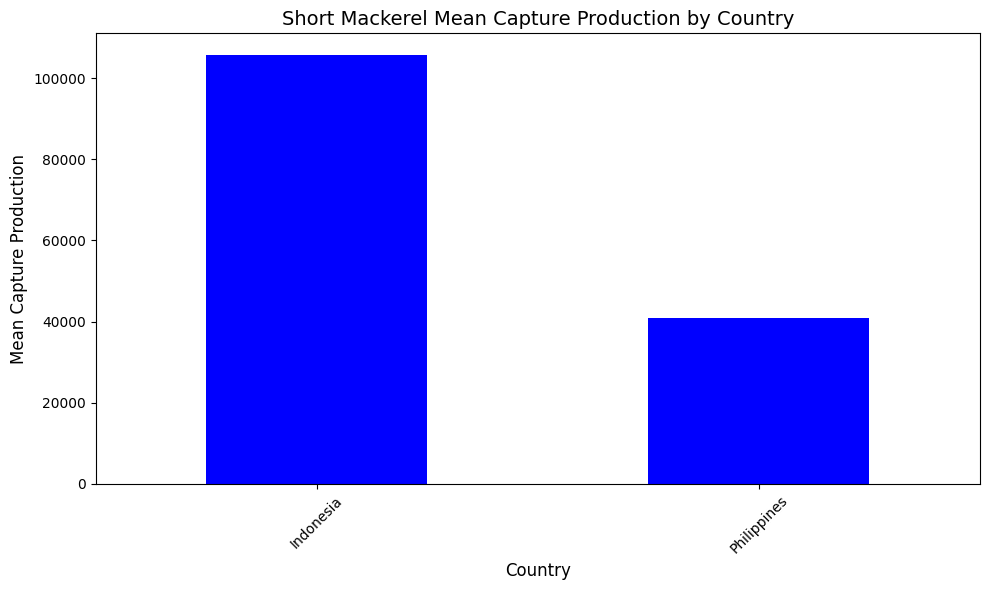

In [96]:
# Plot Short Mackerel bar chart for every country.
short_df = df_marine[df_marine["Species"] == "Short mackerel"]

mean_by_country = short_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Country", fontsize = 12)
plt.ylabel("Mean Capture Production", fontsize = 12)
plt.title("Short Mackerel Mean Capture Production by Country", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


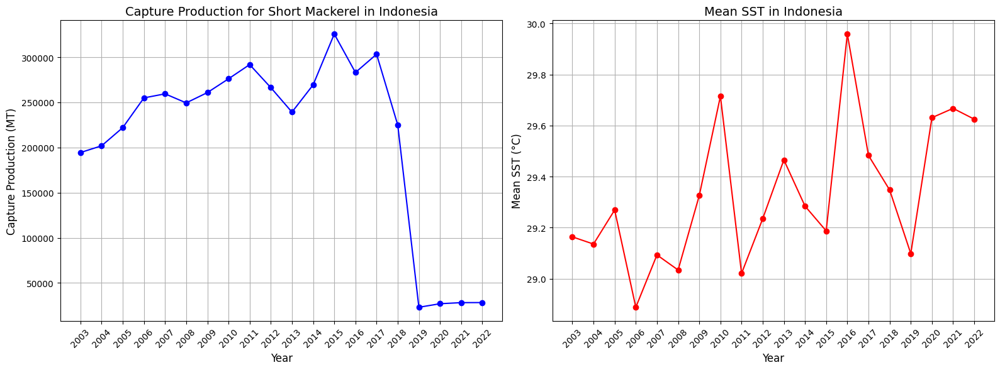

In [97]:
# Extract Short Mackerel
short_id = df_marine[(df_marine["Species"] == "Short mackerel") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
short_id = short_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
short_id = short_id.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
short_id = short_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
short_id["PERIOD"] = short_id["PERIOD"].astype(int)

# Assign hidden states by equal intervals
short_id, midpoint = hs_interval(short_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(short_id["PERIOD"], short_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Short Mackerel in Indonesia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(short_id["PERIOD"], short_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Indonesia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = short_id["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

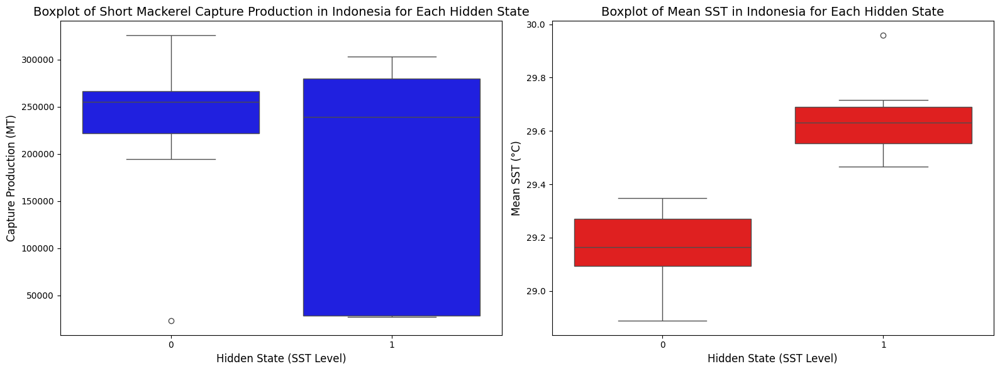

T-statistic: 1.420994397938843, P-value: 0.17241131185233577
Observation Data: 
 [[194427.   ]
 [201882.   ]
 [222032.   ]
 [254960.   ]
 [259458.   ]
 [249438.   ]
 [260833.   ]
 [276110.   ]
 [291863.   ]
 [266358.   ]
 [239216.   ]
 [269411.   ]
 [325774.   ]
 [283106.   ]
 [303363.819]
 [224996.135]
 [ 23014.633]
 [ 26943.313]
 [ 28149.965]
 [ 28226.926]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [98]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = short_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Short Mackerel Capture Production in Indonesia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = short_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
short_id_0 = short_id[short_id["Hidden State (Interval)"] == 0]["VALUE"]
short_id_1 = short_id[short_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(short_id_0, short_id_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
short_id_hs_int = short_id.pop("Hidden State (Interval)").values

short_id_x = short_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
short_id_x = short_id_x.values

print("Observation Data: \n", short_id_x)
print("Hidden State - Interval: \n", short_id_hs_int)

### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


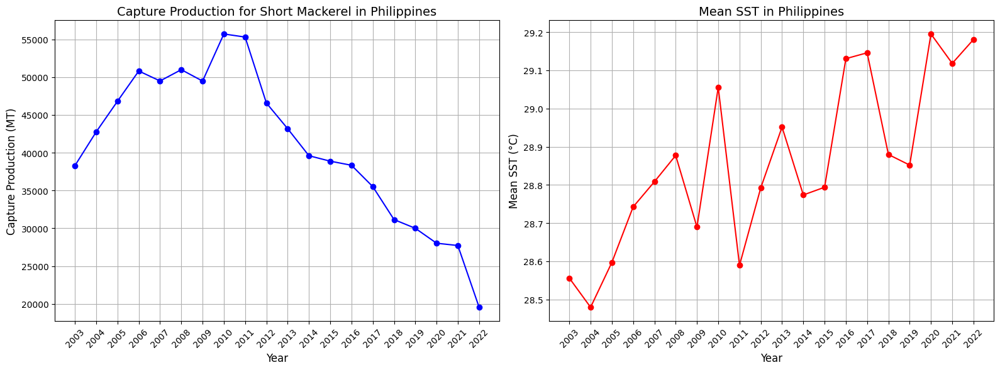

In [99]:
# Extract Short Mackerel
short_ph = df_marine[(df_marine["Species"] == "Short mackerel") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
short_ph = short_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
short_ph = short_ph.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
short_ph = short_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
short_ph["PERIOD"] = short_ph["PERIOD"].astype(int)

# Assign hidden states by equal intervals
short_ph, midpoint = hs_interval(short_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(short_ph["PERIOD"], short_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Short Mackerel in Philippines", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(short_ph["PERIOD"], short_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Philippines", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = short_ph["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

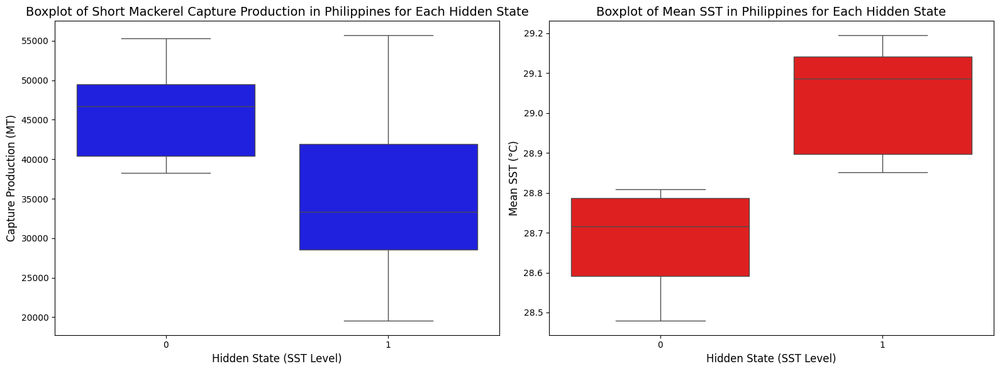

T-statistic: 2.4552920318890483, P-value: 0.02447433544963627
Observation Data: 
 [[38294.   ]
 [42760.   ]
 [46810.   ]
 [50810.   ]
 [49494.   ]
 [50986.   ]
 [49478.   ]
 [55708.   ]
 [55300.   ]
 [46572.   ]
 [43180.   ]
 [39602.   ]
 [38881.   ]
 [38339.   ]
 [35518.   ]
 [31153.   ]
 [30003.   ]
 [28026.64 ]
 [27722.31 ]
 [19552.302]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [100]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = short_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Short Mackerel Capture Production in Philippines for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = short_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
short_ph_0 = short_ph[short_ph["Hidden State (Interval)"] == 0]["VALUE"]
short_ph_1 = short_ph[short_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(short_ph_0, short_ph_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
short_ph_hs_int = short_ph.pop("Hidden State (Interval)").values

short_ph_x = short_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
short_ph_x = short_ph_x.values

print("Observation Data: \n", short_ph_x)
print("Hidden State - Interval: \n", short_ph_hs_int)

#### Model

In [101]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(short_ph_x, short_ph_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

short_ph = pd.concat([short_ph.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


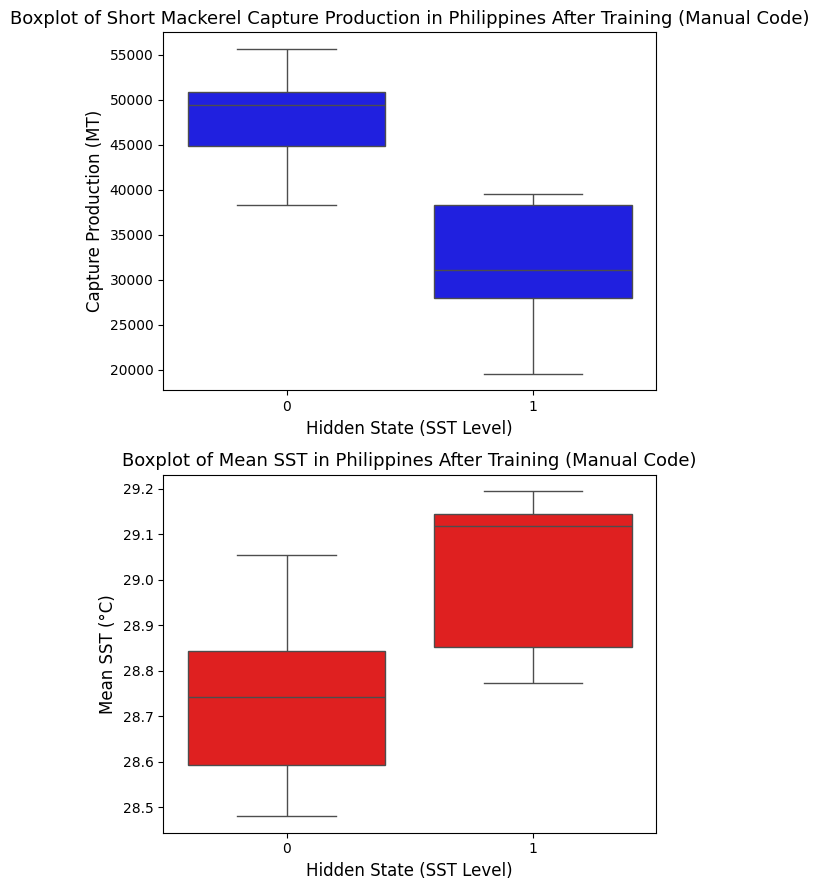

In [102]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = short_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Short Mackerel Capture Production in Philippines After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = short_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [103]:
# Mean of every state (trained)
mean_sst_state = short_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = short_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
short_ph_0 = short_ph[short_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
short_ph_1 = short_ph[short_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(short_ph_0, short_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    28.739823
1    29.007701
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -3.3483911112084064, p-value: 0.003750572927109225


#### Re-train

In [104]:
# Manual Code (retrain and forecast)
short_ph_x_retrain = short_ph_x[:-1]
short_ph_hs_int_retrain = short_ph_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(short_ph_x_retrain, short_ph_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [1 1 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1]


In [105]:
# Forecast 2022
sst2022_ph = short_ph[short_ph["PERIOD"] == 2022]["Mean SST"].values

if sst2022_ph < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([24915.1308383551]), array([45767.3549643062]))


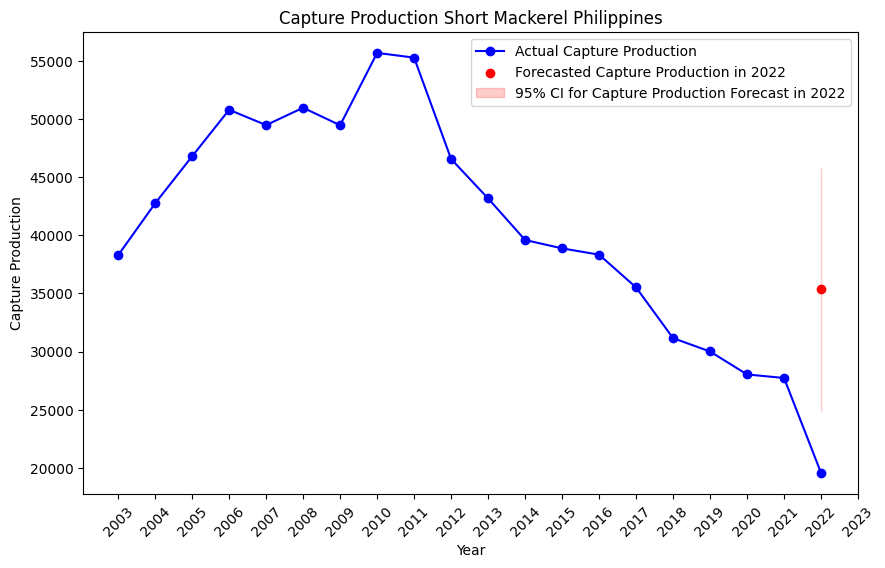

In [106]:
# Plot for CP
years = short_ph["PERIOD"].values
values = short_ph["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Short Mackerel Philippines")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

## Stolephorus anchovies nei (model + forecast done)

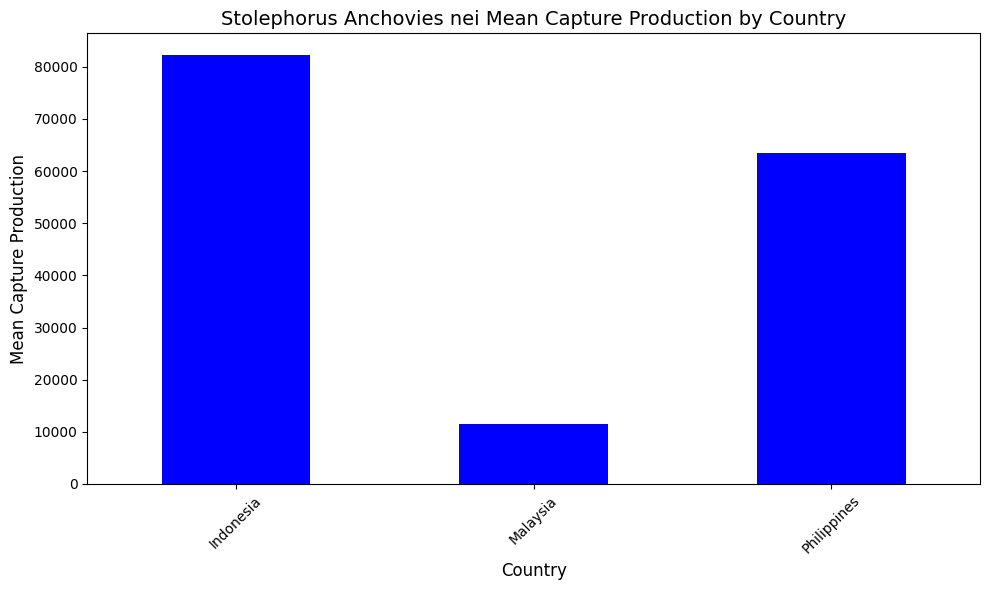

In [107]:
# Plot Stolephorus Anchovies nei bar chart for every country.
stole_df = df_marine[df_marine["Species"] == "Stolephorus anchovies nei"]

mean_by_country = stole_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Country", fontsize = 12)
plt.ylabel("Mean Capture Production", fontsize = 12)
plt.title("Stolephorus Anchovies nei Mean Capture Production by Country", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


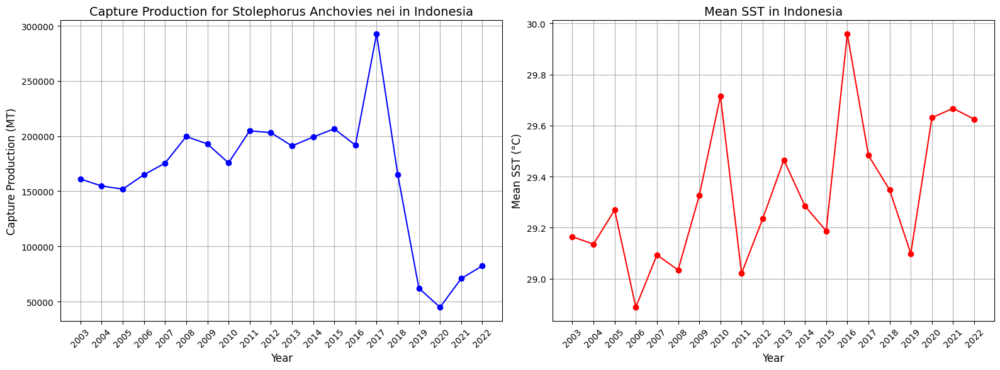

In [108]:
# Extract Stolephorus Anchovies nei
stole_id = df_marine[(df_marine["Species"] == "Stolephorus anchovies nei") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
stole_id = stole_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
stole_id = stole_id.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
stole_id = stole_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
stole_id["PERIOD"] = stole_id["PERIOD"].astype(int)

# Assign hidden states by equal intervals
stole_id, midpoint = hs_interval(stole_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(stole_id["PERIOD"], stole_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Stolephorus Anchovies nei in Indonesia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(stole_id["PERIOD"], stole_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Indonesia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = stole_id["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

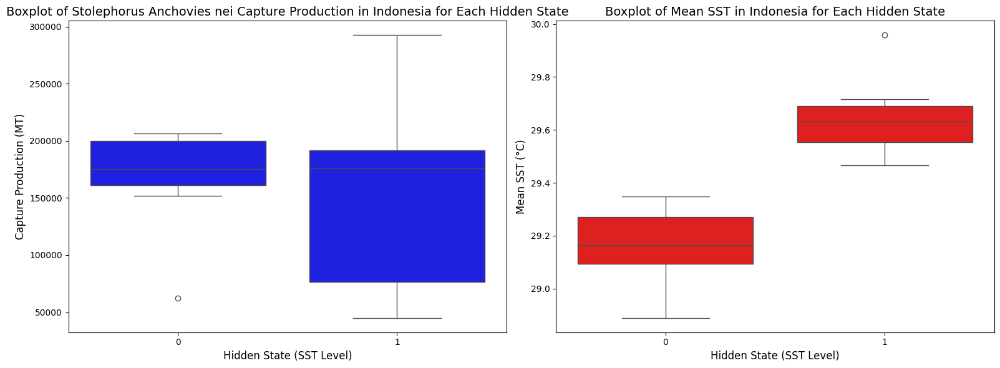

T-statistic: 0.8043030560487707, P-value: 0.4317171479357421
Observation Data: 
 [[161141.   ]
 [154811.   ]
 [151926.   ]
 [165024.   ]
 [175522.   ]
 [199675.   ]
 [192966.   ]
 [175726.   ]
 [204839.   ]
 [203220.   ]
 [191094.   ]
 [199226.   ]
 [206635.   ]
 [191842.   ]
 [292656.929]
 [165312.51 ]
 [ 62106.334]
 [ 44810.319]
 [ 70821.906]
 [ 82442.03 ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [109]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = stole_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Stolephorus Anchovies nei Capture Production in Indonesia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = stole_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
stole_id_0 = stole_id[stole_id["Hidden State (Interval)"] == 0]["VALUE"]
stole_id_1 = stole_id[stole_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(stole_id_0, stole_id_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
stole_id_hs_int = stole_id.pop("Hidden State (Interval)").values

stole_id_x = stole_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
stole_id_x = stole_id_x.values

print("Observation Data: \n", stole_id_x)
print("Hidden State - Interval: \n", stole_id_hs_int)

### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


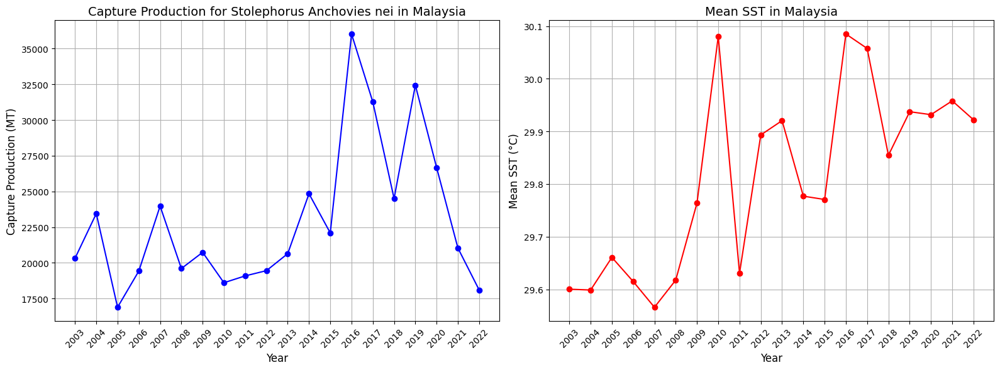

In [110]:
# Extract Stolephorus Anchovies nei
stole_my = df_marine[(df_marine["Species"] == "Stolephorus anchovies nei") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
stole_my = stole_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
stole_my = stole_my.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
stole_my = stole_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
stole_my["PERIOD"] = stole_my["PERIOD"].astype(int)

# Assign hidden states by equal intervals
stole_my, midpoint = hs_interval(stole_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(stole_my["PERIOD"], stole_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Stolephorus Anchovies nei in Malaysia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(stole_my["PERIOD"], stole_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Malaysia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = stole_my["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

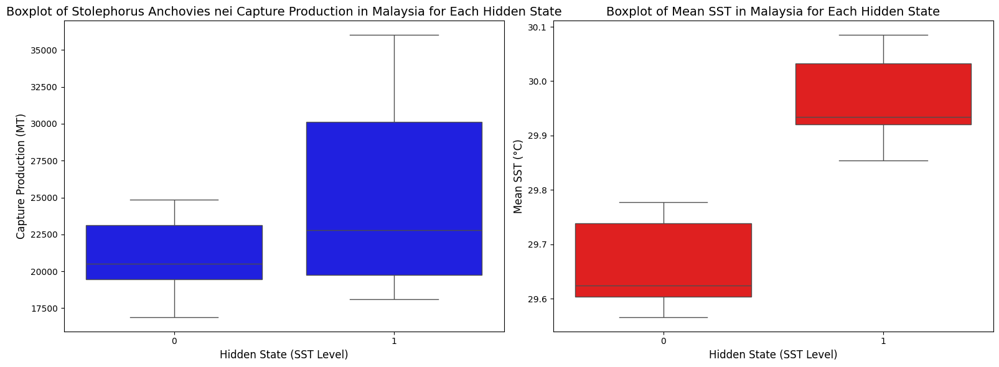

T-statistic: -1.7550684526033484, P-value: 0.0962527606848859
Observation Data: 
 [[20319.   ]
 [23449.   ]
 [16887.   ]
 [19425.   ]
 [23975.   ]
 [19600.   ]
 [20735.   ]
 [18605.   ]
 [19085.   ]
 [19452.   ]
 [20643.   ]
 [24837.   ]
 [22093.   ]
 [36027.   ]
 [31267.   ]
 [24503.   ]
 [32440.48 ]
 [26667.333]
 [21038.   ]
 [18098.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [111]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = stole_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Stolephorus Anchovies nei Capture Production in Malaysia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = stole_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
stole_my_0 = stole_my[stole_my["Hidden State (Interval)"] == 0]["VALUE"]
stole_my_1 = stole_my[stole_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(stole_my_0, stole_my_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
stole_my_hs_int = stole_my.pop("Hidden State (Interval)").values

stole_my_x = stole_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
stole_my_x = stole_my_x.values

print("Observation Data: \n", stole_my_x)
print("Hidden State - Interval: \n", stole_my_hs_int)

#### Model

In [112]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(stole_my_x, stole_my_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

stole_my = pd.concat([stole_my.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 0 0]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


Note: Model can't predict hidden state on new observations. 

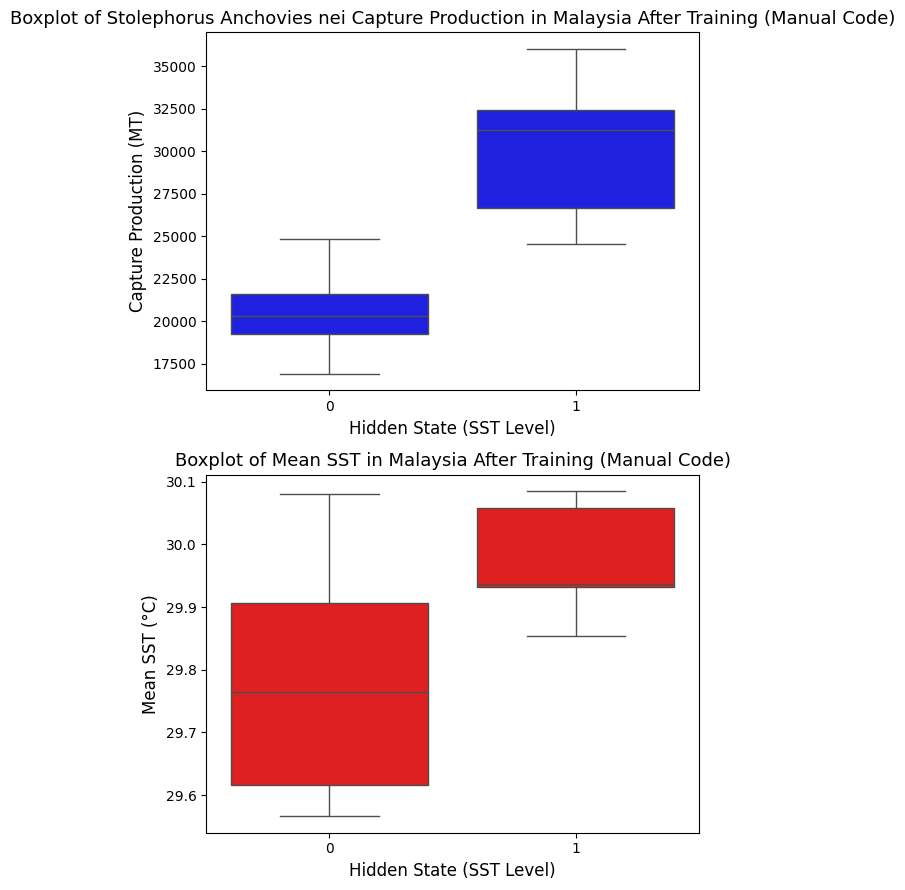

In [113]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = stole_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Stolephorus Anchovies nei Capture Production in Malaysia After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = stole_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [114]:
# Mean of every state (trained)
mean_sst_state = stole_my.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = stole_my.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
stole_my_0 = stole_my[stole_my["Predicted HS (Manual Code)"] == 0]["Mean SST"]
stole_my_1 = stole_my[stole_my["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(stole_my_0, stole_my_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.758257
1    29.973323
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.659935
1    29.964113
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -3.5865719391391058, p-value: 0.003666935916615441


#### Re-train

In [115]:
# Manual Code (retrain and forecast)
stole_my_x_retrain = stole_my_x[:-1]
stole_my_hs_int_retrain = stole_my_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(stole_my_x_retrain, stole_my_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1]


In [116]:
# Forecast 2022
sst2022_my = stole_my[stole_my["PERIOD"] == 2022]["Mean SST"].values

if sst2022_my < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([17733.0786195115]), array([37768.4756545182]))


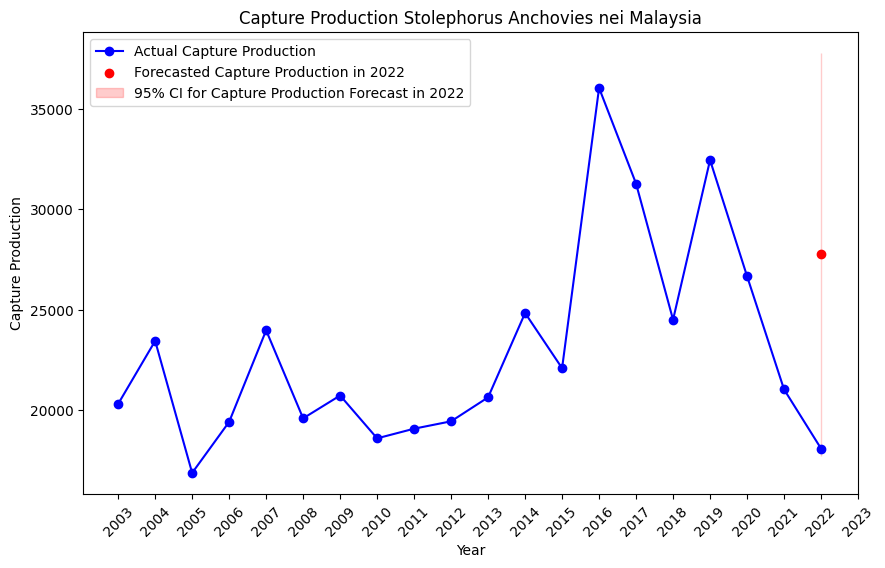

In [117]:
# Plot for CP
years = stole_my["PERIOD"].values
values = stole_my["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Stolephorus Anchovies nei Malaysia")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

Note: Model performed poorly when forecasting capture production at T+1.

### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


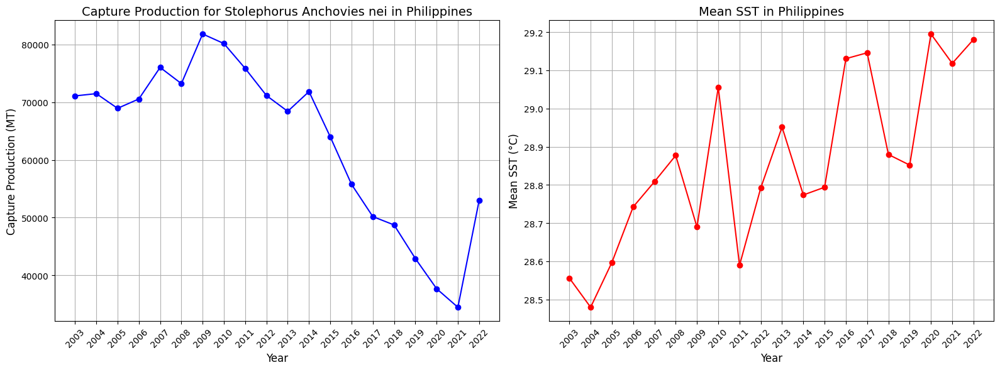

In [118]:
# Extract Stolephorus Anchovies nei
stole_ph = df_marine[(df_marine["Species"] == "Stolephorus anchovies nei") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
stole_ph = stole_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
stole_ph = stole_ph.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
stole_ph = stole_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
stole_ph["PERIOD"] = stole_ph["PERIOD"].astype(int)

# Assign hidden states by equal intervals
stole_ph, midpoint = hs_interval(stole_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(stole_ph["PERIOD"], stole_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Stolephorus Anchovies nei in Philippines", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(stole_ph["PERIOD"], stole_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Philippines", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = stole_ph["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

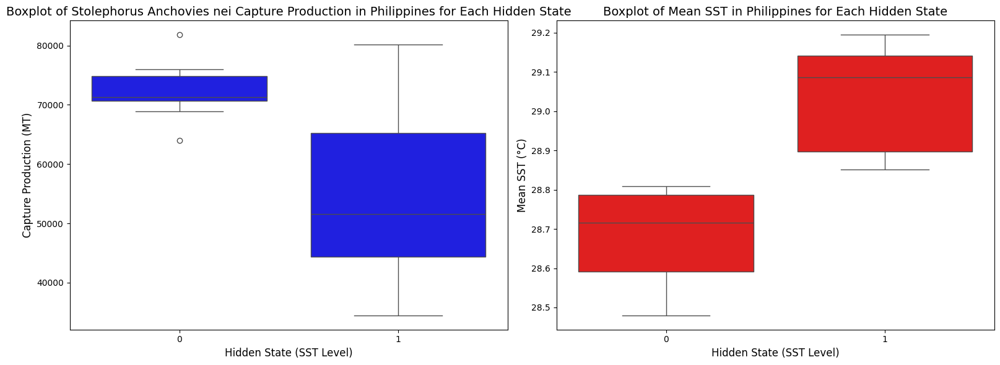

T-statistic: 3.5403475989042263, P-value: 0.002337550368358457
Observation Data: 
 [[71101.   ]
 [71498.   ]
 [68947.   ]
 [70569.   ]
 [76042.   ]
 [73235.   ]
 [81842.   ]
 [80183.   ]
 [75867.   ]
 [71165.   ]
 [68425.   ]
 [71855.   ]
 [64007.   ]
 [55761.   ]
 [50174.   ]
 [48723.   ]
 [42900.   ]
 [37663.26 ]
 [34445.44 ]
 [52993.623]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [119]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = stole_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Stolephorus Anchovies nei Capture Production in Philippines for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = stole_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
stole_ph_0 = stole_ph[stole_ph["Hidden State (Interval)"] == 0]["VALUE"]
stole_ph_1 = stole_ph[stole_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(stole_ph_0, stole_ph_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
stole_ph_hs_int = stole_ph.pop("Hidden State (Interval)").values

stole_ph_x = stole_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
stole_ph_x = stole_ph_x.values

print("Observation Data: \n", stole_ph_x)
print("Hidden State - Interval: \n", stole_ph_hs_int)

#### Model

In [120]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(stole_ph_x, stole_ph_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

stole_ph = pd.concat([stole_ph.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


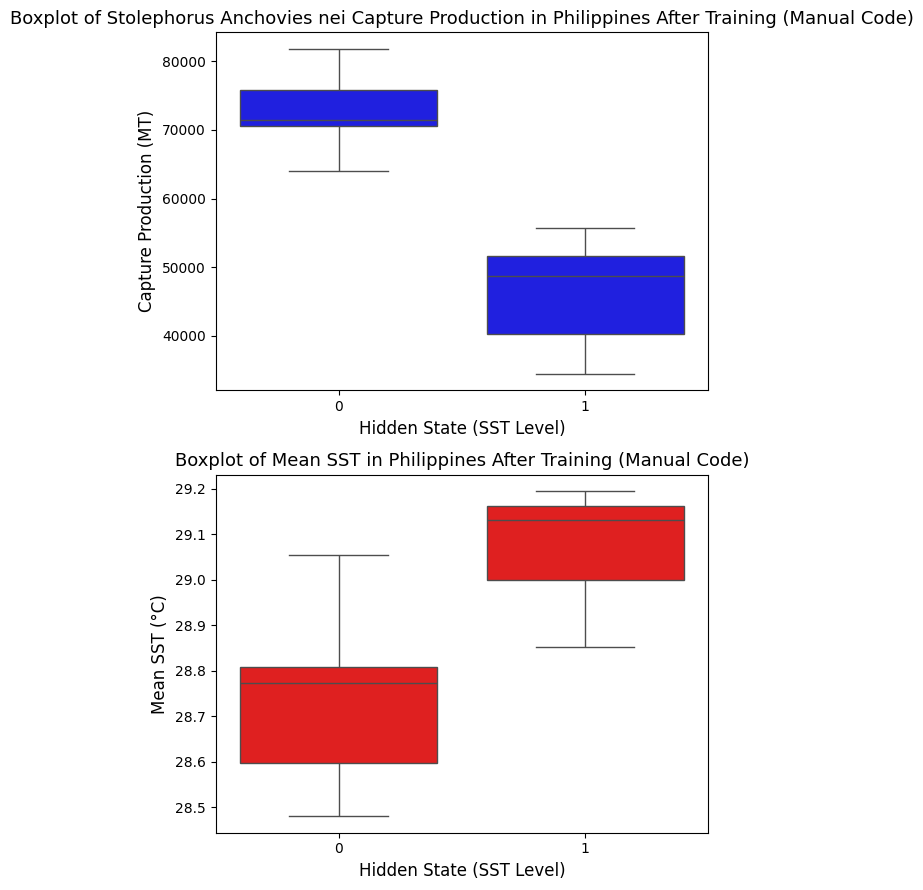

In [121]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = stole_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Stolephorus Anchovies nei Capture Production in Philippines After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = stole_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [122]:
# Mean of every state (trained)
mean_sst_state = stole_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = stole_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
stole_ph_0 = stole_ph[stole_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
stole_ph_1 = stole_ph[stole_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(stole_ph_0, stole_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    28.746571
1    29.071705
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -4.597483676139721, p-value: 0.00041984856438432477


#### Re-train

In [123]:
# Manual Code (retrain and forecast)
stole_ph_x_retrain = stole_ph_x[:-1]
stole_ph_hs_int_retrain = stole_ph_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(stole_ph_x_retrain, stole_ph_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1]


In [124]:
# Forecast 2022
sst2022_ph = stole_ph[stole_ph["PERIOD"] == 2022]["Mean SST"].values

if sst2022_ph < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([29792.1231552137]), array([61540.3871380494]))


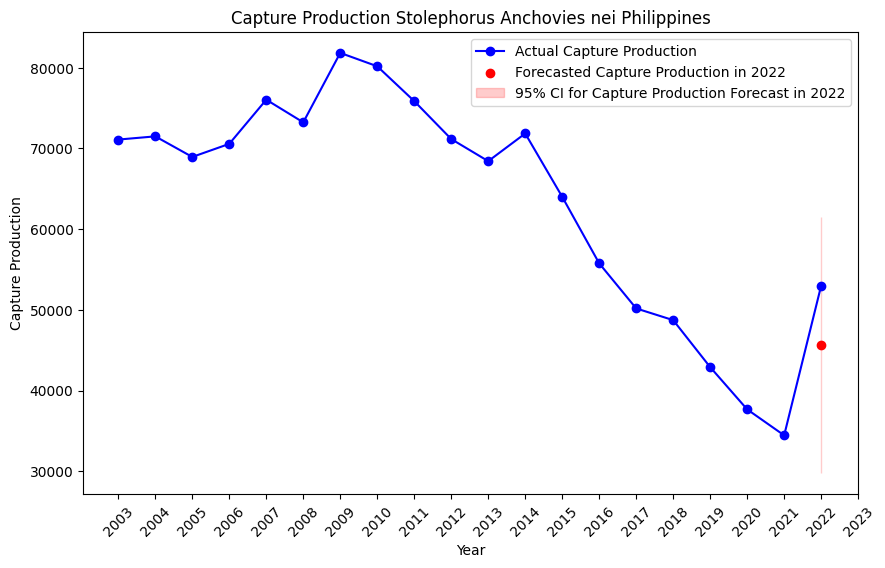

In [125]:
# Plot for CP
years = stole_ph["PERIOD"].values
values = stole_ph["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Stolephorus Anchovies nei Philippines")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

## Kawakawa (model + forecast done)

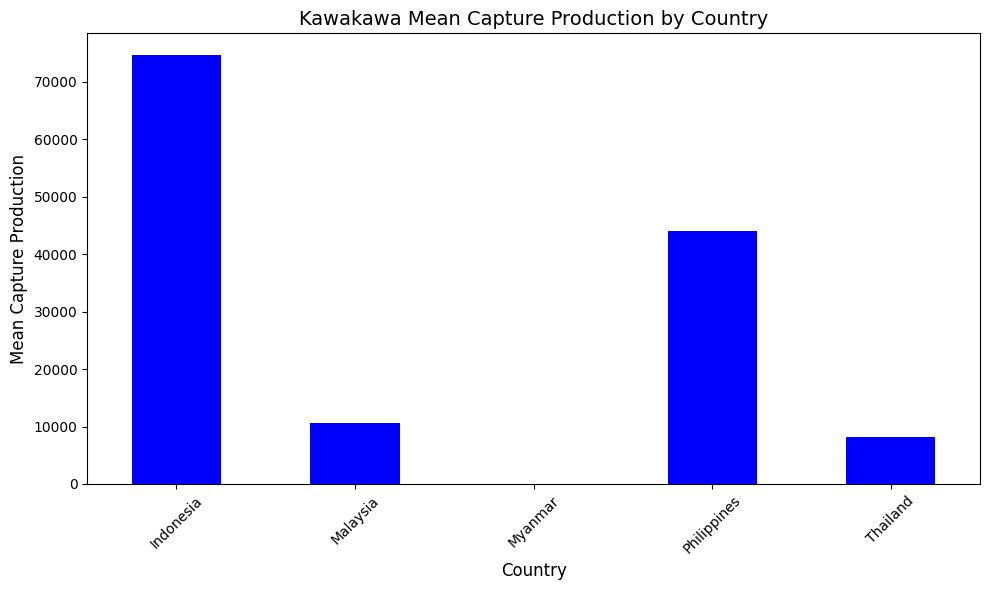

In [126]:
# Plot Kawakawa bar chart for every country.
kawakawa_df = df_marine[df_marine["Species"] == "Kawakawa"]

mean_by_country = kawakawa_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Country", fontsize = 12)
plt.ylabel("Mean Capture Production", fontsize = 12)
plt.title("Kawakawa Mean Capture Production by Country", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


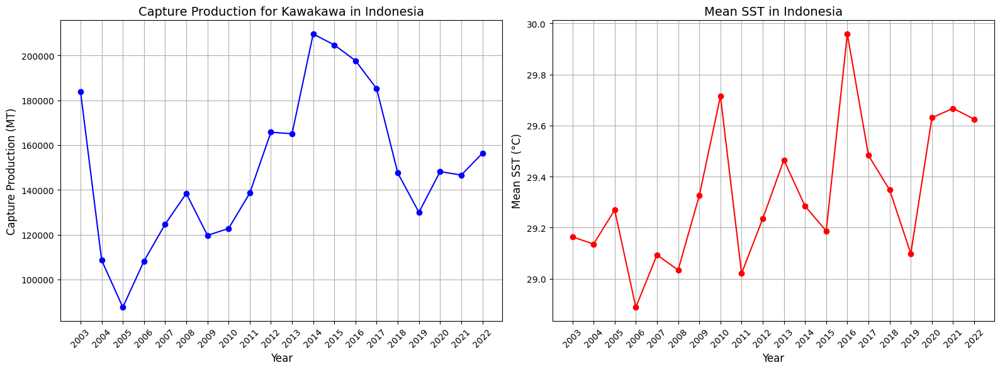

In [127]:
# Extract Kawakawa
kawakawa_id = df_marine[(df_marine["Species"] == "Kawakawa") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
kawakawa_id = kawakawa_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
kawakawa_id = kawakawa_id.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
kawakawa_id = kawakawa_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
kawakawa_id["PERIOD"] = kawakawa_id["PERIOD"].astype(int)

# Assign hidden states by equal intervals
kawakawa_id, midpoint = hs_interval(kawakawa_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(kawakawa_id["PERIOD"], kawakawa_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Kawakawa in Indonesia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(kawakawa_id["PERIOD"], kawakawa_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Indonesia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = kawakawa_id["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

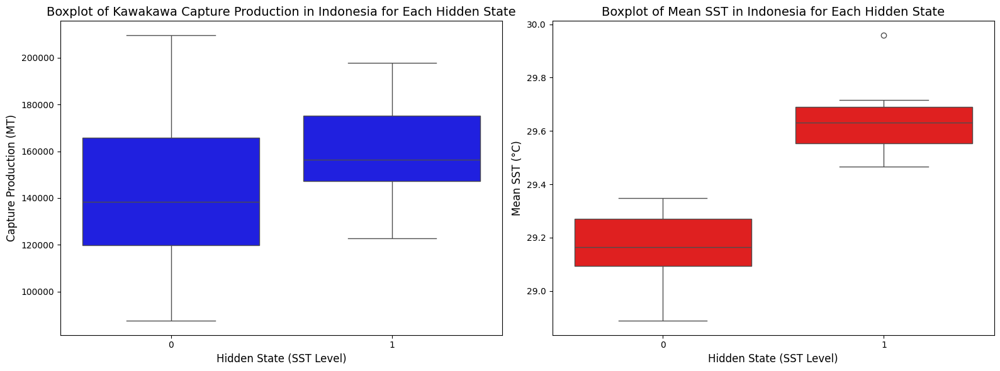

T-statistic: -1.177638510026559, P-value: 0.2552604165615726
Observation Data: 
 [[183864.   ]
 [108529.   ]
 [ 87583.   ]
 [108195.   ]
 [124634.   ]
 [138384.   ]
 [119713.   ]
 [122726.   ]
 [138528.   ]
 [165719.189]
 [165041.   ]
 [209578.809]
 [204687.161]
 [197680.647]
 [185163.121]
 [147505.086]
 [129952.316]
 [148146.419]
 [146602.587]
 [156308.933]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [128]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = kawakawa_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Kawakawa Capture Production in Indonesia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = kawakawa_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
kawakawa_id_0 = kawakawa_id[kawakawa_id["Hidden State (Interval)"] == 0]["VALUE"]
kawakawa_id_1 = kawakawa_id[kawakawa_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(kawakawa_id_0, kawakawa_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
kawakawa_id_hs_int = kawakawa_id.pop("Hidden State (Interval)").values

kawakawa_id_x = kawakawa_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
kawakawa_id_x = kawakawa_id_x.values

print("Observation Data: \n", kawakawa_id_x)
print("Hidden State - Interval: \n", kawakawa_id_hs_int)

### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


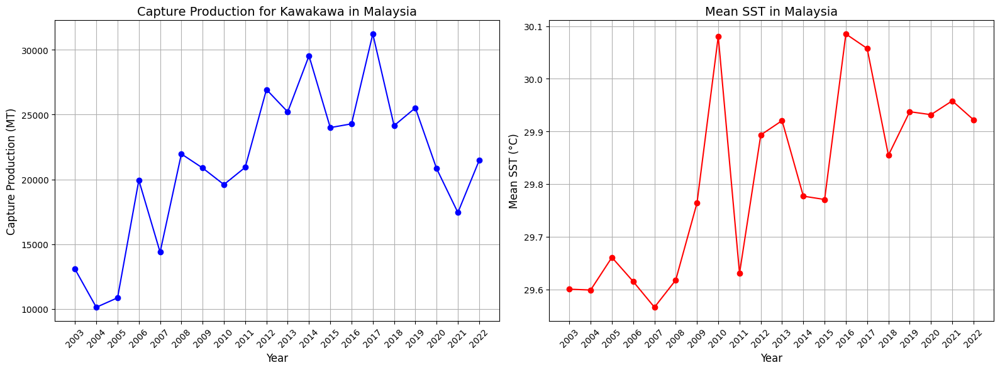

In [96]:
# Extract Kawakawa
kawakawa_my = df_marine[(df_marine["Species"] == "Kawakawa") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
kawakawa_my = kawakawa_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
kawakawa_my = kawakawa_my.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
kawakawa_my = kawakawa_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
kawakawa_my["PERIOD"] = kawakawa_my["PERIOD"].astype(int)

# Assign hidden states by equal intervals
kawakawa_my, midpoint = hs_interval(kawakawa_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(kawakawa_my["PERIOD"], kawakawa_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Kawakawa in Malaysia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(kawakawa_my["PERIOD"], kawakawa_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Malaysia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = kawakawa_my["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

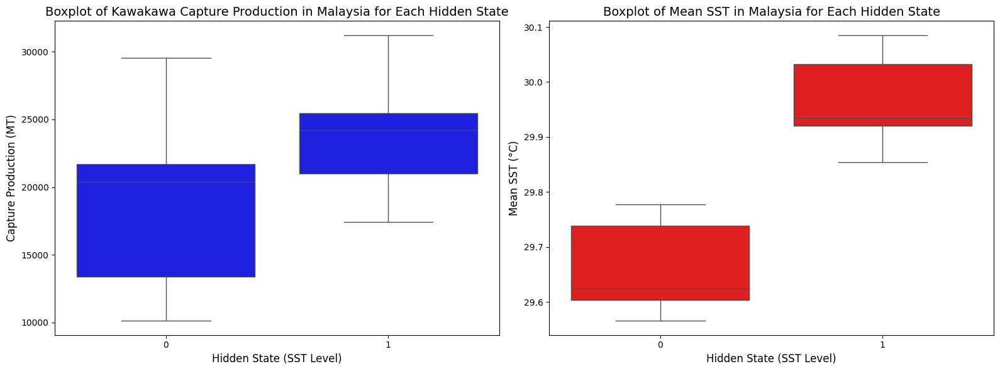

T-statistic: -2.173600485376653, P-value: 0.043324190978408464
Observation Data: 
 [[13075.   ]
 [10136.   ]
 [10866.   ]
 [19940.   ]
 [14384.   ]
 [21962.   ]
 [20877.   ]
 [19602.   ]
 [20927.   ]
 [26931.181]
 [25206.   ]
 [29533.   ]
 [23995.   ]
 [24284.321]
 [31216.054]
 [24144.878]
 [25515.532]
 [20830.37 ]
 [17442.073]
 [21462.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [97]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = kawakawa_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Kawakawa Capture Production in Malaysia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = kawakawa_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
kawakawa_my_0 = kawakawa_my[kawakawa_my["Hidden State (Interval)"] == 0]["VALUE"]
kawakawa_my_1 = kawakawa_my[kawakawa_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(kawakawa_my_0, kawakawa_my_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
kawakawa_my_hs_int = kawakawa_my.pop("Hidden State (Interval)").values

kawakawa_my_x = kawakawa_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
kawakawa_my_x = kawakawa_my_x.values

print("Observation Data: \n", kawakawa_my_x)
print("Hidden State - Interval: \n", kawakawa_my_hs_int)

#### Model

In [98]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(kawakawa_my_x, kawakawa_my_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

kawakawa_my = pd.concat([kawakawa_my.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


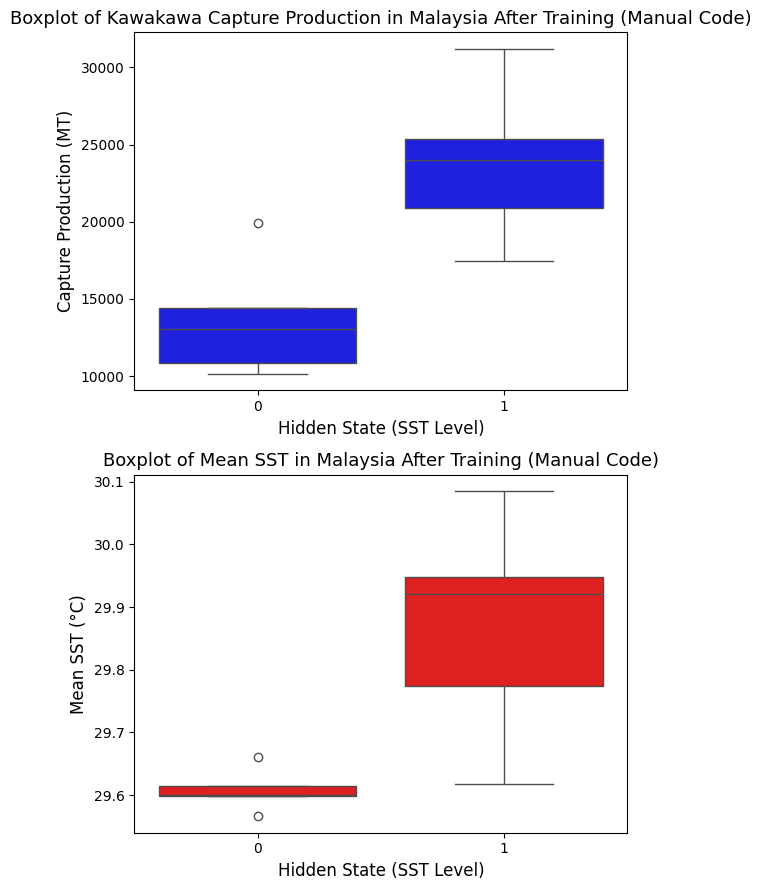

In [99]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = kawakawa_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Kawakawa Capture Production in Malaysia After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = kawakawa_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [100]:
# Mean of every state (trained)
mean_sst_state = kawakawa_my.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = kawakawa_my.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
kawakawa_my_0 = kawakawa_my[kawakawa_my["Predicted HS (Manual Code)"] == 0]["Mean SST"]
kawakawa_my_1 = kawakawa_my[kawakawa_my["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(kawakawa_my_0, kawakawa_my_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.608022
1    29.880024
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.659935
1    29.964113
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -6.6883590841248415, p-value: 3.4062233173819414e-06


#### Re-train

In [101]:
# Manual Code (retrain and forecast)
kawakawa_my_x_retrain = kawakawa_my_x[:-1]
kawakawa_my_hs_int_retrain = kawakawa_my_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(kawakawa_my_x_retrain, kawakawa_my_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1]


In [102]:
# Forecast 2022
sst2022_my = kawakawa_my[kawakawa_my["PERIOD"] == 2022]["Mean SST"].values

if sst2022_my < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([15893.9757202167]), array([31104.7280556984]))


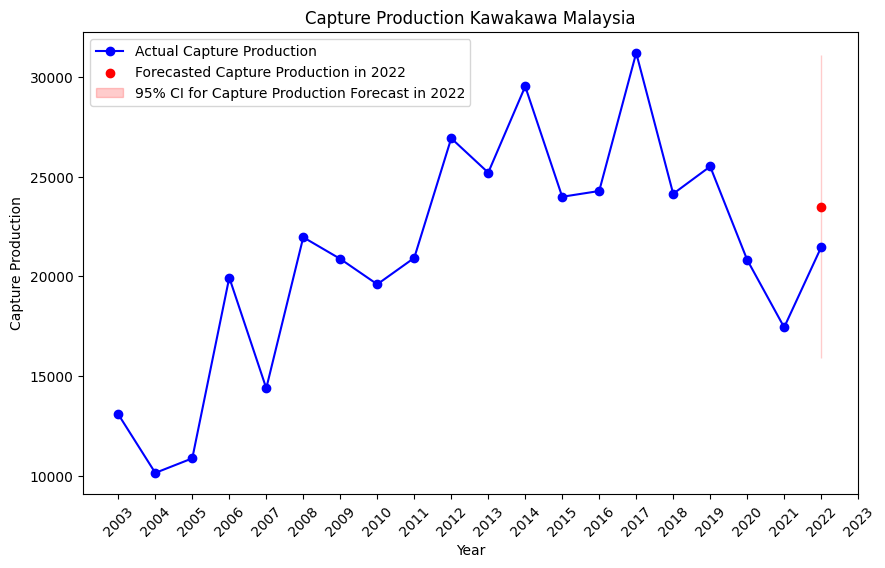

In [103]:
# Plot for CP
years = kawakawa_my["PERIOD"].values
values = kawakawa_my["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Kawakawa Malaysia")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


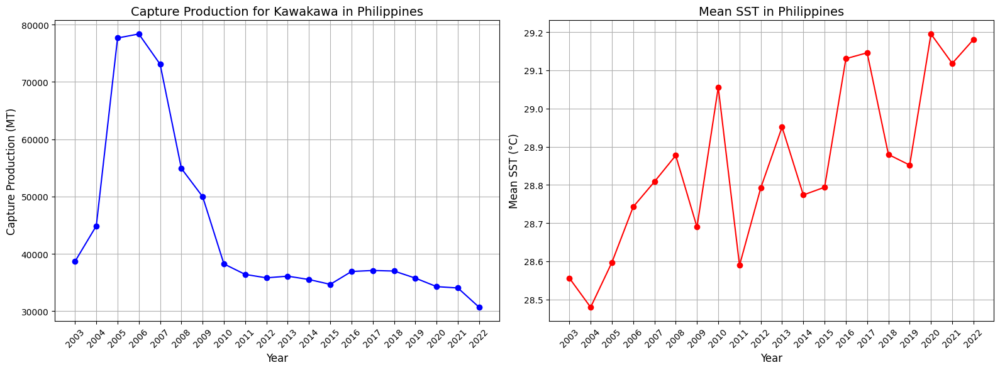

In [137]:
# Extract Kawakawa
kawakawa_ph = df_marine[(df_marine["Species"] == "Kawakawa") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
kawakawa_ph = kawakawa_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
kawakawa_ph = kawakawa_ph.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
kawakawa_ph = kawakawa_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
kawakawa_ph["PERIOD"] = kawakawa_ph["PERIOD"].astype(int)

# Assign hidden states by equal intervals
kawakawa_ph, midpoint = hs_interval(kawakawa_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(kawakawa_ph["PERIOD"], kawakawa_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Kawakawa in Philippines", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(kawakawa_ph["PERIOD"], kawakawa_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Philippines", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = kawakawa_ph["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

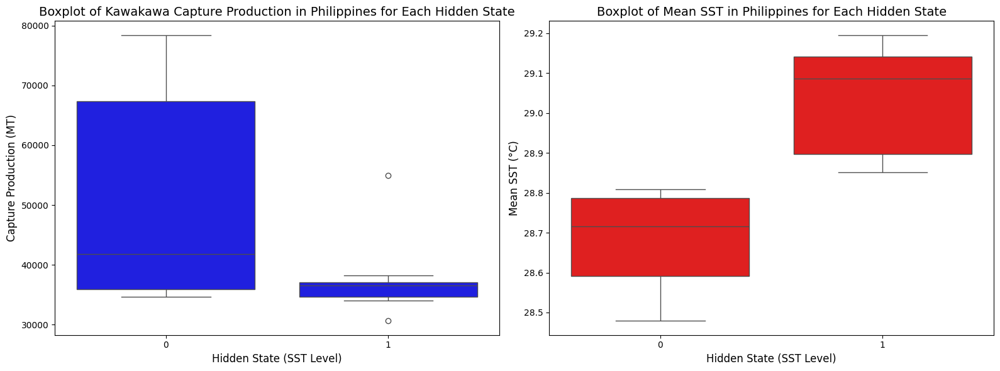

T-statistic: 2.096168536043017, P-value: 0.050467672701734585
Observation Data: 
 [[38675.   ]
 [44875.   ]
 [77674.   ]
 [78377.   ]
 [73094.   ]
 [54907.   ]
 [49973.   ]
 [38237.   ]
 [36403.   ]
 [35807.   ]
 [36100.   ]
 [35514.   ]
 [34671.   ]
 [36918.   ]
 [37090.   ]
 [36993.   ]
 [35759.   ]
 [34273.26 ]
 [34035.85 ]
 [30668.855]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [138]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = kawakawa_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Kawakawa Capture Production in Philippines for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = kawakawa_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
kawakawa_ph_0 = kawakawa_ph[kawakawa_ph["Hidden State (Interval)"] == 0]["VALUE"]
kawakawa_ph_1 = kawakawa_ph[kawakawa_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(kawakawa_ph_0, kawakawa_ph_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
kawakawa_ph_hs_int = kawakawa_ph.pop("Hidden State (Interval)").values

kawakawa_ph_x = kawakawa_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
kawakawa_ph_x = kawakawa_ph_x.values

print("Observation Data: \n", kawakawa_ph_x)
print("Hidden State - Interval: \n", kawakawa_ph_hs_int)

#### Model

In [139]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(kawakawa_ph_x, kawakawa_ph_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

kawakawa_ph = pd.concat([kawakawa_ph.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


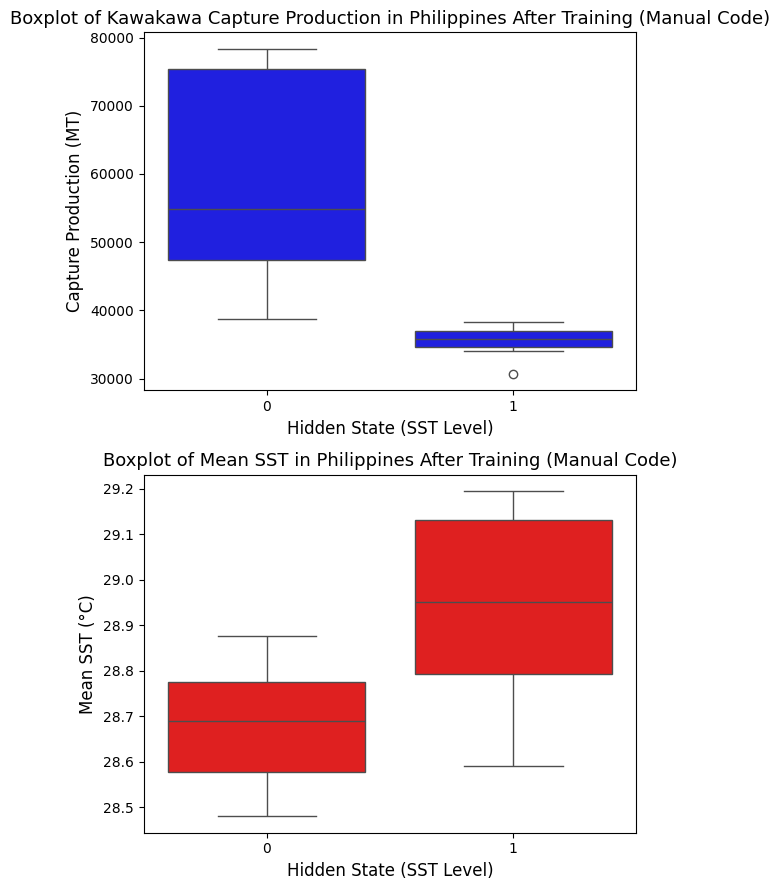

In [140]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = kawakawa_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Kawakawa Capture Production in Philippines After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = kawakawa_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [141]:
# Mean of every state (trained)
mean_sst_state = kawakawa_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = kawakawa_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
kawakawa_ph_0 = kawakawa_ph[kawakawa_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
kawakawa_ph_1 = kawakawa_ph[kawakawa_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(kawakawa_ph_0, kawakawa_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    28.678503
1    28.958295
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -3.683474974973162, p-value: 0.002020800388515331


#### Re-train

In [142]:
# Manual Code (retrain and forecast)
kawakawa_ph_x_retrain = kawakawa_ph_x[:-1]
kawakawa_ph_hs_int_retrain = kawakawa_ph_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(kawakawa_ph_x_retrain, kawakawa_ph_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1]


In [143]:
# Forecast 2022
sst2022_ph = kawakawa_ph[kawakawa_ph["PERIOD"] == 2022]["Mean SST"].values

if sst2022_ph < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([33651.6172435842]), array([38258.1663353892]))


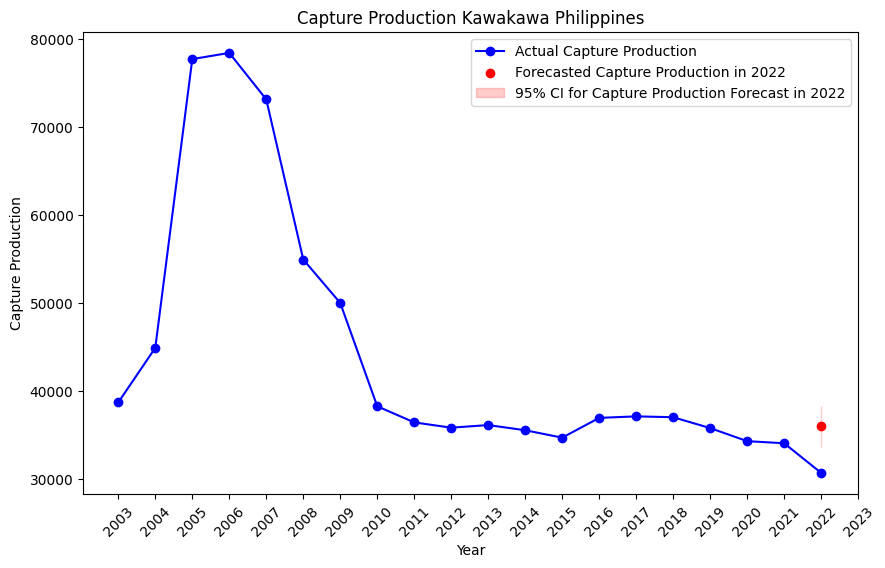

In [144]:
# Plot for CP
years = kawakawa_ph["PERIOD"].values
values = kawakawa_ph["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Kawakawa Philippines")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


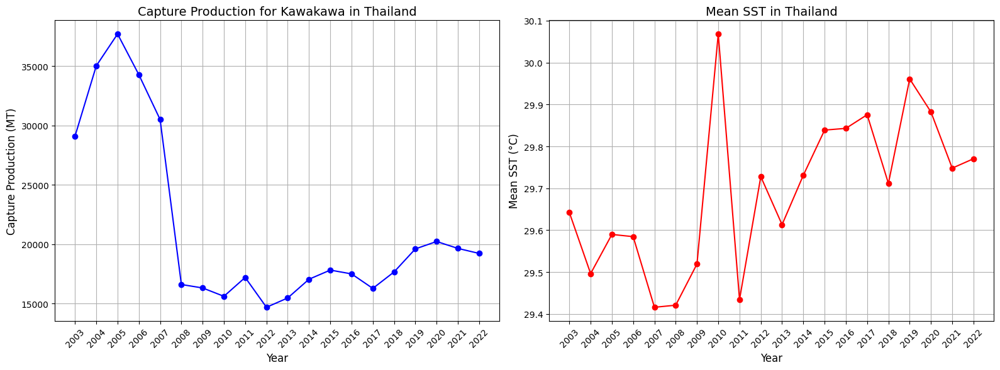

In [104]:
# Extract Kawakawa
kawakawa_th = df_marine[(df_marine["Species"] == "Kawakawa") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
kawakawa_th = kawakawa_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
kawakawa_th = kawakawa_th.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
kawakawa_th = kawakawa_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
kawakawa_th["PERIOD"] = kawakawa_th["PERIOD"].astype(int)

# Assign hidden states by equal intervals
kawakawa_th, midpoint = hs_interval(kawakawa_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(kawakawa_th["PERIOD"], kawakawa_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Kawakawa in Thailand", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(kawakawa_th["PERIOD"], kawakawa_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Thailand", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = kawakawa_th["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

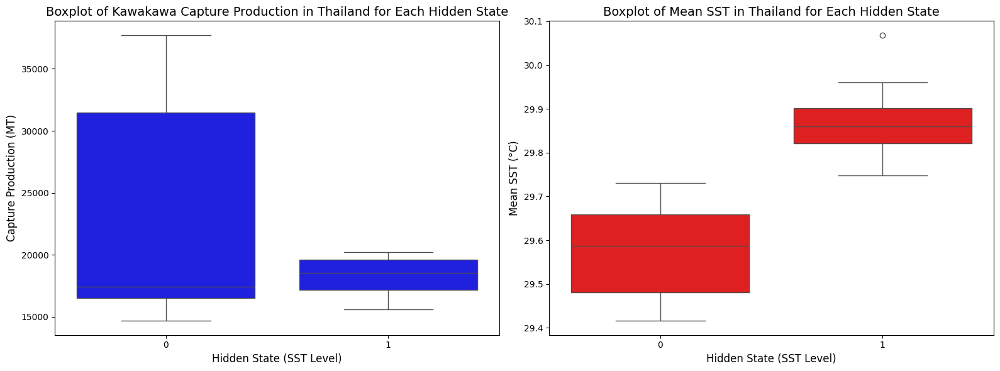

T-statistic: 1.9640554590229322, P-value: 0.07280055773943121
Observation Data: 
 [[29105.   ]
 [35028.   ]
 [37711.   ]
 [34284.   ]
 [30504.   ]
 [16601.   ]
 [16310.   ]
 [15607.   ]
 [17195.64 ]
 [14682.66 ]
 [15467.46 ]
 [17045.1  ]
 [17815.6  ]
 [17495.416]
 [16272.519]
 [17658.91 ]
 [19600.75 ]
 [20225.   ]
 [19643.09 ]
 [19219.07 ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [105]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = kawakawa_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Kawakawa Capture Production in Thailand for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = kawakawa_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Thailand for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
kawakawa_th_0 = kawakawa_th[kawakawa_th["Hidden State (Interval)"] == 0]["VALUE"]
kawakawa_th_1 = kawakawa_th[kawakawa_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(kawakawa_th_0, kawakawa_th_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
kawakawa_th_hs_int = kawakawa_th.pop("Hidden State (Interval)").values

kawakawa_th_x = kawakawa_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
kawakawa_th_x = kawakawa_th_x.values

print("Observation Data: \n", kawakawa_th_x)
print("Hidden State - Interval: \n", kawakawa_th_hs_int)

#### Model

In [109]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(kawakawa_th_x, kawakawa_th_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

kawakawa_th = pd.concat([kawakawa_th.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


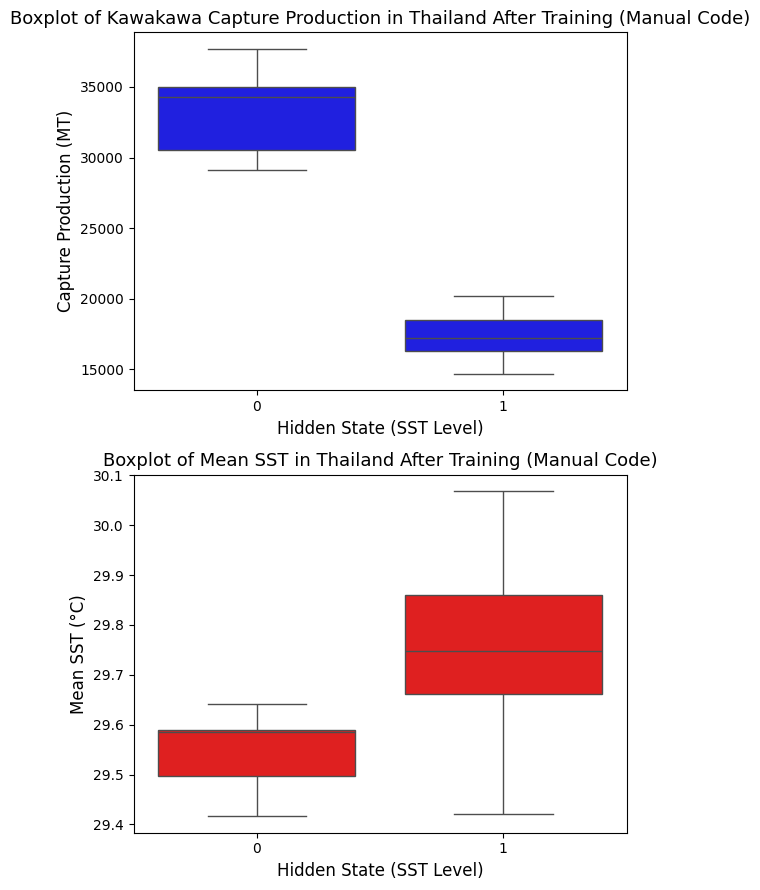

In [110]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = kawakawa_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Kawakawa Capture Production in Thailand After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = kawakawa_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Thailand After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [111]:
# Mean of every state (trained)
mean_sst_state = kawakawa_th.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = kawakawa_th.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
kawakawa_th_0 = kawakawa_th[kawakawa_th["Predicted HS (Manual Code)"] == 0]["Mean SST"]
kawakawa_th_1 = kawakawa_th[kawakawa_th["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(kawakawa_th_0, kawakawa_th_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.545883
1    29.743132
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.574047
1    29.873479
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -3.169102327003633, p-value: 0.006414548289347363


#### Re-train

In [112]:
# Manual Code (retrain and forecast)
kawakawa_th_x_retrain = kawakawa_th_x[:-1]
kawakawa_th_hs_int_retrain = kawakawa_th_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(kawakawa_th_x_retrain, kawakawa_th_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1]


In [113]:
# Forecast 2022
sst2022_th = kawakawa_th[kawakawa_th["PERIOD"] == 2022]["Mean SST"].values

if sst2022_th < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([14140.8513121701]), array([20376.3178960495]))


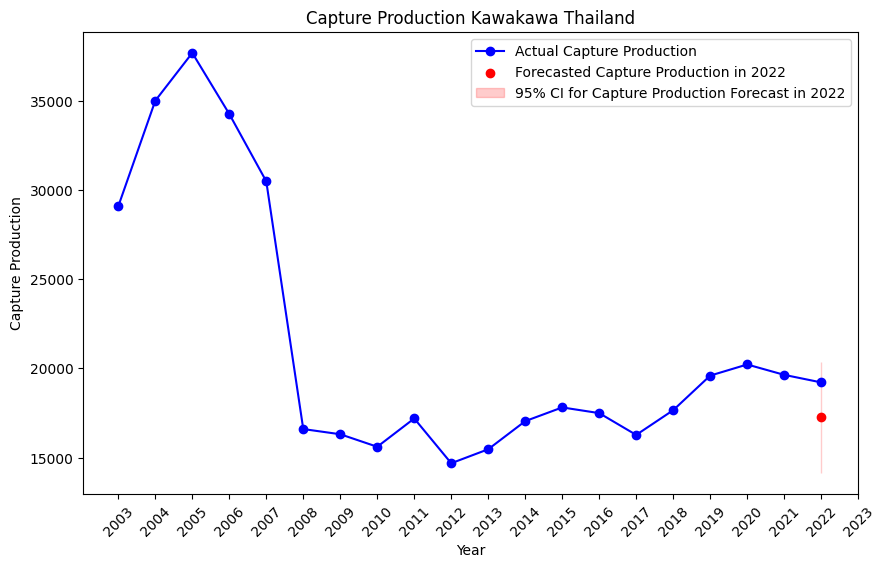

In [114]:
# Plot for CP
years = kawakawa_th["PERIOD"].values
values = kawakawa_th["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Kawakawa Thailand")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

## Skipjack tuna (model + forecast done)

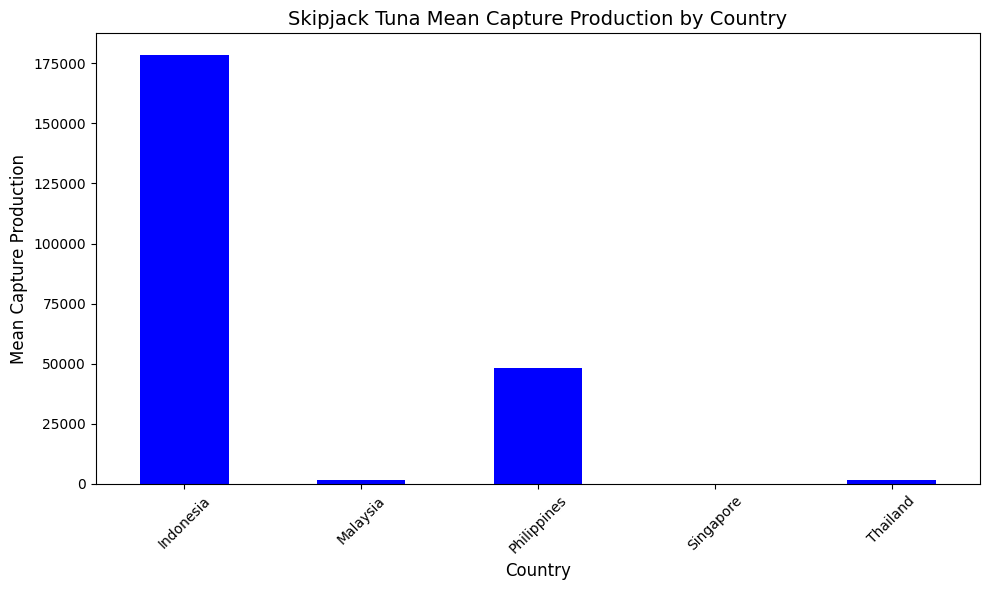

In [149]:
# Plot Skipjack Tuna bar chart for every country.
skipjack_df = df_marine[df_marine["Species"] == "Skipjack tuna"]

mean_by_country = skipjack_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Country", fontsize = 12)
plt.ylabel("Mean Capture Production", fontsize = 12)
plt.title("Skipjack Tuna Mean Capture Production by Country", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


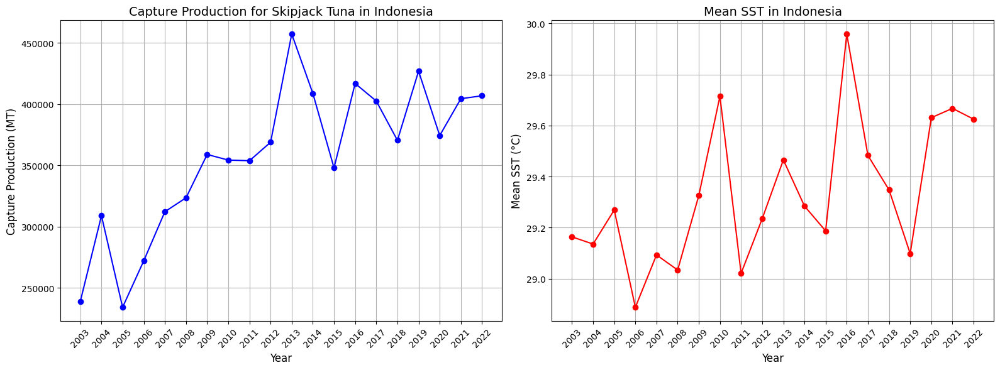

In [150]:
# Extract Skipjack Tuna
skipjack_id = df_marine[(df_marine["Species"] == "Skipjack tuna") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
skipjack_id = skipjack_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
skipjack_id = skipjack_id.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
skipjack_id = skipjack_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
skipjack_id["PERIOD"] = skipjack_id["PERIOD"].astype(int)

# Assign hidden states by equal intervals
skipjack_id, midpoint = hs_interval(skipjack_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(skipjack_id["PERIOD"], skipjack_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Skipjack Tuna in Indonesia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(skipjack_id["PERIOD"], skipjack_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Indonesia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = skipjack_id["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

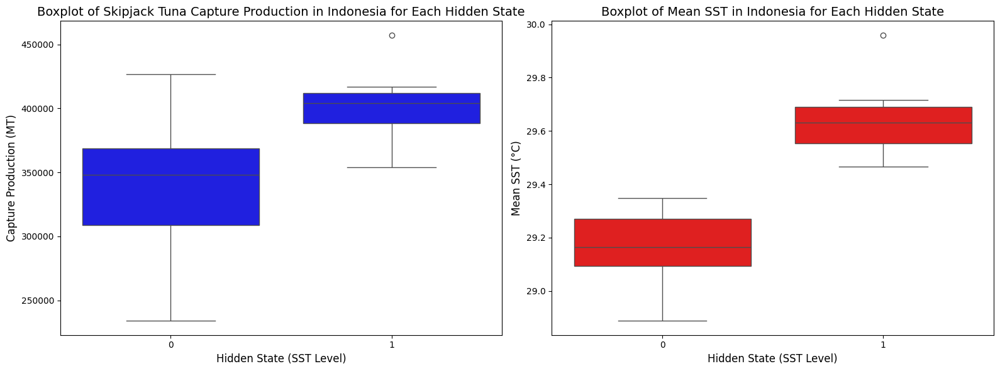

T-statistic: -3.397768414811746, P-value: 0.003218411586889376
Observation Data: 
 [[238966.   ]
 [308809.   ]
 [234069.   ]
 [271984.   ]
 [312105.   ]
 [323438.   ]
 [358836.   ]
 [354258.   ]
 [353727.   ]
 [368810.335]
 [457218.123]
 [408640.224]
 [347907.704]
 [416784.696]
 [402448.744]
 [370367.38 ]
 [426847.336]
 [374288.426]
 [404358.081]
 [406770.564]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [151]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = skipjack_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Skipjack Tuna Capture Production in Indonesia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = skipjack_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
skipjack_id_0 = skipjack_id[skipjack_id["Hidden State (Interval)"] == 0]["VALUE"]
skipjack_id_1 = skipjack_id[skipjack_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(skipjack_id_0, skipjack_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
skipjack_id_hs_int = skipjack_id.pop("Hidden State (Interval)").values

skipjack_id_x = skipjack_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
skipjack_id_x = skipjack_id_x.values

print("Observation Data: \n", skipjack_id_x)
print("Hidden State - Interval: \n", skipjack_id_hs_int)

#### Model

In [152]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(skipjack_id_x, skipjack_id_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

skipjack_id = pd.concat([skipjack_id.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


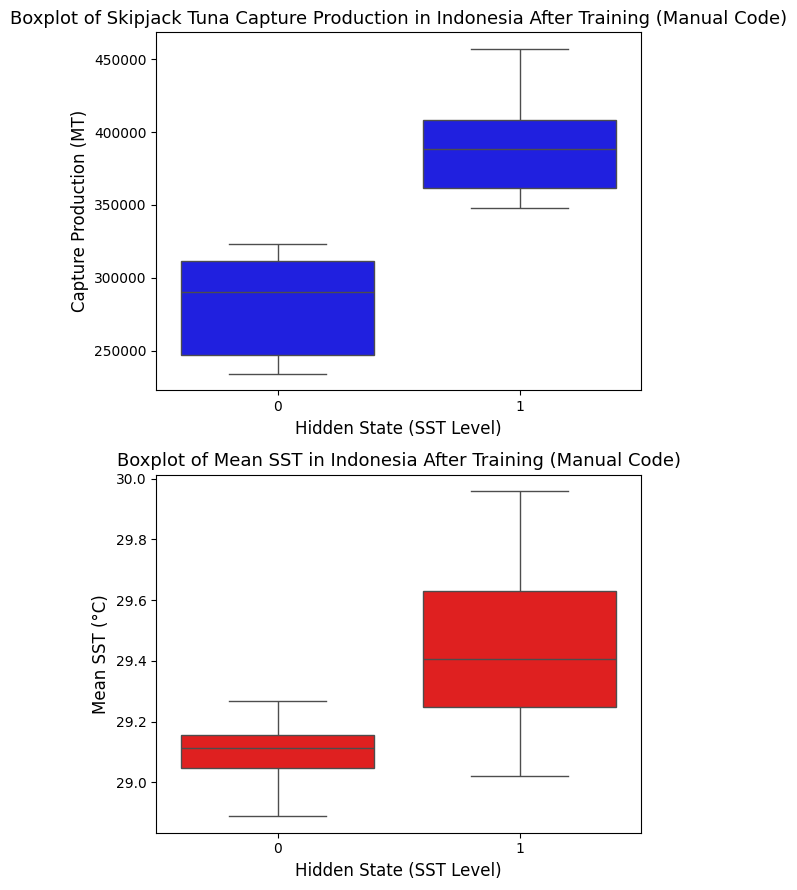

In [153]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = skipjack_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Skipjack Tuna Capture Production in Indonesia After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = skipjack_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [154]:
# Mean of every state (trained)
mean_sst_state = skipjack_id.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = skipjack_id.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
skipjack_id_0 = skipjack_id[skipjack_id["Predicted HS (Manual Code)"] == 0]["Mean SST"]
skipjack_id_1 = skipjack_id[skipjack_id["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_id_0, skipjack_id_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.097507
1    29.431983
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.160440
1    29.649582
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -3.789167278849846, p-value: 0.0014059898493125767


#### Re-train

In [156]:
# Manual Code (retrain and forecast)
skipjack_id_x_retrain = skipjack_id_x[:-1]
skipjack_id_hs_int_retrain = skipjack_id_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(skipjack_id_x_retrain, skipjack_id_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1]


In [157]:
# Forecast 2022
sst2022_id = skipjack_id[skipjack_id["PERIOD"] == 2022]["Mean SST"].values

if sst2022_id < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([319957.7142931357]), array([452651.2835896395]))


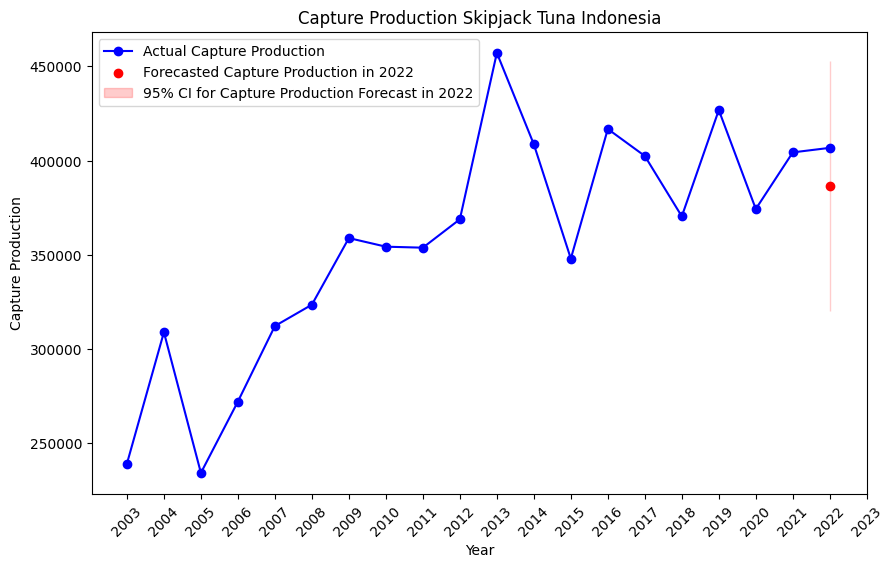

In [158]:
# Plot for CP
years = skipjack_id["PERIOD"].values
values = skipjack_id["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Skipjack Tuna Indonesia")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


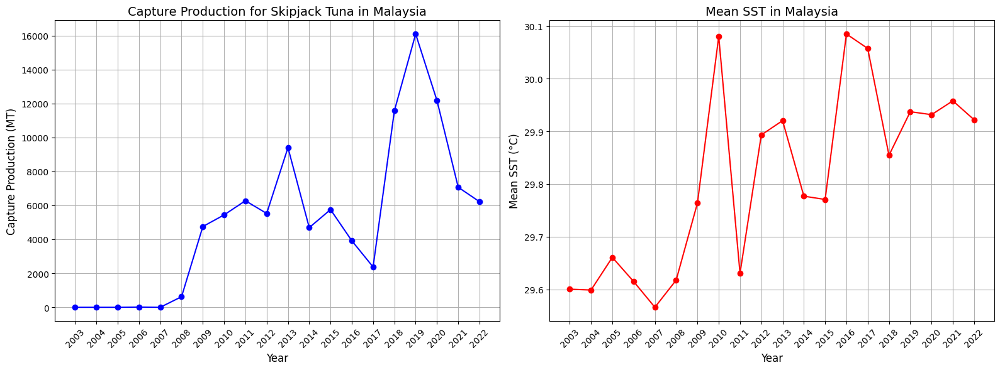

In [159]:
# Extract Skipjack Tuna
skipjack_my = df_marine[(df_marine["Species"] == "Skipjack tuna") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
skipjack_my = skipjack_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
skipjack_my = skipjack_my.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
skipjack_my = skipjack_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
skipjack_my["PERIOD"] = skipjack_my["PERIOD"].astype(int)

# Assign hidden states by equal intervals
skipjack_my, midpoint = hs_interval(skipjack_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(skipjack_my["PERIOD"], skipjack_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Skipjack Tuna in Malaysia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(skipjack_my["PERIOD"], skipjack_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Malaysia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = skipjack_my["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

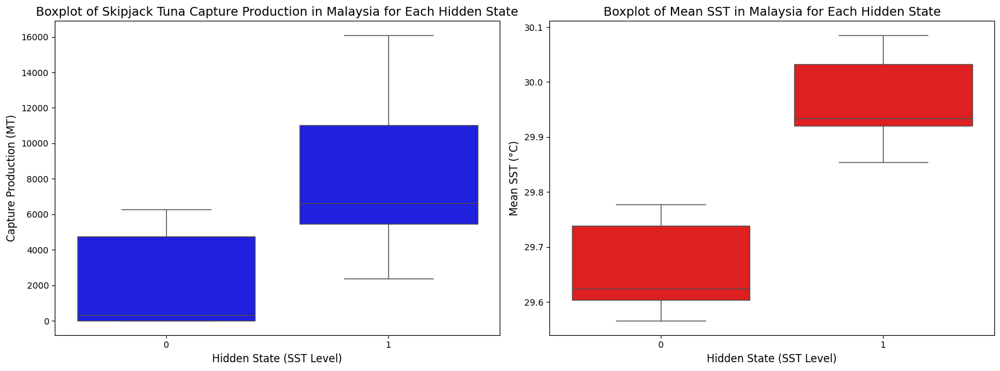

T-statistic: -3.5978869706618717, P-value: 0.002531739369935062
Observation Data: 
 [[    0.   ]
 [    0.   ]
 [    0.   ]
 [   12.   ]
 [    0.   ]
 [  622.   ]
 [ 4753.   ]
 [ 5438.   ]
 [ 6273.   ]
 [ 5523.44 ]
 [ 9399.   ]
 [ 4689.11 ]
 [ 5751.   ]
 [ 3916.558]
 [ 2373.329]
 [11568.361]
 [16090.227]
 [12176.306]
 [ 7066.479]
 [ 6216.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [160]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = skipjack_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Skipjack Tuna Capture Production in Malaysia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = skipjack_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
skipjack_my_0 = skipjack_my[skipjack_my["Hidden State (Interval)"] == 0]["VALUE"]
skipjack_my_1 = skipjack_my[skipjack_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(skipjack_my_0, skipjack_my_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
skipjack_my_hs_int = skipjack_my.pop("Hidden State (Interval)").values

skipjack_my_x = skipjack_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
skipjack_my_x = skipjack_my_x.values

print("Observation Data: \n", skipjack_my_x)
print("Hidden State - Interval: \n", skipjack_my_hs_int)

#### Model

In [161]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(skipjack_my_x, skipjack_my_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

skipjack_my = pd.concat([skipjack_my.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


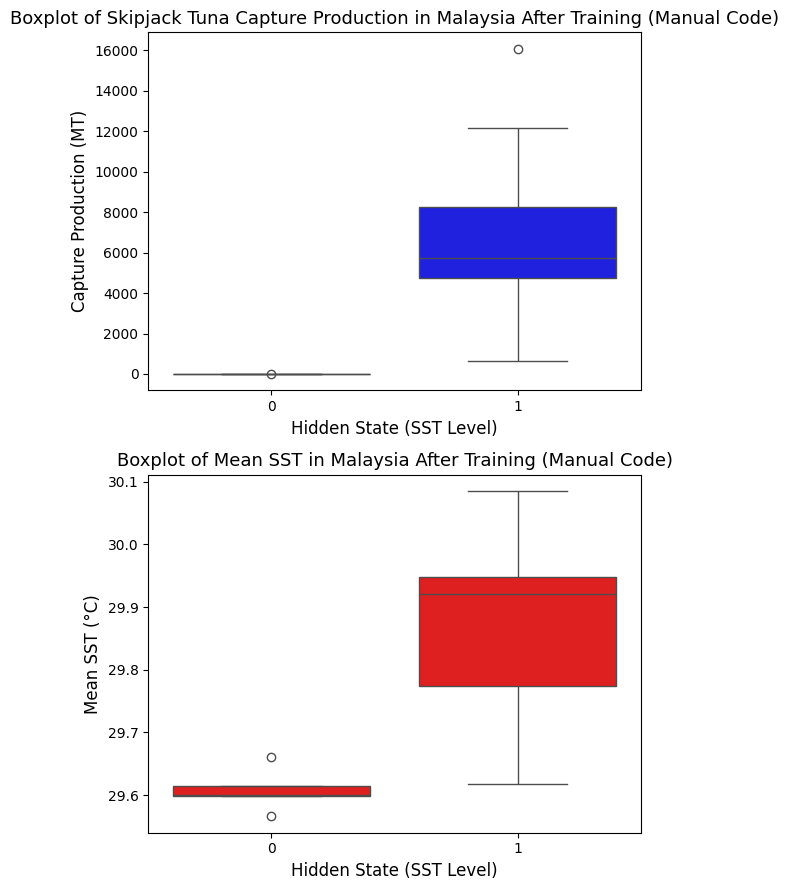

In [162]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = skipjack_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Skipjack Tuna Capture Production in Malaysia After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = skipjack_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [163]:
# Mean of every state (trained)
mean_sst_state = skipjack_my.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = skipjack_my.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
skipjack_my_0 = skipjack_my[skipjack_my["Predicted HS (Manual Code)"] == 0]["Mean SST"]
skipjack_my_1 = skipjack_my[skipjack_my["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_my_0, skipjack_my_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.608022
1    29.880024
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.659935
1    29.964113
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -6.6883590841248415, p-value: 3.4062233173819414e-06


#### Re-train

In [164]:
# Manual Code (retrain and forecast)
skipjack_my_x_retrain = skipjack_my_x[:-1]
skipjack_my_hs_int_retrain = skipjack_my_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(skipjack_my_x_retrain, skipjack_my_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1]


In [165]:
# Forecast 2022
sst2022_my = skipjack_my[skipjack_my["PERIOD"] == 2022]["Mean SST"].values

if sst2022_my < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([-1015.0857308629]), array([14677.5295670881]))


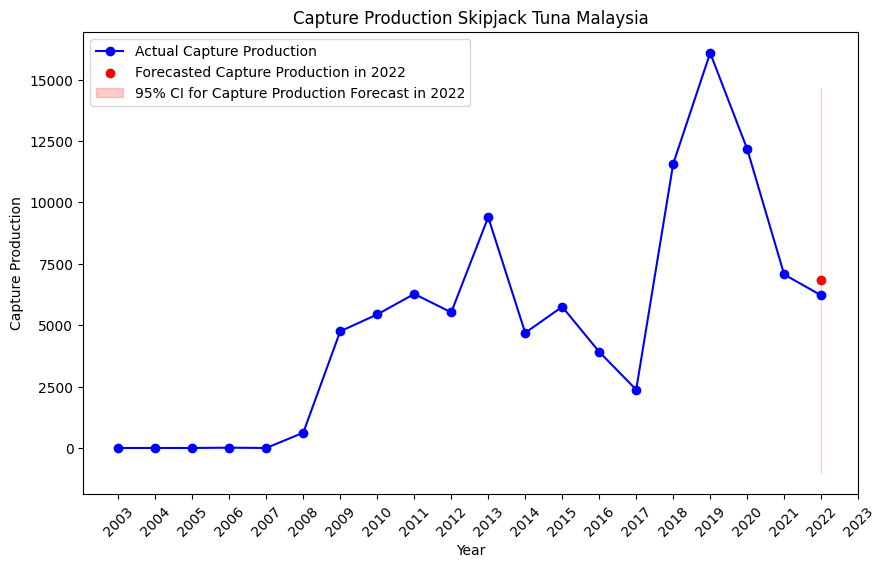

In [166]:
# Plot for CP
years = skipjack_my["PERIOD"].values
values = skipjack_my["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Skipjack Tuna Malaysia")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


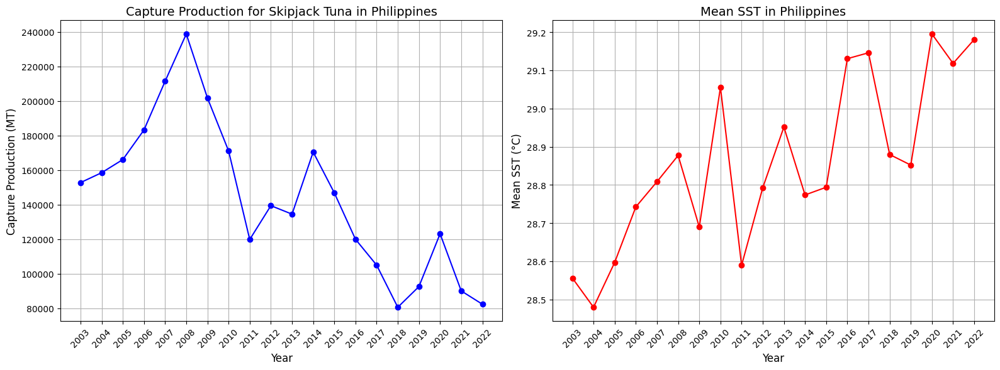

In [167]:
# Extract Skipjack Tuna
skipjack_ph = df_marine[(df_marine["Species"] == "Skipjack tuna") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
skipjack_ph = skipjack_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
skipjack_ph = skipjack_ph.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
skipjack_ph = skipjack_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
skipjack_ph["PERIOD"] = skipjack_ph["PERIOD"].astype(int)

# Assign hidden states by equal intervals
skipjack_ph, midpoint = hs_interval(skipjack_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(skipjack_ph["PERIOD"], skipjack_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Skipjack Tuna in Philippines", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(skipjack_ph["PERIOD"], skipjack_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Philippines", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = skipjack_ph["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

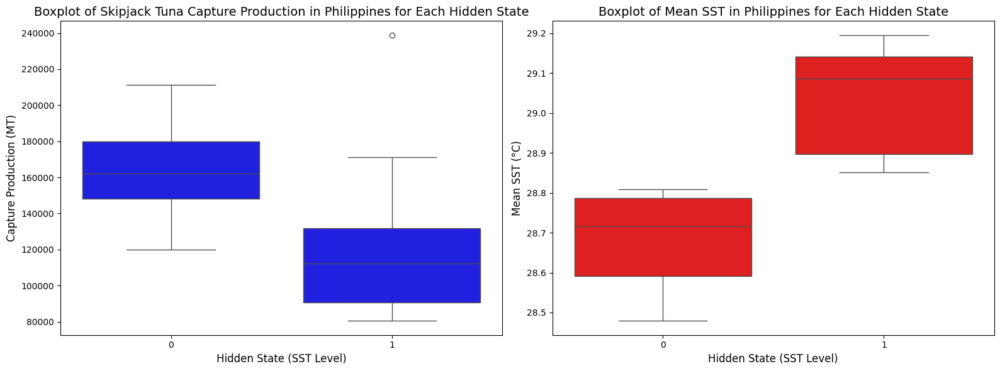

T-statistic: 2.306989075310448, P-value: 0.03647418204320411
Observation Data: 
 [[152740.   ]
 [158480.   ]
 [166081.   ]
 [183221.   ]
 [211440.   ]
 [238787.   ]
 [201782.   ]
 [171110.   ]
 [119807.   ]
 [139394.   ]
 [134484.   ]
 [170444.   ]
 [146789.   ]
 [119938.   ]
 [104964.566]
 [ 80566.   ]
 [ 92551.   ]
 [123117.   ]
 [ 90040.   ]
 [ 82331.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [168]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = skipjack_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Skipjack Tuna Capture Production in Philippines for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = skipjack_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
skipjack_ph_0 = skipjack_ph[skipjack_ph["Hidden State (Interval)"] == 0]["VALUE"]
skipjack_ph_1 = skipjack_ph[skipjack_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(skipjack_ph_0, skipjack_ph_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
skipjack_ph_hs_int = skipjack_ph.pop("Hidden State (Interval)").values

skipjack_ph_x = skipjack_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
skipjack_ph_x = skipjack_ph_x.values

print("Observation Data: \n", skipjack_ph_x)
print("Hidden State - Interval: \n", skipjack_ph_hs_int)

#### Model

In [169]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(skipjack_ph_x, skipjack_ph_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

skipjack_ph = pd.concat([skipjack_ph.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


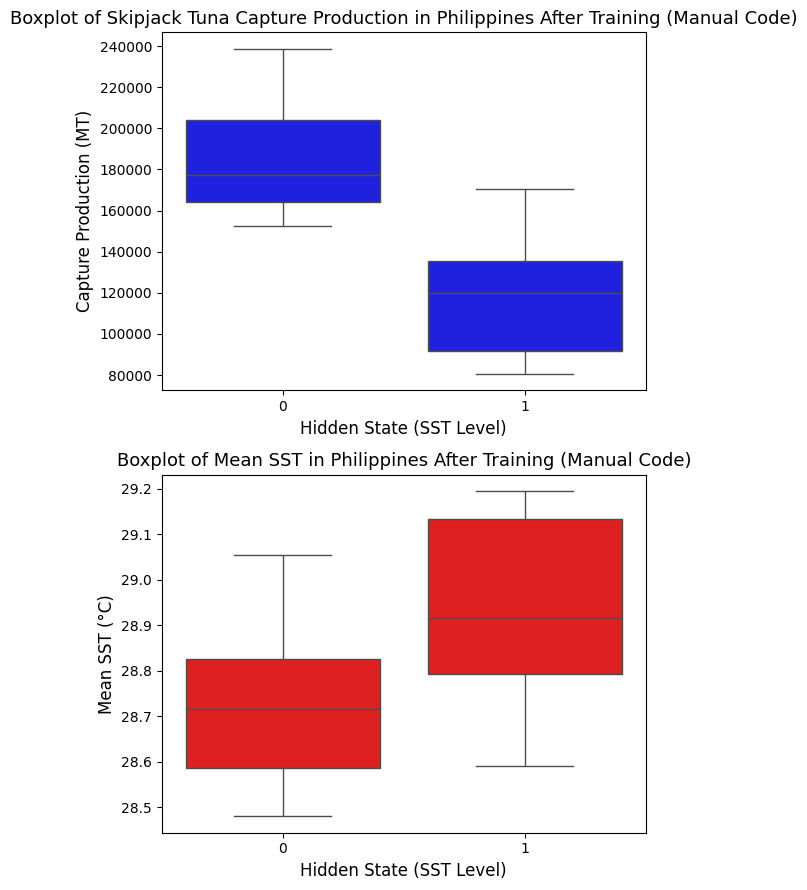

In [170]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = skipjack_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Skipjack Tuna Capture Production in Philippines After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = skipjack_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [171]:
# Mean of every state (trained)
mean_sst_state = skipjack_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = skipjack_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
skipjack_ph_0 = skipjack_ph[skipjack_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
skipjack_ph_1 = skipjack_ph[skipjack_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_ph_0, skipjack_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    28.725611
1    28.950206
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -2.558017291862319, p-value: 0.021193367918951975


#### Re-train

In [172]:
# Manual Code (retrain and forecast)
skipjack_ph_x_retrain = skipjack_ph_x[:-1]
skipjack_ph_hs_int_retrain = skipjack_ph_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(skipjack_ph_x_retrain, skipjack_ph_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1]


In [173]:
# Forecast 2022
sst2022_ph = skipjack_ph[skipjack_ph["PERIOD"] == 2022]["Mean SST"].values

if sst2022_ph < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([69052.2827476543]), array([172567.2299828063]))


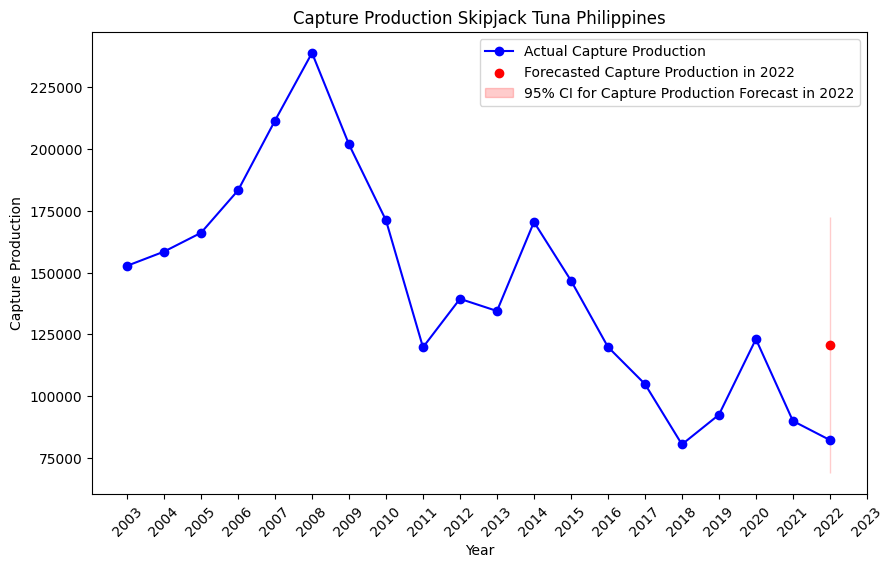

In [174]:
# Plot for CP
years = skipjack_ph["PERIOD"].values
values = skipjack_ph["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Skipjack Tuna Philippines")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Singapore

#### Extract Data

Min SST: 29.746875
Max SST: 30.52909722222222
Midpoint: 30.13798611111111


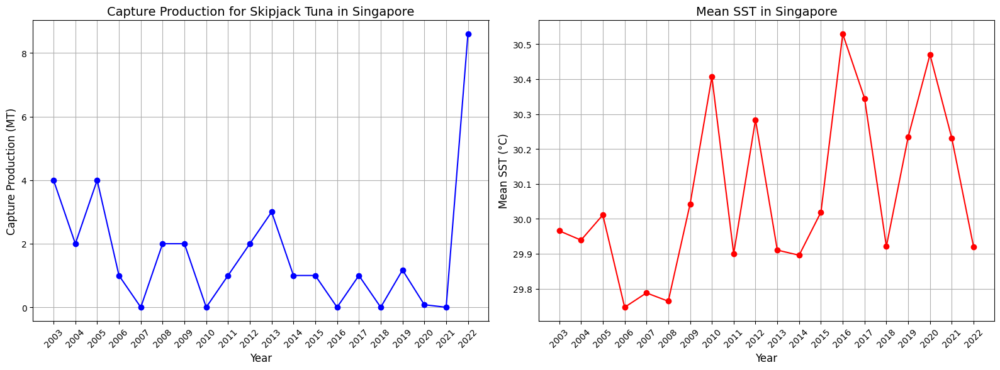

In [182]:
# Extract Skipjack Tuna
skipjack_sg = df_marine[(df_marine["Species"] == "Skipjack tuna") & (df_marine["Country"] == "Singapore")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
skipjack_sg = skipjack_sg[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
skipjack_sg = skipjack_sg.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
skipjack_sg = skipjack_sg.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
skipjack_sg["PERIOD"] = skipjack_sg["PERIOD"].astype(int)

# Assign hidden states by equal intervals
skipjack_sg, midpoint = hs_interval(skipjack_sg)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(skipjack_sg["PERIOD"], skipjack_sg["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Skipjack Tuna in Singapore", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(skipjack_sg["PERIOD"], skipjack_sg["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Singapore", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = skipjack_sg["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

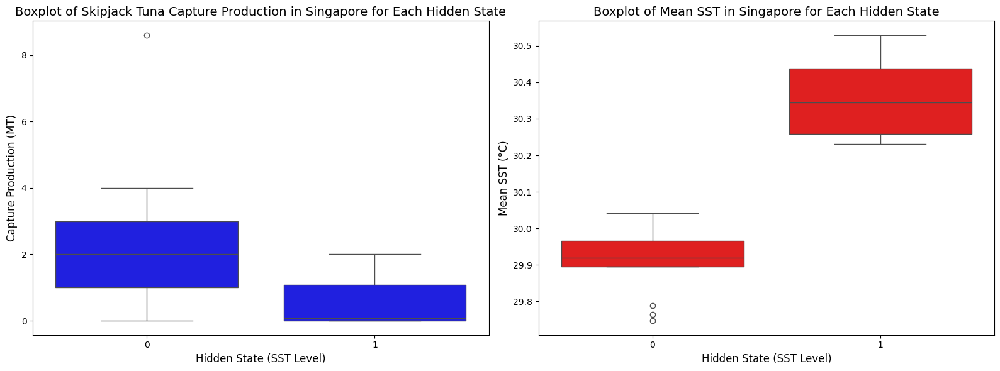

T-statistic: 2.366078538722833, P-value: 0.030670788210267485
Observation Data: 
 [[4.   ]
 [2.   ]
 [4.   ]
 [1.   ]
 [0.   ]
 [2.   ]
 [2.   ]
 [0.   ]
 [1.   ]
 [2.   ]
 [3.   ]
 [1.   ]
 [1.   ]
 [0.   ]
 [1.   ]
 [0.   ]
 [1.172]
 [0.08 ]
 [0.   ]
 [8.6  ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


In [183]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = skipjack_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Skipjack Tuna Capture Production in Singapore for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = skipjack_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Singapore for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
skipjack_sg_0 = skipjack_sg[skipjack_sg["Hidden State (Interval)"] == 0]["VALUE"]
skipjack_sg_1 = skipjack_sg[skipjack_sg["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(skipjack_sg_0, skipjack_sg_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
skipjack_sg_hs_int = skipjack_sg.pop("Hidden State (Interval)").values

skipjack_sg_x = skipjack_sg.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
skipjack_sg_x = skipjack_sg_x.values

print("Observation Data: \n", skipjack_sg_x)
print("Hidden State - Interval: \n", skipjack_sg_hs_int)

#### Model

In [184]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(skipjack_sg_x, skipjack_sg_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

skipjack_sg = pd.concat([skipjack_sg.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


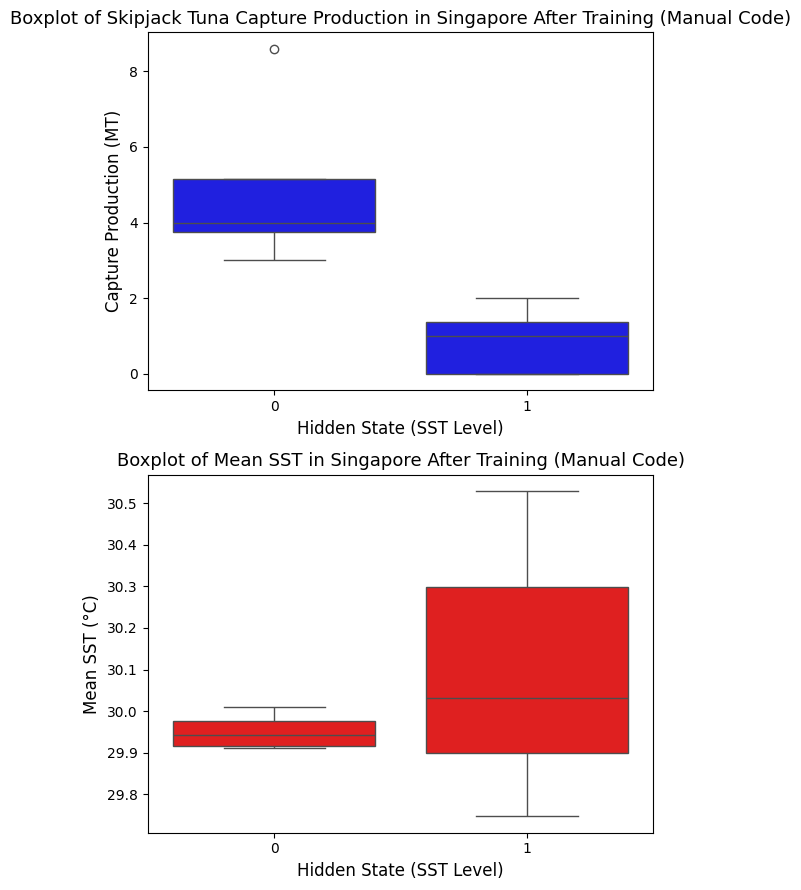

In [185]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = skipjack_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Skipjack Tuna Capture Production in Singapore After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = skipjack_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Singapore After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [186]:
# Mean of every state (trained)
mean_sst_state = skipjack_sg.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = skipjack_sg.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
skipjack_sg_0 = skipjack_sg[skipjack_sg["Predicted HS (Manual Code)"] == 0]["Mean SST"]
skipjack_sg_1 = skipjack_sg[skipjack_sg["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_sg_0, skipjack_sg_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.951712
1    30.094737
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.909475
1    30.357067
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -2.0597339569859447, p-value: 0.05451365160280462


#### Re-train

In [190]:
# Manual Code (retrain and forecast)
skipjack_sg_x_retrain = skipjack_sg_x[:-1]
skipjack_sg_hs_int_retrain = skipjack_sg_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(skipjack_sg_x_retrain, skipjack_sg_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 1 1 0 0 1 1 0 0 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1]


In [191]:
# Forecast 2022
sst2022_sg = skipjack_sg[skipjack_sg["PERIOD"] == 2022]["Mean SST"].values

if sst2022_sg < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 0
Estimated CP for 2022: 
(array([0.6079972092]), array([4.5721517751]))


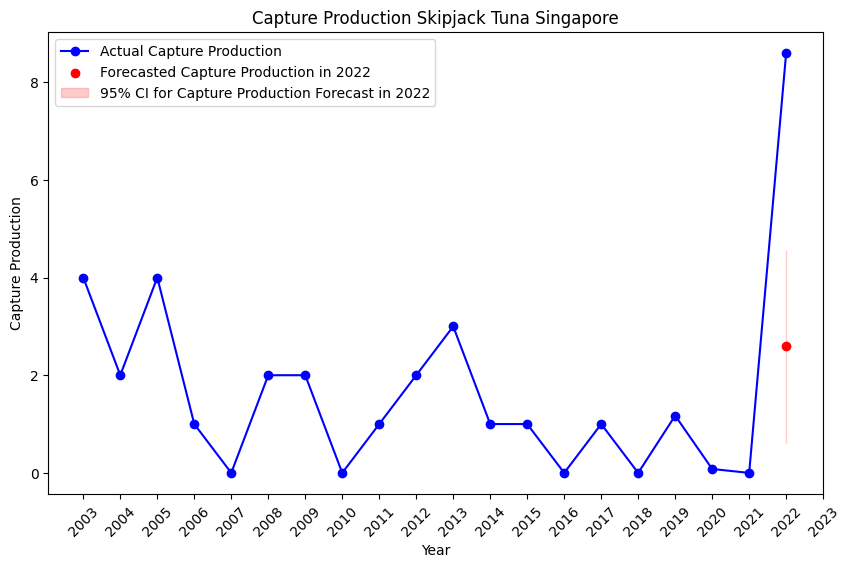

In [192]:
# Plot for CP
years = skipjack_sg["PERIOD"].values
values = skipjack_sg["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Skipjack Tuna Singapore")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


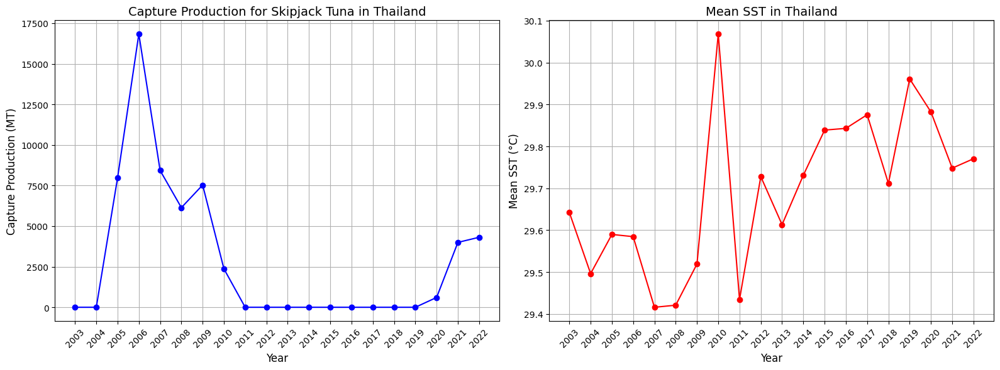

In [193]:
# Extract Skipjack Tuna
skipjack_th = df_marine[(df_marine["Species"] == "Skipjack tuna") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
skipjack_th = skipjack_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
skipjack_th = skipjack_th.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
skipjack_th = skipjack_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
skipjack_th["PERIOD"] = skipjack_th["PERIOD"].astype(int)

# Assign hidden states by equal intervals
skipjack_th, midpoint = hs_interval(skipjack_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(skipjack_th["PERIOD"], skipjack_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Skipjack Tuna in Thailand", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(skipjack_th["PERIOD"], skipjack_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Thailand", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = skipjack_th["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

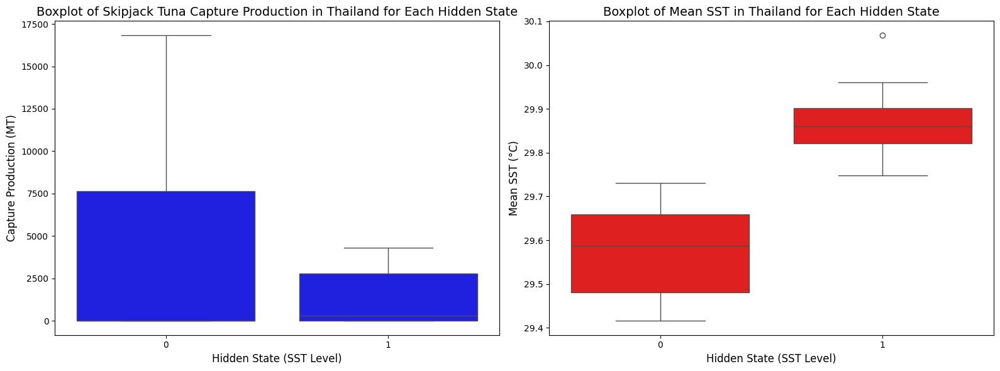

T-statistic: 1.4588279374977344, P-value: 0.16591324809019203
Observation Data: 
 [[    0.]
 [    0.]
 [ 7971.]
 [16836.]
 [ 8428.]
 [ 6138.]
 [ 7532.]
 [ 2369.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [  605.]
 [ 3997.]
 [ 4312.]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [194]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = skipjack_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Skipjack Tuna Capture Production in Thailand for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = skipjack_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Thailand for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
skipjack_th_0 = skipjack_th[skipjack_th["Hidden State (Interval)"] == 0]["VALUE"]
skipjack_th_1 = skipjack_th[skipjack_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(skipjack_th_0, skipjack_th_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
skipjack_th_hs_int = skipjack_th.pop("Hidden State (Interval)").values

skipjack_th_x = skipjack_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
skipjack_th_x = skipjack_th_x.values

print("Observation Data: \n", skipjack_th_x)
print("Hidden State - Interval: \n", skipjack_th_hs_int)

## Common squids nei (model + forecast done)

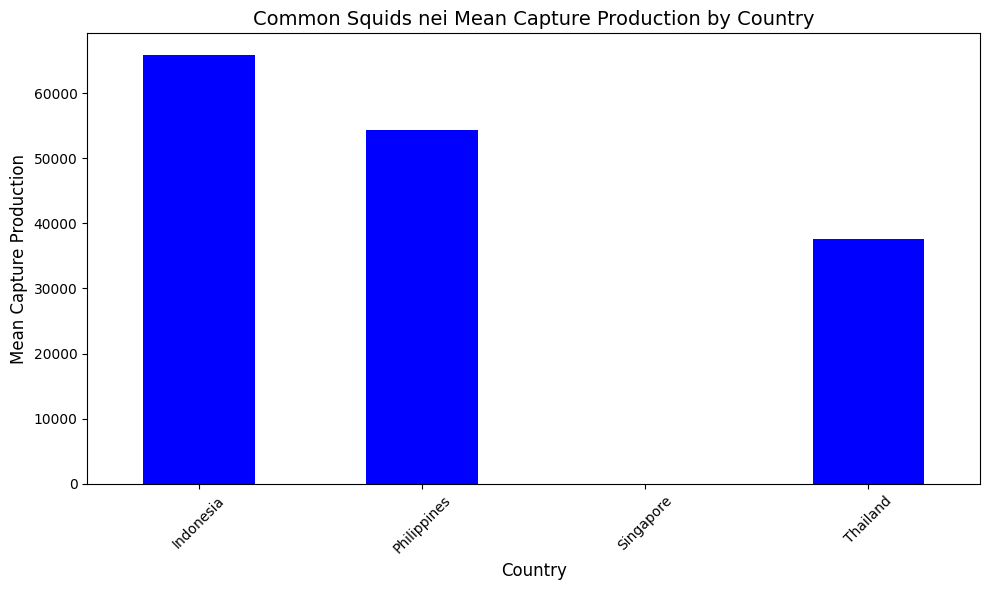

In [195]:
# Plot Common Squids nei bar chart for every country.
common_df = df_marine[df_marine["Species"] == "Common squids nei"]

mean_by_country = common_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Country", fontsize = 12)
plt.ylabel("Mean Capture Production", fontsize = 12)
plt.title("Common Squids nei Mean Capture Production by Country", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


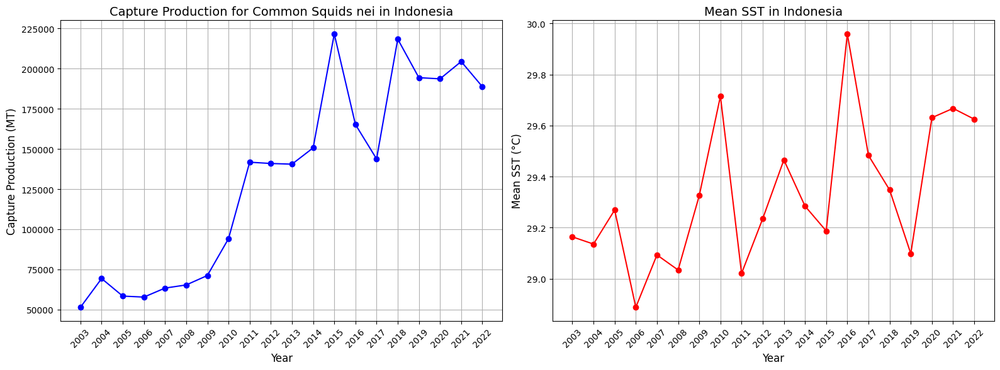

In [65]:
# Extract Common Squids nei
common_id = df_marine[(df_marine["Species"] == "Common squids nei") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
common_id = common_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
common_id = common_id.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
common_id = common_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
common_id["PERIOD"] = common_id["PERIOD"].astype(int)

# Assign hidden states by equal intervals
common_id, midpoint = hs_interval(common_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(common_id["PERIOD"], common_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Common Squids nei in Indonesia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(common_id["PERIOD"], common_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Indonesia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = common_id["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

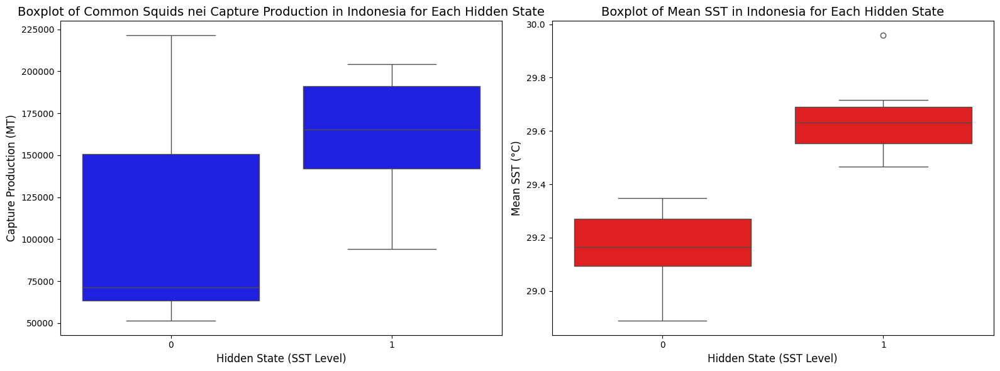

T-statistic: -1.9749025983480004, P-value: 0.06409534337049354
Observation Data: 
 [[ 51482.   ]
 [ 69357.   ]
 [ 58433.   ]
 [ 57821.   ]
 [ 63425.   ]
 [ 65372.   ]
 [ 71236.   ]
 [ 94167.   ]
 [141723.   ]
 [140924.   ]
 [140499.   ]
 [150623.   ]
 [221483.   ]
 [165175.   ]
 [143754.541]
 [218295.12 ]
 [194299.038]
 [193583.839]
 [204337.712]
 [188724.51 ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [66]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = common_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Common Squids nei Capture Production in Indonesia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = common_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
common_id_0 = common_id[common_id["Hidden State (Interval)"] == 0]["VALUE"]
common_id_1 = common_id[common_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(common_id_0, common_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
common_id_hs_int = common_id.pop("Hidden State (Interval)").values

common_id_x = common_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
common_id_x = common_id_x.values

print("Observation Data: \n", common_id_x)
print("Hidden State - Interval: \n", common_id_hs_int)

#### Model

In [67]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(common_id_x, common_id_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

common_id = pd.concat([common_id.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


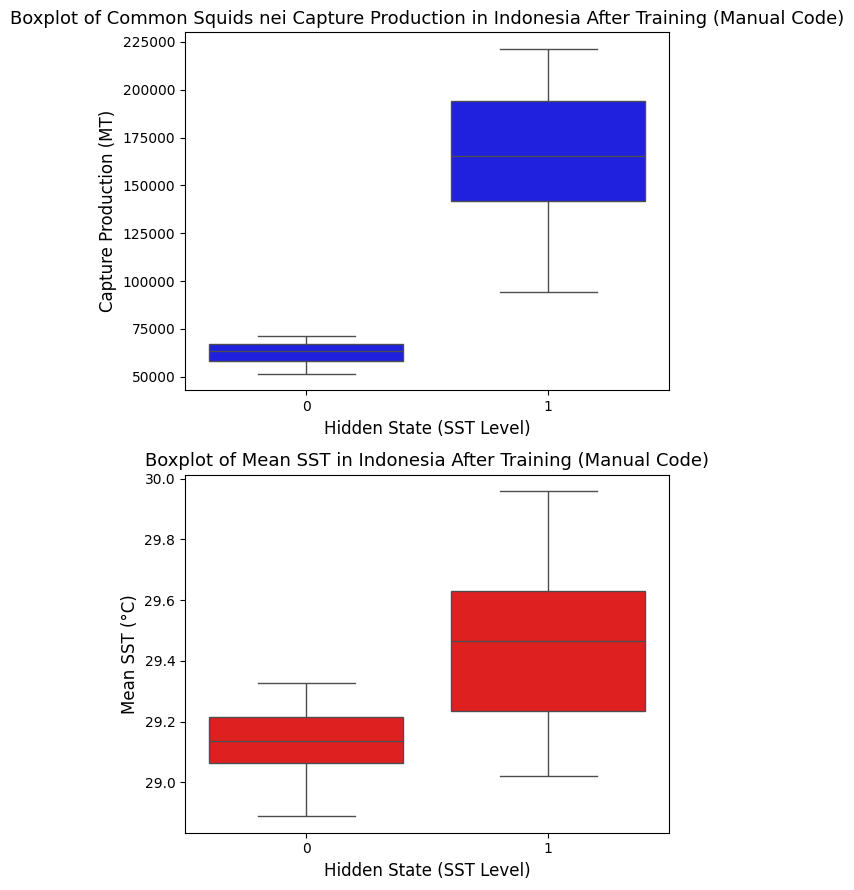

In [68]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = common_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Common Squids nei Capture Production in Indonesia After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = common_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Indonesia After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [69]:
# Mean of every state (trained)
mean_sst_state = common_id.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = common_id.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
common_id_0 = common_id[common_id["Predicted HS (Manual Code)"] == 0]["Mean SST"]
common_id_1 = common_id[common_id["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(common_id_0, common_id_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.130122
1    29.440150
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.160440
1    29.649582
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -3.3010232455507573, p-value: 0.003975030478923213


#### Re-train

In [201]:
# Manual Code (retrain and forecast)
common_id_x_retrain = common_id_x[:-1]
common_id_hs_int_retrain = common_id_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(common_id_x_retrain, common_id_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1]


In [202]:
# Forecast 2022
sst2022_id = common_id[common_id["PERIOD"] == 2022]["Mean SST"].values

if sst2022_id < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([94082.13850548]), array([240433.6165769912]))


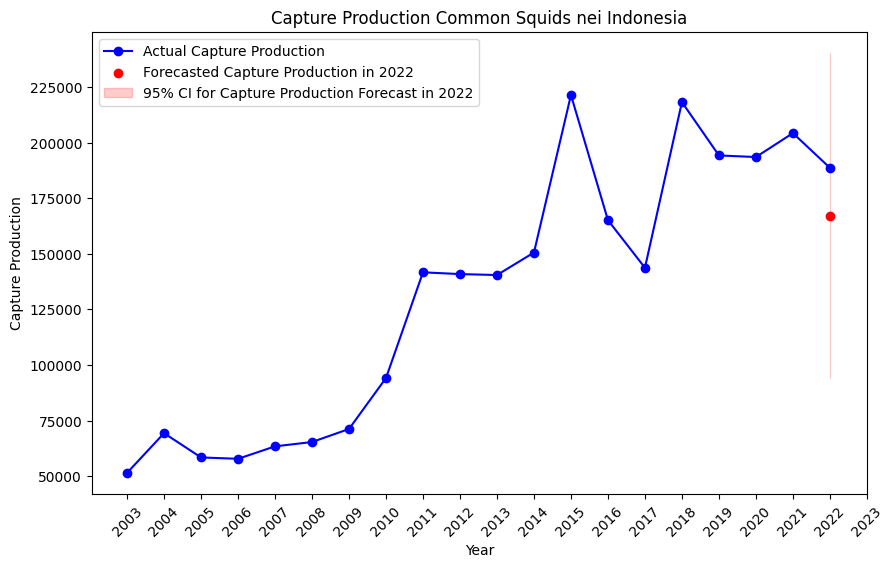

In [204]:
# Plot for CP
years = common_id["PERIOD"].values
values = common_id["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Common Squids nei Indonesia")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


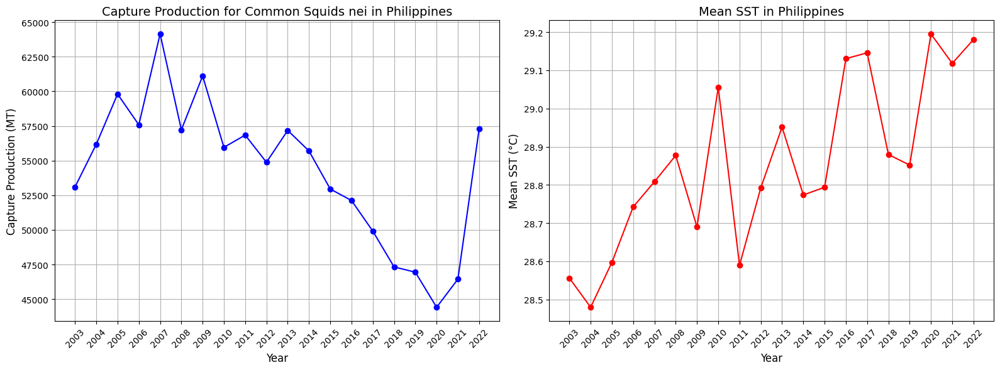

In [18]:
# Extract Common Squids nei
common_ph = df_marine[(df_marine["Species"] == "Common squids nei") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
common_ph = common_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
common_ph = common_ph.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
common_ph = common_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
common_ph["PERIOD"] = common_ph["PERIOD"].astype(int)

# Assign hidden states by equal intervals
common_ph, midpoint = hs_interval(common_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(common_ph["PERIOD"], common_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Common Squids nei in Philippines", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(common_ph["PERIOD"], common_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Philippines", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = common_ph["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

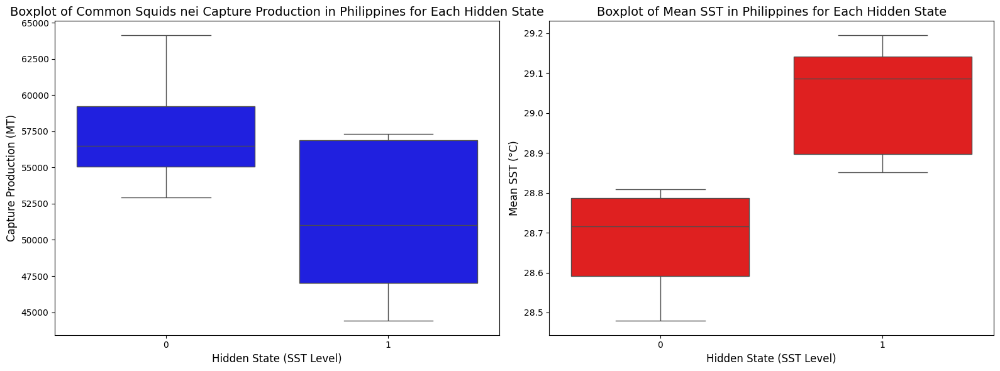

T-statistic: 2.915636349504769, P-value: 0.01007544495514857
Observation Data: 
 [[53100.  ]
 [56181.  ]
 [59801.  ]
 [57585.  ]
 [64139.  ]
 [57223.  ]
 [61112.  ]
 [55957.  ]
 [56842.  ]
 [54878.  ]
 [57183.  ]
 [55693.  ]
 [52949.  ]
 [52119.  ]
 [49909.  ]
 [47327.  ]
 [46946.  ]
 [44415.24]
 [46445.02]
 [57302.61]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [19]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = common_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Common Squids nei Capture Production in Philippines for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = common_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
common_ph_0 = common_ph[common_ph["Hidden State (Interval)"] == 0]["VALUE"]
common_ph_1 = common_ph[common_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(common_ph_0, common_ph_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
common_ph_hs_int = common_ph.pop("Hidden State (Interval)").values

common_ph_x = common_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
common_ph_x = common_ph_x.values

print("Observation Data: \n", common_ph_x)
print("Hidden State - Interval: \n", common_ph_hs_int)

#### Model

In [20]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(common_ph_x, common_ph_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

common_ph = pd.concat([common_ph.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 0]
Actual HS (last 5 test)    : [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


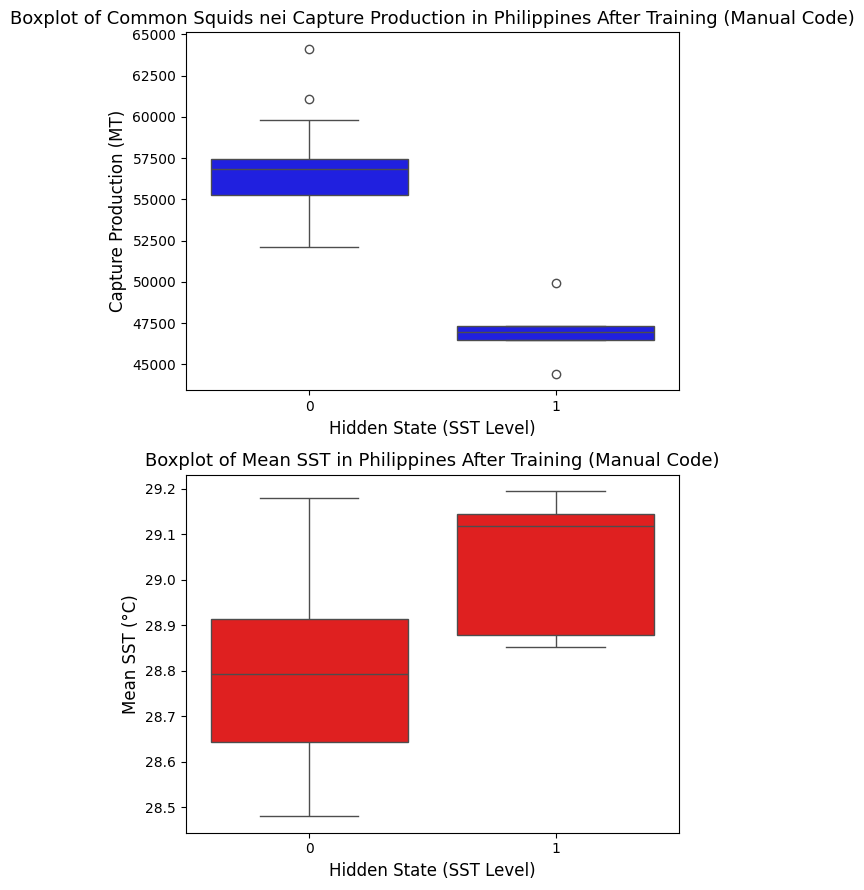

In [21]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = common_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Common Squids nei Capture Production in Philippines After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = common_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Philippines After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [22]:
# Mean of every state (trained)
mean_sst_state = common_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = common_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
common_ph_0 = common_ph[common_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
common_ph_1 = common_ph[common_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(common_ph_0, common_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    28.801119
1    29.038116
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -2.6423166087740015, p-value: 0.026779964234757196


#### Re-train

In [23]:
# Manual Code (retrain and forecast)
common_ph_x_retrain = common_ph_x[:-1]
common_ph_hs_int_retrain = common_ph_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(common_ph_x_retrain, common_ph_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1]


In [24]:
# Forecast 2022
sst2022_ph = common_ph[common_ph["PERIOD"] == 2022]["Mean SST"].values

if sst2022_ph < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([43417.1357515356]), array([50607.3053026498]))


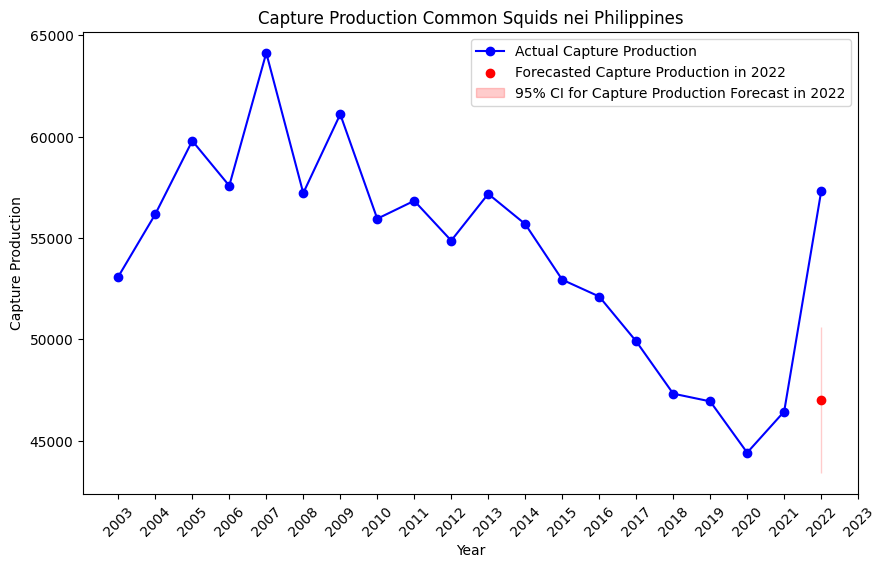

In [25]:
# Plot for CP
years = common_ph["PERIOD"].values
values = common_ph["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Common Squids nei Philippines")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Singapore

#### Extract Data

Min SST: 29.746875
Max SST: 30.52909722222222
Midpoint: 30.13798611111111


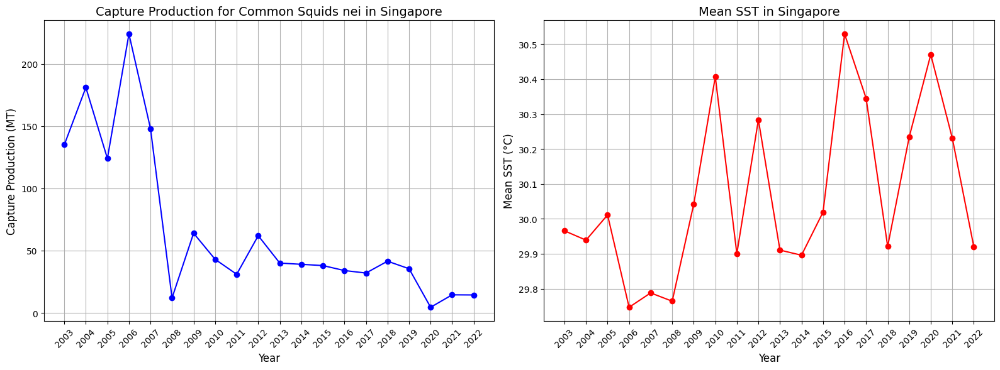

In [29]:
# Extract Common Squids nei
common_sg = df_marine[(df_marine["Species"] == "Common squids nei") & (df_marine["Country"] == "Singapore")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
common_sg = common_sg[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
common_sg = common_sg.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
common_sg = common_sg.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
common_sg["PERIOD"] = common_sg["PERIOD"].astype(int)

# Assign hidden states by equal intervals
common_sg, midpoint = hs_interval(common_sg)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(common_sg["PERIOD"], common_sg["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Common Squids nei in Singapore", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(common_sg["PERIOD"], common_sg["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Singapore", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = common_sg["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

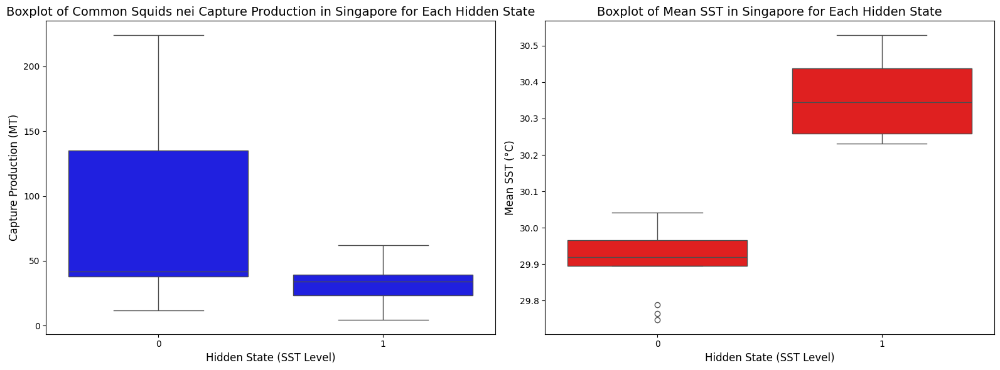

T-statistic: 2.5133266933824023, P-value: 0.02397028427956498
Observation Data: 
 [[135.   ]
 [181.   ]
 [124.   ]
 [224.   ]
 [148.   ]
 [ 12.   ]
 [ 64.   ]
 [ 43.   ]
 [ 31.   ]
 [ 62.   ]
 [ 40.   ]
 [ 39.   ]
 [ 38.   ]
 [ 34.   ]
 [ 32.   ]
 [ 41.5  ]
 [ 35.461]
 [  4.5  ]
 [ 14.5  ]
 [ 14.4  ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


In [30]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = common_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Common Squids nei Capture Production in Singapore for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = common_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Singapore for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
common_sg_0 = common_sg[common_sg["Hidden State (Interval)"] == 0]["VALUE"]
common_sg_1 = common_sg[common_sg["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(common_sg_0, common_sg_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
common_sg_hs_int = common_sg.pop("Hidden State (Interval)").values

common_sg_x = common_sg.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
common_sg_x = common_sg_x.values

print("Observation Data: \n", common_sg_x)
print("Hidden State - Interval: \n", common_sg_hs_int)

#### Model

In [31]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(common_sg_x, common_sg_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

common_sg = pd.concat([common_sg.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


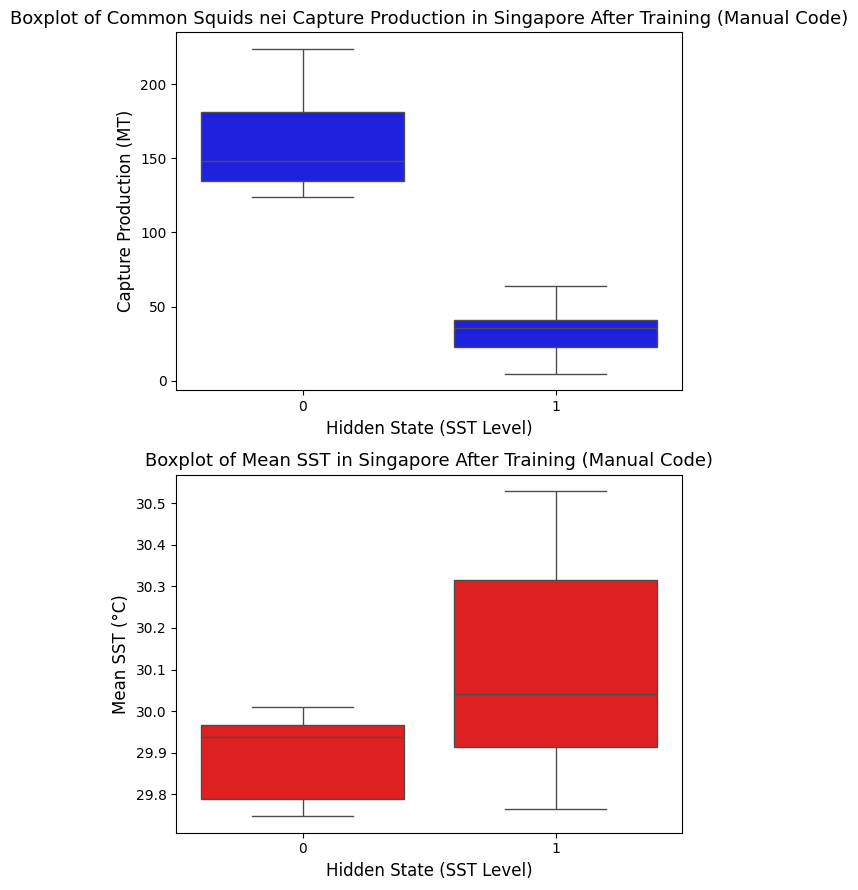

In [32]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = common_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Common Squids nei Capture Production in Singapore After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = common_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Singapore After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [33]:
# Mean of every state (trained)
mean_sst_state = common_sg.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = common_sg.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
common_sg_0 = common_sg[common_sg["Predicted HS (Manual Code)"] == 0]["Mean SST"]
common_sg_1 = common_sg[common_sg["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(common_sg_0, common_sg_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.890153
1    30.124792
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.909475
1    30.357067
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -2.8701110743493183, p-value: 0.011577996906100996


#### Re-train

In [34]:
# Manual Code (retrain and forecast)
common_sg_x_retrain = common_sg_x[:-1]
common_sg_hs_int_retrain = common_sg_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(common_sg_x_retrain, common_sg_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1]


In [35]:
# Forecast 2022
sst2022_sg = common_sg[common_sg["PERIOD"] == 2022]["Mean SST"].values

if sst2022_sg < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 0
Estimated CP for 2022: 
(array([91.3060899011]), array([233.4820844686]))


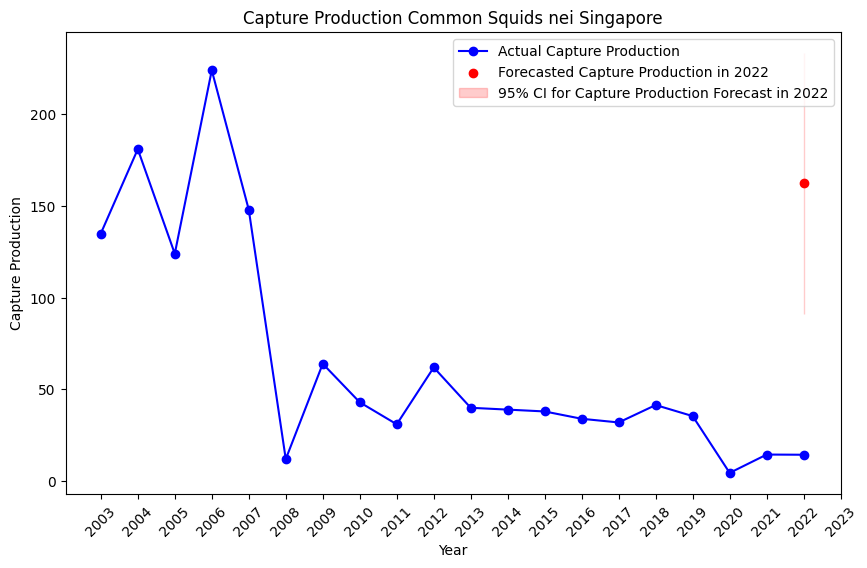

In [36]:
# Plot for CP
years = common_sg["PERIOD"].values
values = common_sg["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Common Squids nei Singapore")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

## Indian mackerels nei

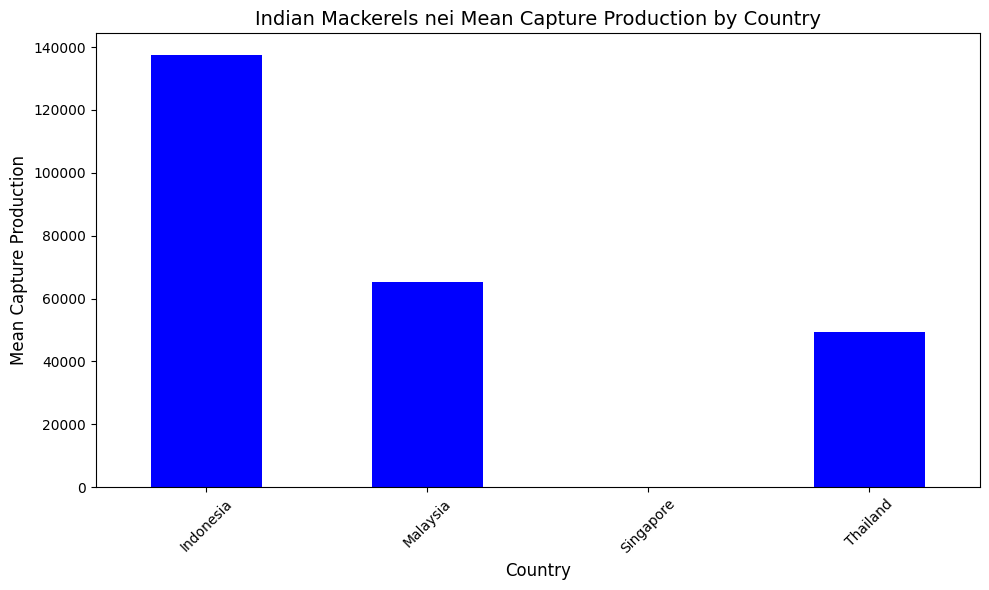

In [37]:
# Plot Indian Mackerels nei bar chart for every country.
indian_df = df_marine[df_marine["Species"] == "Indian mackerels nei"]

mean_by_country = indian_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Country", fontsize = 12)
plt.ylabel("Mean Capture Production", fontsize = 12)
plt.title("Indian Mackerels nei Mean Capture Production by Country", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


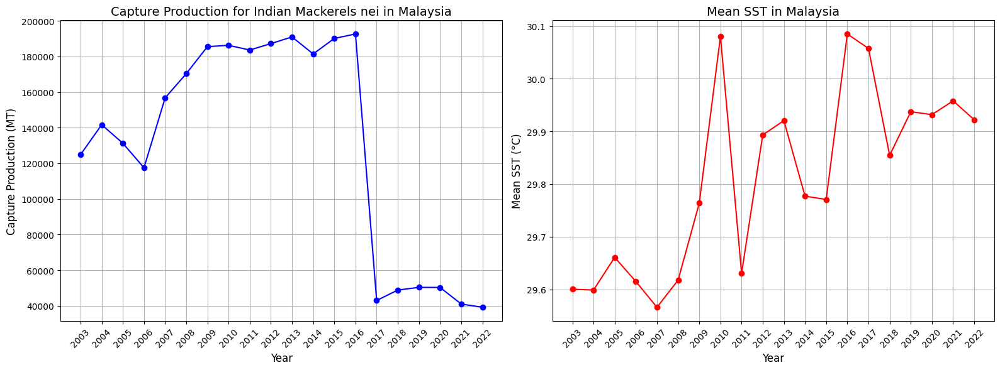

In [38]:
# Extract Indian Mackerels nei
indian_my = df_marine[(df_marine["Species"] == "Indian mackerels nei") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
indian_my = indian_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
indian_my = indian_my.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
indian_my = indian_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
indian_my["PERIOD"] = indian_my["PERIOD"].astype(int)

# Assign hidden states by equal intervals
indian_my, midpoint = hs_interval(indian_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(indian_my["PERIOD"], indian_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Indian Mackerels nei in Malaysia", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(indian_my["PERIOD"], indian_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Malaysia", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = indian_my["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

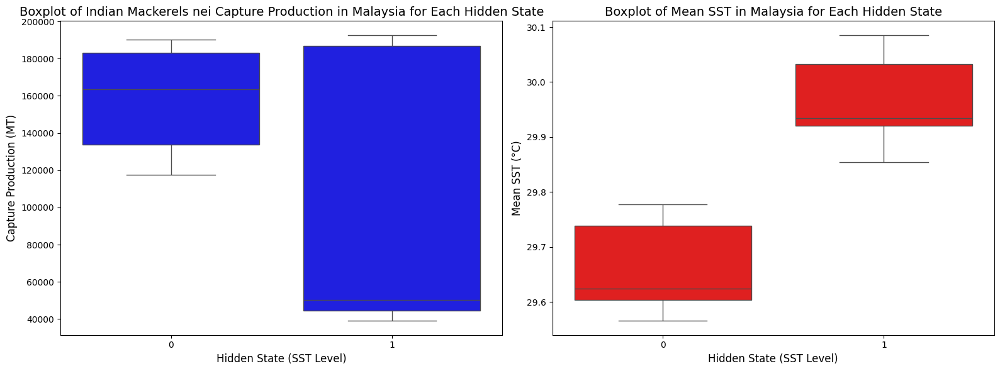

T-statistic: 2.205418493045714, P-value: 0.04872707913354341
Observation Data: 
 [[124858.   ]
 [141632.   ]
 [131272.   ]
 [117475.   ]
 [156687.   ]
 [170321.   ]
 [185490.   ]
 [186225.   ]
 [183590.   ]
 [187190.   ]
 [190942.   ]
 [181376.   ]
 [190088.   ]
 [192596.   ]
 [ 42953.   ]
 [ 48815.   ]
 [ 50318.027]
 [ 50280.176]
 [ 40960.   ]
 [ 39147.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [39]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = indian_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Indian Mackerels nei Capture Production in Malaysia for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = indian_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
indian_my_0 = indian_my[indian_my["Hidden State (Interval)"] == 0]["VALUE"]
indian_my_1 = indian_my[indian_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(indian_my_0, indian_my_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
indian_my_hs_int = indian_my.pop("Hidden State (Interval)").values

indian_my_x = indian_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
indian_my_x = indian_my_x.values

print("Observation Data: \n", indian_my_x)
print("Hidden State - Interval: \n", indian_my_hs_int)

#### Model

In [40]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(indian_my_x, indian_my_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

indian_my = pd.concat([indian_my.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


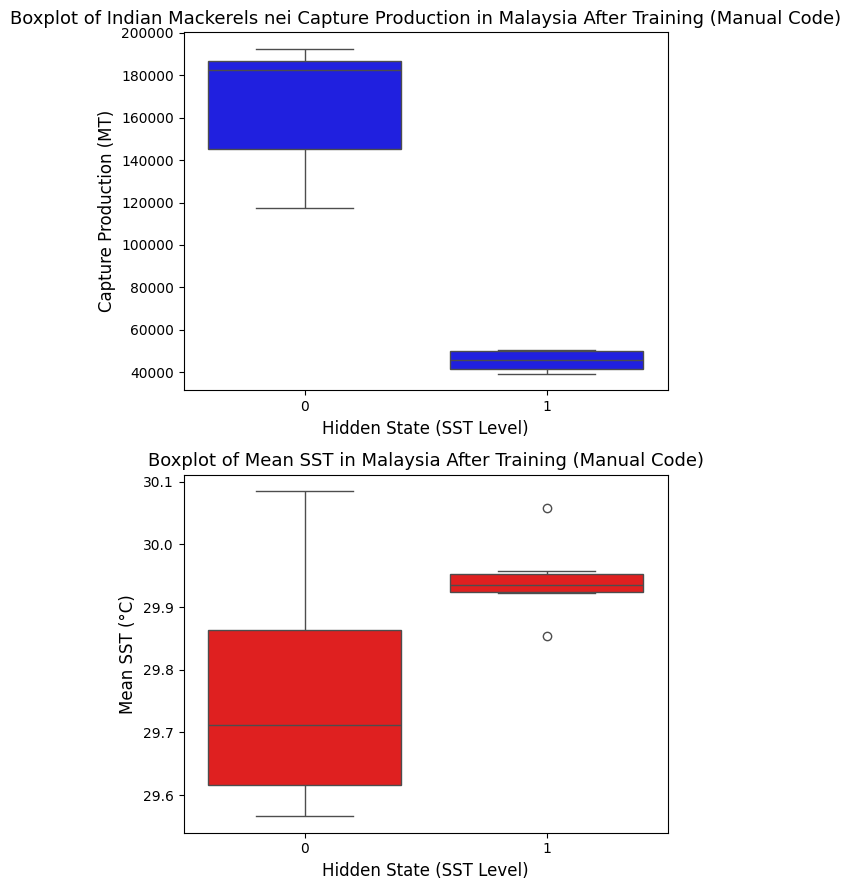

In [41]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = indian_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Indian Mackerels nei Capture Production in Malaysia After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = indian_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Malaysia After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [43]:
# Mean of every state (trained)
mean_sst_state = indian_my.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = indian_my.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
indian_my_0 = indian_my[indian_my["Predicted HS (Manual Code)"] == 0]["Mean SST"]
indian_my_1 = indian_my[indian_my["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(indian_my_0, indian_my_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.755627
1    29.943617
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.659935
1    29.964113
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -3.446184576832158, p-value: 0.002900337152223344


#### Re-train

In [44]:
# Manual Code (retrain and forecast)
indian_my_x_retrain = indian_my_x[:-1]
indian_my_hs_int_retrain = indian_my_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(indian_my_x_retrain, indian_my_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1]


In [45]:
# Forecast 2022
sst2022_my = indian_my[indian_my["PERIOD"] == 2022]["Mean SST"].values

if sst2022_my < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([38932.1987473961]), array([54399.6135284124]))


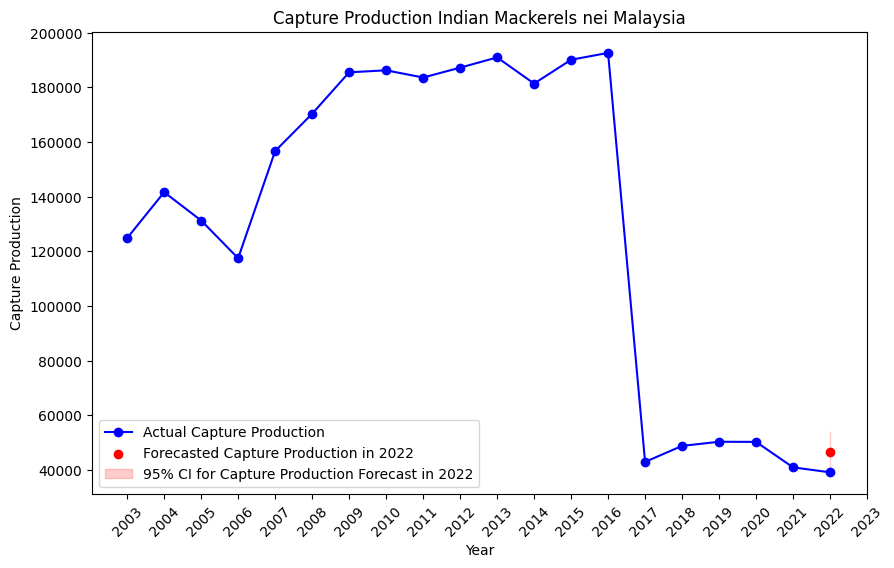

In [46]:
# Plot for CP
years = indian_my["PERIOD"].values
values = indian_my["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Indian Mackerels nei Malaysia")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()

### Singapore

#### Extract Data

Min SST: 29.746875
Max SST: 30.52909722222222
Midpoint: 30.13798611111111


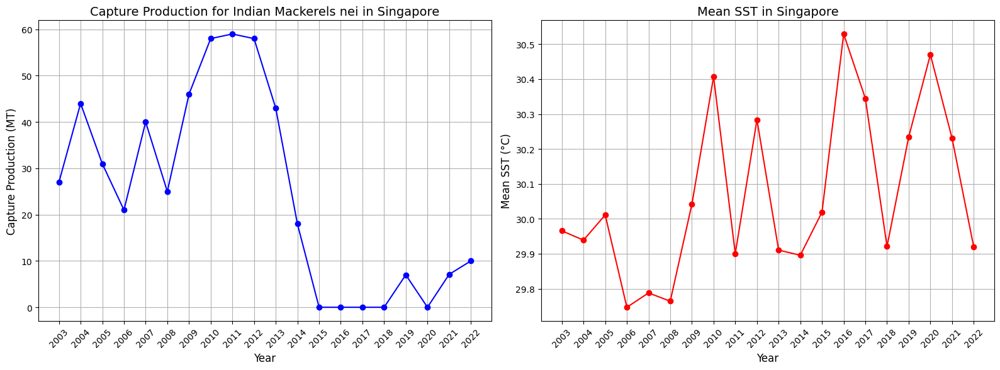

In [49]:
# Extract Indian Mackerels nei
indian_sg = df_marine[(df_marine["Species"] == "Indian mackerels nei") & (df_marine["Country"] == "Singapore")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
indian_sg = indian_sg[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
indian_sg = indian_sg.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
indian_sg = indian_sg.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
indian_sg["PERIOD"] = indian_sg["PERIOD"].astype(int)

# Assign hidden states by equal intervals
indian_sg, midpoint = hs_interval(indian_sg)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(indian_sg["PERIOD"], indian_sg["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Indian Mackerels nei in Singapore", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(indian_sg["PERIOD"], indian_sg["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Singapore", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = indian_sg["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

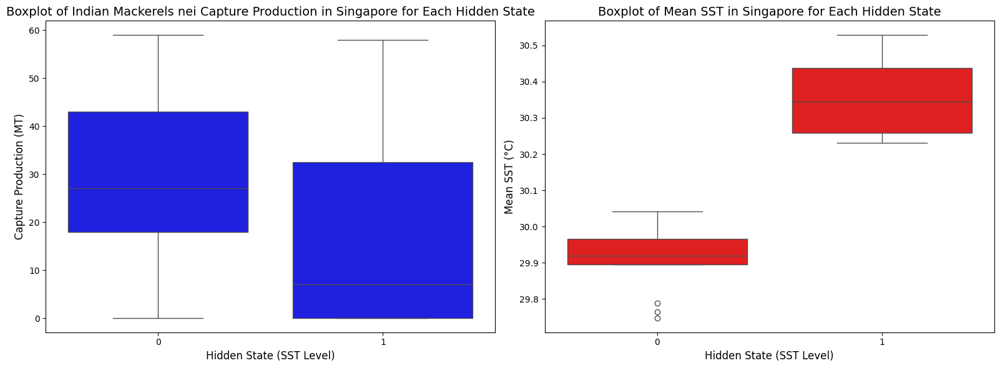

T-statistic: 0.8243106459397523, P-value: 0.4310729634927608
Observation Data: 
 [[27. ]
 [44. ]
 [31. ]
 [21. ]
 [40. ]
 [25. ]
 [46. ]
 [58. ]
 [59. ]
 [58. ]
 [43. ]
 [18. ]
 [ 0. ]
 [ 0. ]
 [ 0. ]
 [ 0. ]
 [ 7. ]
 [ 0. ]
 [ 7.1]
 [10. ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


In [50]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = indian_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Indian Mackerels nei Capture Production in Singapore for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = indian_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Singapore for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
indian_sg_0 = indian_sg[indian_sg["Hidden State (Interval)"] == 0]["VALUE"]
indian_sg_1 = indian_sg[indian_sg["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(indian_sg_0, indian_sg_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
indian_sg_hs_int = indian_sg.pop("Hidden State (Interval)").values

indian_sg_x = indian_sg.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
indian_sg_x = indian_sg_x.values

print("Observation Data: \n", indian_sg_x)
print("Hidden State - Interval: \n", indian_sg_hs_int)

### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


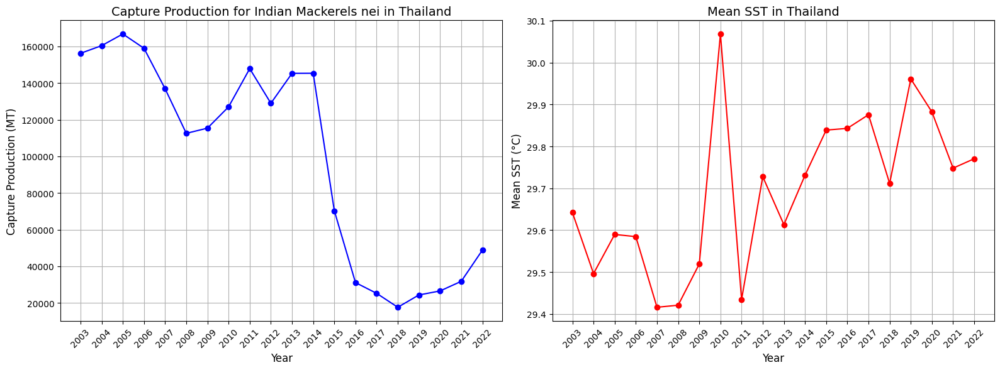

In [57]:
# Extract Indian Mackerels nei
indian_th = df_marine[(df_marine["Species"] == "Indian mackerels nei") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
indian_th = indian_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
indian_th = indian_th.sort_values(by="PERIOD")

# Combining capture production recorded in different regions
indian_th = indian_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Typecast PERIOD to integer
indian_th["PERIOD"] = indian_th["PERIOD"].astype(int)

# Assign hidden states by equal intervals
indian_th, midpoint = hs_interval(indian_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(indian_th["PERIOD"], indian_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Capture Production for Indian Mackerels nei in Thailand", fontsize = 14)
axes[0].set_xlabel("Year", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)
axes[0].grid(True)

axes[1].plot(indian_th["PERIOD"], indian_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Mean SST in Thailand", fontsize = 14)
axes[1].set_xlabel("Year", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)
axes[1].grid(True)

years = indian_th["PERIOD"].unique()
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation = 45)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation = 45)

plt.tight_layout()
plt.show()

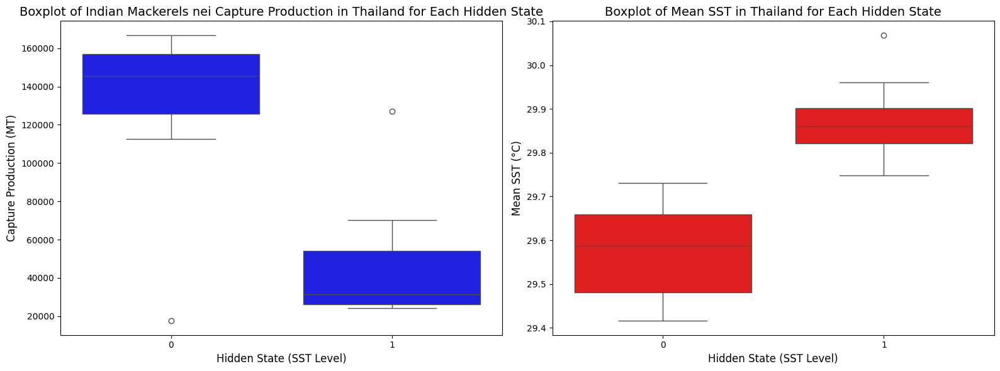

T-statistic: 4.950410882040344, P-value: 0.00013435490095567798
Observation Data: 
 [[156223.  ]
 [160398.  ]
 [166766.  ]
 [158979.  ]
 [136839.  ]
 [112557.  ]
 [115378.  ]
 [127006.  ]
 [147852.  ]
 [128958.  ]
 [145300.  ]
 [145341.  ]
 [ 70303.  ]
 [ 31120.42]
 [ 25258.7 ]
 [ 17654.9 ]
 [ 24373.91]
 [ 26561.81]
 [ 31809.56]
 [ 48828.27]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [58]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = indian_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Indian Mackerels nei Capture Production in Thailand for Each Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = indian_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Thailand for Each Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
indian_th_0 = indian_th[indian_th["Hidden State (Interval)"] == 0]["VALUE"]
indian_th_1 = indian_th[indian_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(indian_th_0, indian_th_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
indian_th_hs_int = indian_th.pop("Hidden State (Interval)").values

indian_th_x = indian_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
indian_th_x = indian_th_x.values

print("Observation Data: \n", indian_th_x)
print("Hidden State - Interval: \n", indian_th_hs_int)

#### Model

In [59]:
# HMM Library
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm(indian_th_x, indian_th_hs_int, n_states, n_iter)

# Concat predicted HS
predhs_hmm = pd.DataFrame(predhs_x, columns = ["Predicted HS (Manual Code)"])
actualhs = pd.DataFrame(y, columns = ["Assigned Hidden State"])

indian_th = pd.concat([indian_th.reset_index(drop = True), actualhs, predhs_hmm], axis = 1)

Manual Code - Interval HS
Predicted HS (last 5 test) : [0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1]
Actual HS (last 5 test)    : [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


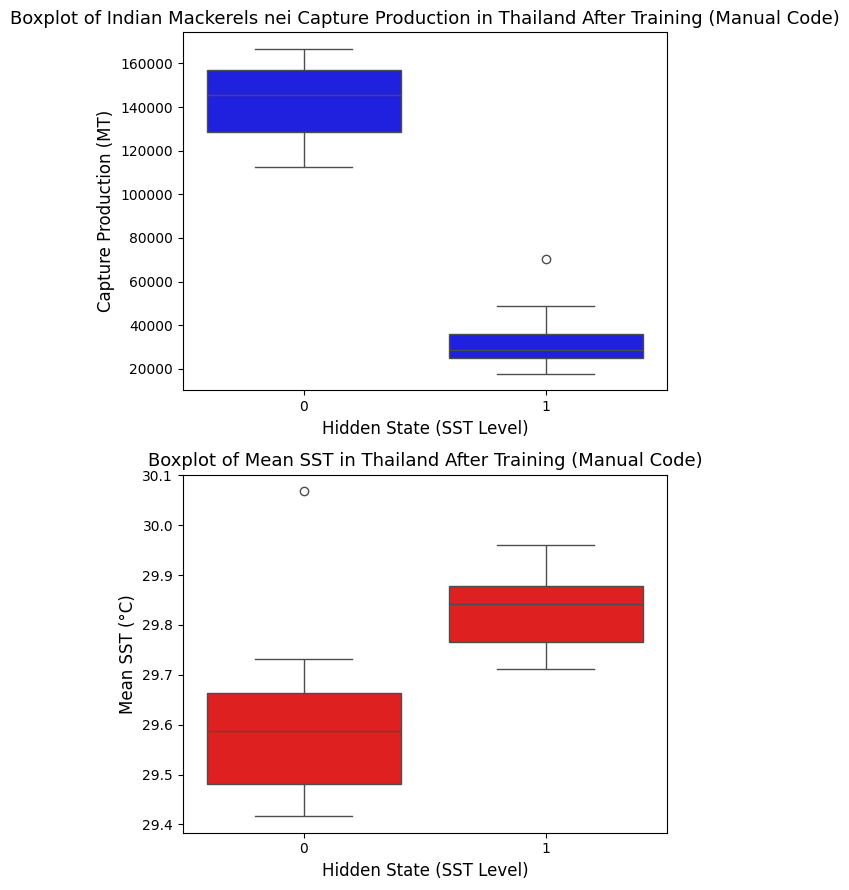

In [60]:
# Boxplot for each HS (Manual Code)
fig, axes = plt.subplots(2, 1, figsize = (6, 9), sharey = False)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "VALUE", data = indian_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot of Indian Mackerels nei Capture Production in Thailand After Training (Manual Code)", fontsize = 13)
axes[0].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[0].set_ylabel("Capture Production (MT)", fontsize = 12)

sns.boxplot(x = "Predicted HS (Manual Code)", y = "Mean SST", data = indian_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot of Mean SST in Thailand After Training (Manual Code)", fontsize = 13)
axes[1].set_xlabel("Hidden State (SST Level)", fontsize = 12)
axes[1].set_ylabel("Mean SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

In [61]:
# Mean of every state (trained)
mean_sst_state = indian_th.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state): \n", mean_sst_state)

mean_sst_state = indian_th.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

# Welch's t-test for each HS (trained)
indian_th_0 = indian_th[indian_th["Predicted HS (Manual Code)"] == 0]["Mean SST"]
indian_th_1 = indian_th[indian_th["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(indian_th_0, indian_th_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

Mean SST (based on predicted hidden state): 
 Predicted HS (Manual Code)
0    29.603765
1    29.828902
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.574047
1    29.873479
Name: Mean SST, dtype: float64
HMM Learn -- t-statistic: -3.7532495373066643, p-value: 0.0016902491905740444


#### Re-train

In [62]:
# Manual Code (retrain and forecast)
indian_th_x_retrain = indian_th_x[:-1]
indian_th_hs_int_retrain = indian_th_hs_int[:-1]

print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x, y, predhs_x = manualhmm_retrain(indian_th_x_retrain, indian_th_hs_int_retrain, n_states, n_iter)

Manual Code - Interval HS
Predicted HS: [0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS:    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1]


In [63]:
# Forecast 2022
sst2022_th = indian_th[indian_th["PERIOD"] == 2022]["Mean SST"].values

if sst2022_th < midpoint:
    hs = 0
else:
    hs = 1
    
mean = trained_means[hs]
cov = trained_covars[hs]
std = np.sqrt(np.diag(cov))

ci_range = (mean - 1.96 * std, mean + 1.96 * std)

print("HS at 2022:", hs)
print("Estimated CP for 2022: ")
print(ci_range)

HS at 2022: 1
Estimated CP for 2022: 
(array([972.3124118314]), array([63884.0136902729]))


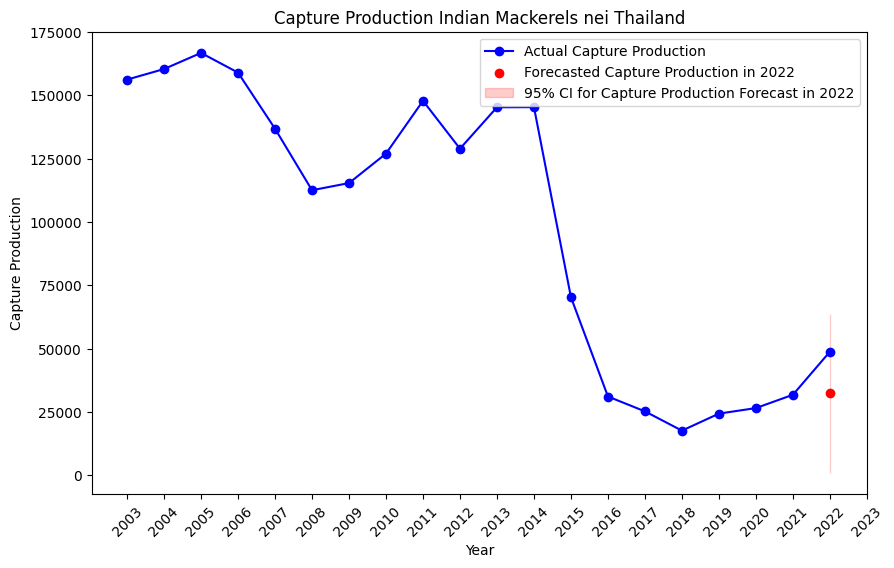

In [64]:
# Plot for CP
years = indian_th["PERIOD"].values
values = indian_th["VALUE"].values
forecast_year = 2022
forecast_mean = np.mean(ci_range)
lower_bound, upper_bound = ci_range

plt.figure(figsize=(10, 6))
plt.plot(years, values, label = "Actual Capture Production", color = "blue", marker = "o")
plt.scatter(forecast_year, forecast_mean, color = "red", label = "Forecasted Capture Production in 2022", zorder = 3)
plt.fill_between([forecast_year], lower_bound, upper_bound, color = "red", alpha = 0.2, label = "95% CI for Capture Production Forecast in 2022")

plt.title("Capture Production Indian Mackerels nei Thailand")
plt.xlabel("Year")
plt.ylabel("Capture Production")
plt.xticks(range(2003, 2024), rotation=45)
plt.legend()
plt.show()